# Read files

In [1]:
# import libraries
import numpy as np
import pandas as pd
import os, h5py
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
warnings.filterwarnings("ignore")
from scipy import stats
from codes import jason_plotting as plotting
mpl.rcParams.update(mpl.rcParamsDefault)
plt.style.use('/Users/jasonwu/Programs/codes/def.mplstyle')
plotting.plot_prettier(dpi=400,usetex=False)
%matplotlib inline


Bad key grid.zorder in file /Users/jasonwu/Programs/codes/def.mplstyle, line 19 ('grid.zorder : 2.5')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.7.1/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
# global variables
ECALZ_MIN = 247.9
ECALZ_MAX = 749.1
ECALW = 260

HCALZ_MIN = 879

# the style used for the confidence range plots
# 0: area
# 1: error bars
style = 1

def plot_ecal_box(ax):
    ax.add_patch(plt.Rectangle((ECALZ_MIN, -ECALW), ECALZ_MAX - ECALZ_MIN, ECALW * 2, fc=(0, 0, 0, 0), ec='red', label='ECal'))
    
def plot_hcal_box(ax):
    ax.axvline(x=HCALZ_MIN, lw=2, ls='--', color='red', label='HCal')

## Particles Class

In [3]:
labels_keys = 'electron neutron photon pion proton electron_hcal neutron_hcal photon_hcal pion_hcal proton_hcal'.split(' ')
labels_values = [
    r'Electrons $e^{\minus}$',
    r'Neutrons $n^{o}$',
    r'Photons $\gamma$',
    r'Pions $\pi^{\minus}$',
    r'Protons $p^{\plus}$',
    r'Electrons $e^{\minus}$ HCal',
    r'Neutrons $n^{o}$ HCal',
    r'Photons $\gamma$ HCal',
    r'Pions $\pi^{\minus}$ HCal',
    r'Protons $p^{\plus}$ HCal'
]

labels_dict = {labels_keys[i]: labels_values[i] for i in range(len(labels_keys))}

In [4]:
# initiate a particle class
class Particles():
    def __init__(self, hf, zero_on='PFTruthEcal_energy'):
        # a list of properties
        self.propdict = {}
        # initiate all properties
        for prop in hf.keys():
            # convert to numpy array
            self.propdict[prop] = hf[prop][()]
        self._clean_props(zero_on)
    
    # clean the data set
    def _clean_props(self, zero_on='PFTruthEcal_energy'):
        # remove on column
        if isinstance(zero_on, list):
            # invalid energy values
            zero_bool_mask = np.array(self.propdict[zero_on[0]] <= 0)
            for zero_col in zero_on[1:]:
                zero_bool_mask = np.logical_and(zero_bool_mask, np.array(self.propdict[zero_col] <= 0))
        else:
            zero_bool_mask = np.array(self.propdict[zero_on] <= 0)
            
        print(f'{np.sum(zero_bool_mask)} values removed from {zero_on}')
        
        for prop in list(self.propdict.keys()):
            nan_bool_mask = np.isnan(self.propdict[prop])
            if np.any(nan_bool_mask):
                print(f'{np.sum(nan_bool_mask):<10} NaN values for {prop}')
                # set the values to zero
                self.propdict[prop][np.isnan(self.propdict[prop])] = 0
            self.propdict[prop] = self.propdict[prop][~zero_bool_mask]
                
        print('\n')
    
    # return a property
    def get(self, prop = None):
        if prop is not None:  # if specific property(ies) are given
            if isinstance(prop, list):
                prop_list = []
                for single_prop in prop:
                    prop_list.append(self.propdict[single_prop])
                return prop_list
            else:
                assert prop in list(self.propdict.keys())
                return self.propdict[prop]
        else:
            return self.propdict
    
    # account for mass of particle
    def acc_mass(self, mass, columns=[]):
        # subtract mass
        for column in columns:
            self.propdict[column] = np.clip(self.propdict[column] - mass, 0, None)
            
        # subtract ecak from hcal
#         self.propdict['PFTruthEcal_energy'] = np.clip(self.propdict['PFTruthEcal_energy'] -\
#                                                       self.propdict['PFTruthHcal_energy'],
#                                                       0, None)
    
    # return a list of all properties
    def list_props(self):        
        print(f'{"Property Name":<30}{"Number of Entries":<20}{"Unique Entries":<20}{"Range":<30}{"Mean"}')
        
        for prop in list(self.propdict.keys()):
            print(f'{prop: <30}{len(self.propdict[prop]):<20}{len(np.unique(self.propdict[prop])):<8}\
            {np.min(self.propdict[prop]):<10.2f}{np.max(self.propdict[prop]):>8.2f}\
            {np.mean(self.propdict[prop]):<.2f}')
        print('\n')
        return list(self.propdict.keys())
    
    # apply a correction to the ecal and hcal energy measurements
    def o1corr_energy(self, verbose=True, scheme='nearest',  # three schemes 'none', 'nearest' and 'spline'
                      energy_bins_ecal=[0, 6e3], o1corr_ecal=[1],
                      energy_bins_hcal=[0, 6e3], o1corr_hcal=[1],
                      numbins=20, gev=True, label=labels_dict['photon']):
        # correct the energies
        match scheme:  # different schemes to handle values outside of measured bins
            case 'none':  # set to NaN, breaks plots
                # ecal
                o1corr_ecal = pd.cut(self.get('PFCandidates_ecalEnergy'), bins=energy_bins_ecal,
                                     include_lowest=True, labels=o1corr_ecal).to_numpy()
                # hcal
                o1corr_hcal = pd.cut(self.get('PFCandidates_hcalEnergy'), bins=energy_bins_hcal,
                                     include_lowest=True, labels=o1corr_hcal).to_numpy()
            case 'nearest':  # sets to value of nearest bin
                def nearest_cut(data, bins=[0, 6e3], labels=[1]):
                    # assigns labels to data based on bins
                    label_ind = np.digitize(data, bins=bins, right=True)
                    # contains 0 and len(labels)
                    label_ind[label_ind == 0] = 1  # label_ind will start at 1
                    label_ind[label_ind == len(bins)] = len(labels)  # set to maximum ind
                    return labels[label_ind - 1]
                # ecal
                o1corr_ecal = nearest_cut(self.get('PFCandidates_ecalEnergy'), bins=energy_bins_ecal, labels=o1corr_ecal)
                # hcal
                o1corr_hcal = nearest_cut(self.get('PFCandidates_hcalEnergy'), bins=energy_bins_hcal, labels=o1corr_hcal)
            case 'spline':
                def spline_cut(data, bins=[0, 6e3], labels=[1]):
                    # construct spline object for bin centers
                    bin_centers = [(a + b) / 2 for a, b in zip(bins[::], bins[1::])] # average of two consecutive elements in bins
                    # calculate splined values for data
                    splined_coeff, _ = plotting.spline_xy(bin_centers, labels, data)
                    return splined_coeff
                    
                # ecal
                o1corr_ecal = spline_cut(self.get('PFCandidates_ecalEnergy'), bins=energy_bins_ecal, labels=o1corr_ecal)
                # hcal
                o1corr_hcal = spline_cut(self.get('PFCandidates_hcalEnergy'), bins=energy_bins_hcal, labels=o1corr_hcal)
                
        energy_o1corr_ecal = self.get('PFCandidates_ecalEnergy') * o1corr_ecal
        energy_o1corr_hcal = self.get('PFCandidates_hcalEnergy') * o1corr_hcal
        
        
        # total
        energy_o1corr_total = energy_o1corr_ecal + energy_o1corr_hcal
        
        # set the dictionary entries
        self.propdict['PFCandidates_ecalEnergy_o1corr'] = energy_o1corr_ecal
        self.propdict['PFCandidates_hcalEnergy_o1corr'] = energy_o1corr_hcal
        self.propdict['PFCandidates_energy_o1corr'] = energy_o1corr_total
        
        # O(1) correction comparison plot with both energies
        if verbose:
            fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
            energy_truth_total = self.get('PFTruthEcal_energy') + self.get('PFTruthHcal_energy')
            if gev:  # plot x axis in gev instead
                plt.xlim([0, 4])
                plt.xlabel('Truth Total Energy [GeV]')
                x = energy_truth_total/1e3
                textx = 3.5
            else:  # plot x axis in mev
                plt.xlim([0, 4000])
                plt.xlabel('Truth Total Energy [MeV]')
                x = energy_truth_total
                textx = 3500
            y1 = self.get('PFCandidates_energy')/energy_truth_total  # measured ratio
            y2 = energy_o1corr_total/energy_truth_total  # reconstructed ratio
            _ = plotting.percentile(x, y1, numbins=numbins, style=style,
                                    color='red', label='Measured', textpos=[textx, 1.5])
            _ = plotting.percentile(x, y2, numbins=numbins, style=style,
                                    color='blue', label='$\mathcal{O}(1)$ Reconstructed')
            plt.ylabel('Reconstructed / Truth Total Energy', fontsize=10)
            plt.legend(loc='upper right')
            plt.ylim([0, 2])
            plt.annotate(text=label, xy=(-50, -30), xycoords='axes points', fontsize=7, weight='bold')

        return energy_o1corr_ecal, energy_o1corr_hcal, energy_o1corr_total

# Investigate Properties

## List of Properties

In [5]:
path = 'data/test_tracks/h5'
file_names = np.sort(os.listdir(path))
file_names = list(filter(lambda x: x.startswith(('pf.')), file_names))
file_names, len(file_names)

(['pf.ele_0p1_4GeV.10k.HCal.h5',
  'pf.ele_0p1_4GeV.10k.h5',
  'pf.neu_0p1_4GeV.10k.HCal.h5',
  'pf.neu_0p1_4GeV.10k.h5',
  'pf.pho_0p1_4GeV.10k.HCal.h5',
  'pf.pho_0p1_4GeV.10k.h5',
  'pf.piM_0p1_4GeV.10k.HCal.h5',
  'pf.piM_0p1_4GeV.10k.h5',
  'pf.pro_0p1_4GeV.10k.HCal.h5',
  'pf.pro_0p1_4GeV.10k.h5'],
 10)

In [6]:
# read the file

# only remove zero values for hcal (ecal before simulation)
electrons_hcal = Particles(h5py.File(f'{path}/pf.ele_0p1_4GeV.10k.HCal.h5', 'r'), zero_on='PFTruthHcal_energy')
photons_hcal = Particles(h5py.File(f'{path}/pf.pho_0p1_4GeV.10k.HCal.h5', 'r'), zero_on='PFTruthHcal_energy')
neutrons_hcal = Particles(h5py.File(f'{path}/pf.neu_0p1_4GeV.10k.HCal.h5', 'r'), zero_on='PFTruthHcal_energy')
pions_hcal = Particles(h5py.File(f'{path}/pf.piM_0p1_4GeV.10k.HCal.h5', 'r'), zero_on='PFTruthHcal_energy')
protons_hcal = Particles(h5py.File(f'{path}/pf.pro_0p1_4GeV.10k.HCal.h5', 'r'), zero_on='PFTruthHcal_energy')

# only remove zero values for ecal (all absorbed by ecal)
electrons = Particles(h5py.File(f'{path}/pf.ele_0p1_4GeV.10k.h5', 'r'), zero_on='PFTruthEcal_energy')
photons = Particles(h5py.File(f'{path}/pf.pho_0p1_4GeV.10k.h5', 'r'), zero_on='PFTruthEcal_energy')

# remove zero values for both
neutrons = Particles(h5py.File(f'{path}/pf.neu_0p1_4GeV.10k.h5', 'r'), zero_on=['PFTruthEcal_energy', 'PFTruthHcal_energy'])
pions = Particles(h5py.File(f'{path}/pf.piM_0p1_4GeV.10k.h5', 'r'), zero_on=['PFTruthEcal_energy', 'PFTruthHcal_energy'])
protons = Particles(h5py.File(f'{path}/pf.pro_0p1_4GeV.10k.h5', 'r'), zero_on=['PFTruthEcal_energy', 'PFTruthHcal_energy'])

0 values removed from PFTruthHcal_energy
9341       NaN values for PFCandidates_ecalClusterEX
9341       NaN values for PFCandidates_ecalClusterEY
9342       NaN values for PFCandidates_ecalClusterEZ
9341       NaN values for PFCandidates_ecalClusterX
9341       NaN values for PFCandidates_ecalClusterY
9341       NaN values for PFCandidates_ecalClusterZ
1          NaN values for PFCandidates_hcalClusterEX
1          NaN values for PFCandidates_hcalClusterEY
1          NaN values for PFCandidates_hcalClusterEZ
1          NaN values for PFCandidates_hcalClusterX
1          NaN values for PFCandidates_hcalClusterY
1          NaN values for PFCandidates_hcalClusterZ


0 values removed from PFTruthHcal_energy
9496       NaN values for PFCandidates_ecalClusterEX
9496       NaN values for PFCandidates_ecalClusterEY
9496       NaN values for PFCandidates_ecalClusterEZ
9496       NaN values for PFCandidates_ecalClusterX
9496       NaN values for PFCandidates_ecalClusterY
9496       NaN values f

In [7]:
_ = protons.list_props()

Property Name                 Number of Entries   Unique Entries      Range                         Mean
PFCandidates_ecalClusterDXDZ  9902                9835                -0.41         0.49            0.02
PFCandidates_ecalClusterDYDZ  9902                9875                -0.52         0.52            -0.00
PFCandidates_ecalClusterEDXDZ 9902                9840                0.00          0.16            0.00
PFCandidates_ecalClusterEDYDZ 9902                9872                0.00          0.13            0.00
PFCandidates_ecalClusterEX    9902                9761                0.00        142.67            29.42
PFCandidates_ecalClusterEY    9902                9745                0.00        117.29            29.25
PFCandidates_ecalClusterEZ    9902                7695                0.00        216.28            98.88
PFCandidates_ecalClusterX     9902                9734                -178.75     186.04            8.99
PFCandidates_ecalClusterY     9902                9

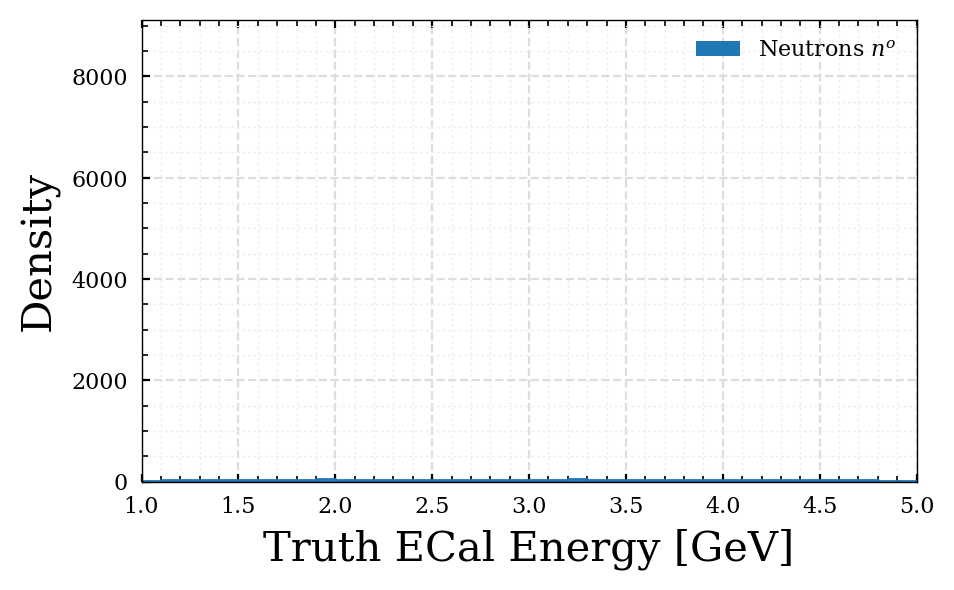

In [8]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
plotting.hist(fig, ax, neutrons.get('PFTruthHcal_energy')/1e3, labels_dict['neutron'], binwidth=0.1,
              xlim=[1, 5],
              draw_median=True, draw_quartiles=True,
              xlabel='Truth ECal Energy [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.legend()
plt.show()

## Correct for mass

In [9]:
# define the particle mass [MeV]
electron_mass = 0.511
neutron_mass = 939.56
photon_mass = 0
pion_mass = 139.57
proton_mass = 938.27

# do not include measured energies
hcal_cols = 'PFTruthHcal_energy'.split(' ')
full_cols = 'PFTruthEcal_energy PFTruthHcal_energy PFCandidates_truthEnergy PFTruthTarget_energy'.split(' ')

# subtract the mass
electrons_hcal.acc_mass(electron_mass, columns=hcal_cols)
electrons.acc_mass(electron_mass, columns=full_cols)
neutrons_hcal.acc_mass(neutron_mass, columns=hcal_cols)
neutrons.acc_mass(neutron_mass, columns=full_cols)
photons_hcal.acc_mass(photon_mass, columns=hcal_cols)
photons.acc_mass(photon_mass, columns=full_cols)
pions_hcal.acc_mass(pion_mass, columns=hcal_cols)
pions.acc_mass(pion_mass, columns=full_cols)
protons_hcal.acc_mass(proton_mass, columns=hcal_cols)
protons.acc_mass(proton_mass, columns=full_cols)

In [10]:
# column names
_ = neutrons.list_props()

Property Name                 Number of Entries   Unique Entries      Range                         Mean
PFCandidates_ecalClusterDXDZ  9881                7312                -0.52         0.57            0.00
PFCandidates_ecalClusterDYDZ  9881                7314                -0.54         0.50            0.00
PFCandidates_ecalClusterEDXDZ 9881                7313                0.00          0.19            0.00
PFCandidates_ecalClusterEDYDZ 9881                7315                0.00          0.15            0.00
PFCandidates_ecalClusterEX    9881                7514                0.00        161.13            27.74
PFCandidates_ecalClusterEY    9881                7433                0.00        161.46            27.69
PFCandidates_ecalClusterEZ    9881                7006                0.00        218.70            45.73
PFCandidates_ecalClusterX     9881                7583                -253.37     257.58            1.29
PFCandidates_ecalClusterY     9881                71

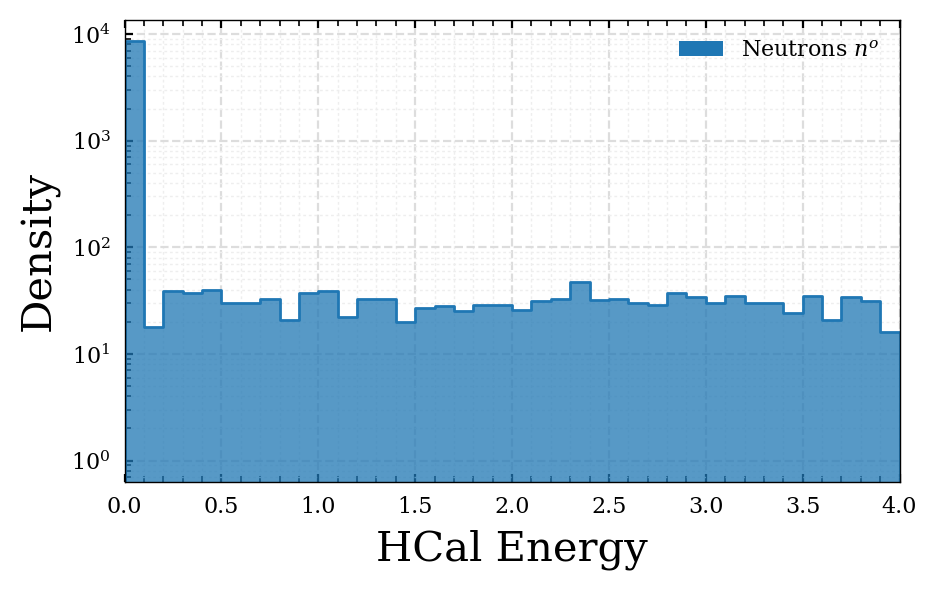

In [11]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
plotting.hist(fig, ax, neutrons.get('PFTruthHcal_energy')/1e3, labels_dict['neutron'], binwidth=0.1,
              xlim=[0, 4],
              draw_median=True, draw_quartiles=True,
              xlabel='HCal Energy', ylabel='Density')
ax.set_yscale('log')
ax.legend()
plt.show()

## Summary

In [12]:
# display_df = {
#     'Names' : ['PFCandidates_ecalEnergy', 'PFCandidates_hcalEnergy', 'PFCandidates_energy', 'PFTruthEcal_energy', 'PFTruthHcal_energy', 'PFTruthTarget_energy'],
#     'Data' : ['Measured ECal energy', 'Measured HCal energy', 'Measured sum energy', 'Truth ECal energy', 'Truth HCal energy', 'Truth Target energy']
# }

# display_df = pd.DataFrame(display_df)
# display(display_df)

In [13]:
# verify that total energy is hcal + ecal
print(electrons.get('PFCandidates_energy') - electrons.get('PFCandidates_hcalEnergy'))
print(electrons.get('PFCandidates_ecalEnergy'))

[2578.7964 2804.276  1355.7954 ... 2898.0115 1224.5817 3891.8264]
[2578.7964 2804.276  1355.7954 ... 2898.0115 1224.5817 3891.8264]


## Plotting Spatial Distributions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Axes limits [-150, 150] and [-150, 150]


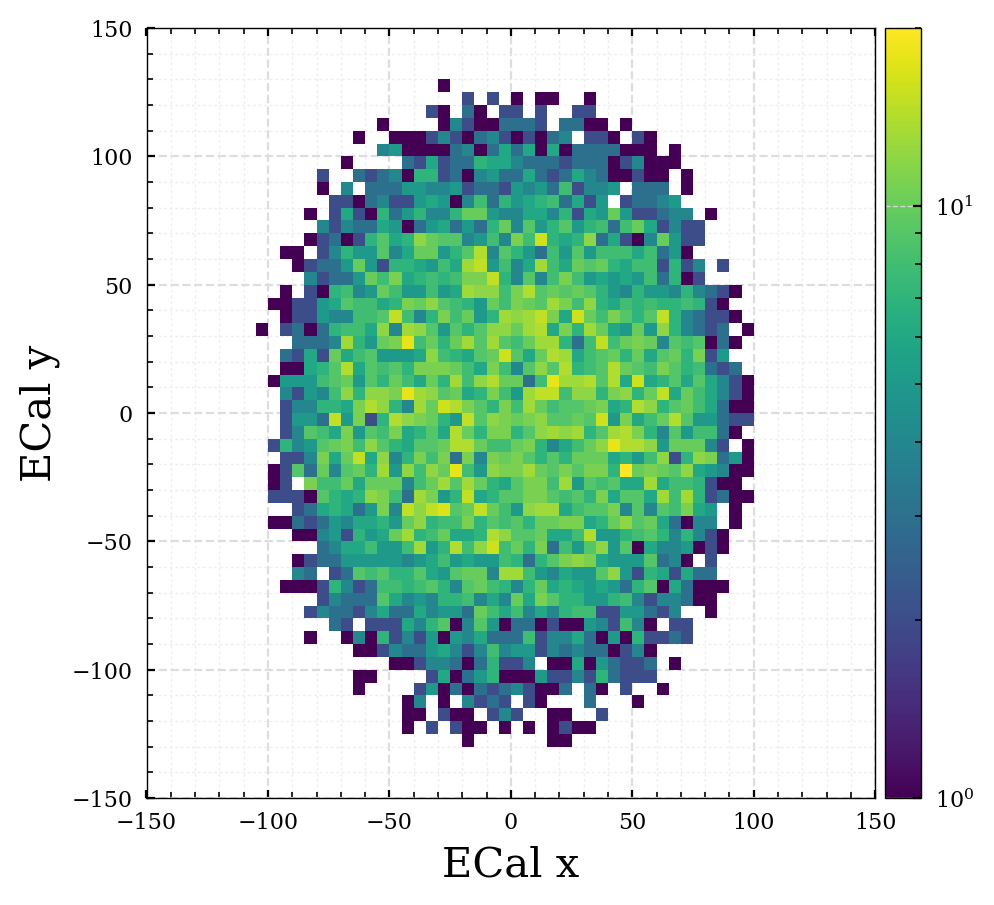

In [14]:
from codes import jason_plotting as plotting

fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
plotting.hist2d(fig, ax,
                photons.get('PFCandidates_posEcalX'),
                photons.get('PFCandidates_posEcalY'),
                xlim=[-150, 150],
                ylim=[-150, 150],
                xlabel='ECal x',
                ylabel='ECal y',
                binsize=5)
plt.show()

## Comparing Different Particles

### Electrons

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Axes limits [250, 450] and [-150, 150]
Axes limits [250, 1200] and [-1000, 1000]


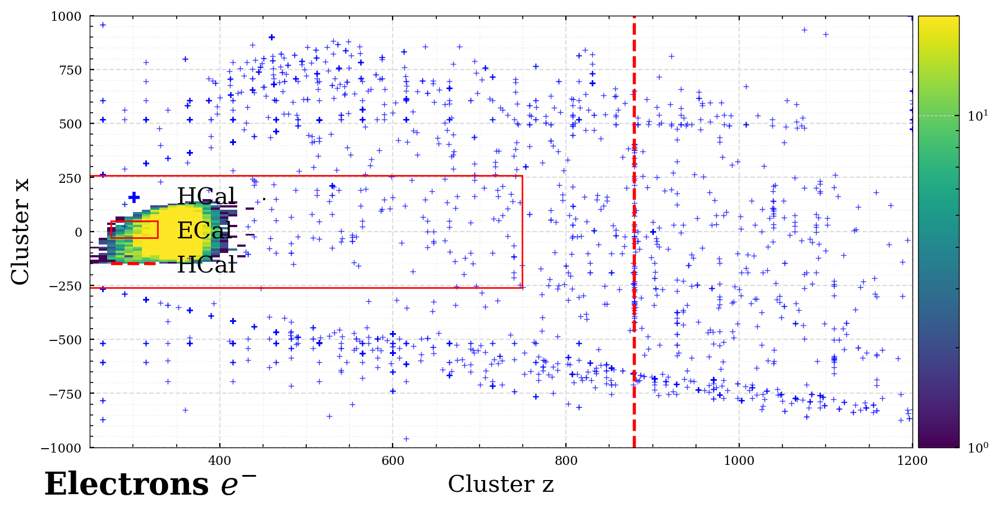

In [15]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=200)
plotting.hist2d(fig, ax,
                electrons.get('PFCandidates_ecalClusterZ'),
                electrons.get('PFCandidates_ecalClusterX'),
                xlim=[250, 450],
                ylim=[-150, 150],
                xlabel='ECal cluster z',
                ylabel='ECal cluster x',
                binsize=10)
# plotting.hist2d(fig, ax,
#                 electrons.get('PFCandidates_hcalClusterZ'),
#                 electrons.get('PFCandidates_hcalClusterX'),
#                 xlim=[250, 1200],
#                 ylim=[-1000, 1000],
#                 xlabel='Cluster z',
#                 ylabel='Cluster x',
#                 cbar_prop=None,
#                 binsize=10)
plotting.scatter(fig, ax,
                 electrons.get('PFCandidates_hcalClusterZ'), electrons.get('PFCandidates_hcalClusterX'),
                 s = 15, lw = 0.5, c = 'blue', a = 0.8,
                 xlim=[250, 1200], ylim=[-1000, 1000],
                 label='HCal',
                 draw_line=False,
                 xlabel='Cluster z', ylabel='Cluster x')
plot_ecal_box(ax)
plot_hcal_box(ax)
ax.annotate(text=labels_dict['electron'], xy=(-30, -30), xycoords='axes points', fontsize=20, weight='bold')
plt.legend(fontsize=15)
plt.show()

### Neutrons

Axes limits [250, 1200] and [-1000, 1000]
Axes limits [250, 1200] and [-1000, 1000]


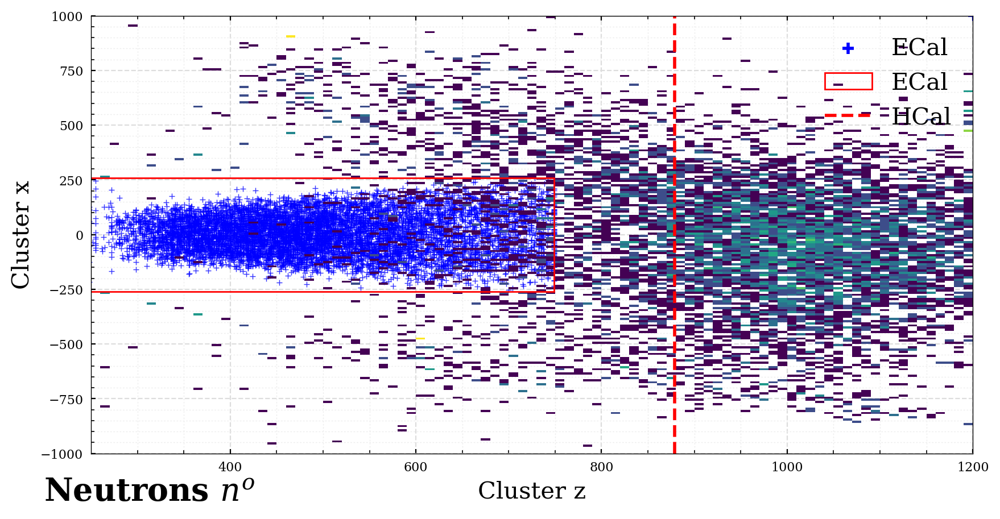

In [16]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=200)
# plotting.hist2d(fig, ax,
#                 neutrons.get('PFCandidates_ecalClusterZ'),
#                 neutrons.get('PFCandidates_ecalClusterX'),
#                 xlim=[250, 1000],
#                 ylim=[-150, 150],
#                 xlabel='ECal cluster z',
#                 ylabel='ECal cluster x',
#                 binsize=10)
plotting.scatter(fig, ax,
                 neutrons.get('PFCandidates_ecalClusterZ'), neutrons.get('PFCandidates_ecalClusterX'),
                 s = 15, lw = 0.5, c = 'blue', a = 0.8,
                 xlim=[250, 1200], ylim=[-1000, 1000],
                 label='ECal',
                 draw_line=False,
                 xlabel='Cluster z', ylabel='Cluster x')
plotting.hist2d(fig, ax,
                neutrons.get('PFCandidates_hcalClusterZ'),
                neutrons.get('PFCandidates_hcalClusterX'),
                xlim=[250, 1200],
                ylim=[-1000, 1000],
                xlabel='Cluster z',
                ylabel='Cluster x',
                cbar_prop=None,
                binsize=10)
plot_ecal_box(ax)
plot_hcal_box(ax)
plt.legend(fontsize=15)
ax.annotate(text=labels_dict['neutron'], xy=(-30, -30), xycoords='axes points', fontsize=20, weight='bold')
plt.show()

### Photons

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Axes limits [250, 600] and [-150, 150]
Axes limits [250, 1200] and [-1000, 1000]


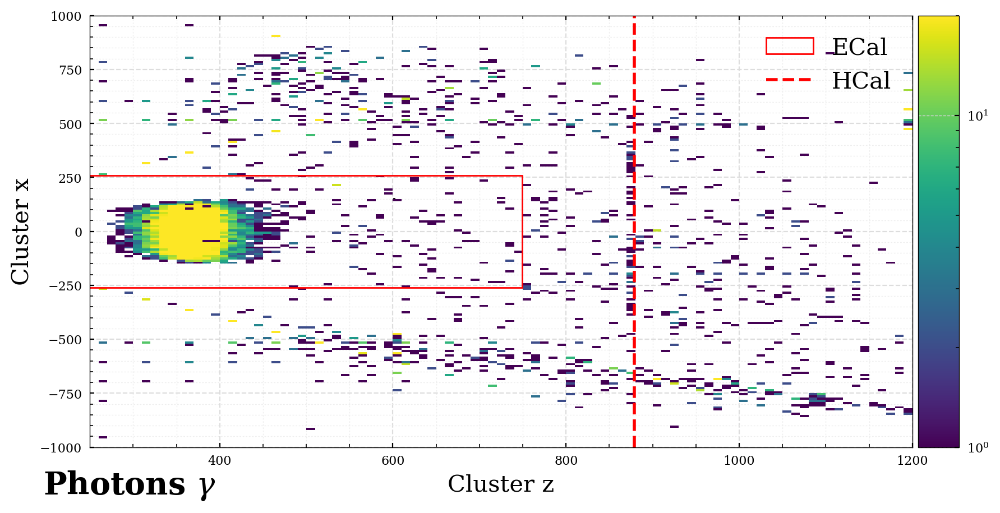

In [17]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=200)
plotting.hist2d(fig, ax,
                photons.get('PFCandidates_ecalClusterZ'),
                photons.get('PFCandidates_ecalClusterX'),
                xlim=[250, 600],
                ylim=[-150, 150],
                xlabel='ECal cluster z',
                ylabel='ECal cluster x',
                binsize=10)
plotting.hist2d(fig, ax,
                photons.get('PFCandidates_hcalClusterZ'),
                photons.get('PFCandidates_hcalClusterX'),
                xlim=[250, 1200],
                ylim=[-1000, 1000],
                xlabel='Cluster z',
                ylabel='Cluster x',
                cbar_prop=None,
                binsize=10)
plot_ecal_box(ax)
plot_hcal_box(ax)
plt.legend(fontsize=15)
ax.annotate(text=labels_dict['photon'], xy=(-30, -30), xycoords='axes points', fontsize=20, weight='bold')
plt.show()

### Pions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Axes limits [250, 600] and [-150, 150]
Axes limits [250, 1200] and [-1000, 1000]


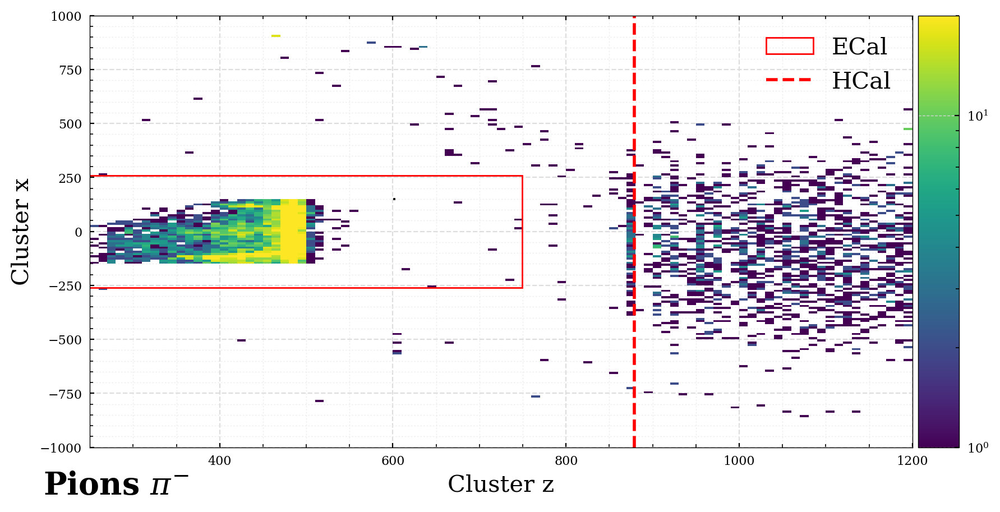

In [18]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=200)
plotting.hist2d(fig, ax,
                pions.get('PFCandidates_ecalClusterZ'),
                pions.get('PFCandidates_ecalClusterX'),
                xlim=[250, 600],
                ylim=[-150, 150],
                xlabel='ECal cluster z',
                ylabel='ECal cluster x',
                binsize=10)
# plotting.scatter(fig, ax,
#                  pions.get('PFCandidates_ecalClusterZ'), pions.get('PFCandidates_ecalClusterX'),
#                  s = 15, lw = 0.5, c = 'blue', a = 0.8,
#                  xlim=[250, 500], ylim=[-1000, 1000],
#                  label='HCal',
#                  draw_line=False,
#                  xlabel='Cluster z', ylabel='Cluster x')
plotting.hist2d(fig, ax,
                pions.get('PFCandidates_hcalClusterZ'),
                pions.get('PFCandidates_hcalClusterX'),
                xlim=[250, 1200],
                ylim=[-1000, 1000],
                xlabel='Cluster z',
                ylabel='Cluster x',
                cbar_prop=None,
                binsize=10)
plot_ecal_box(ax)
plot_hcal_box(ax)
plt.legend(fontsize=15)
ax.annotate(text=labels_dict['pion'], xy=(-30, -30), xycoords='axes points', fontsize=20, weight='bold')
plt.show()

### Protons

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Axes limits [250, 600] and [-150, 150]
Axes limits [250, 1200] and [-1000, 1000]


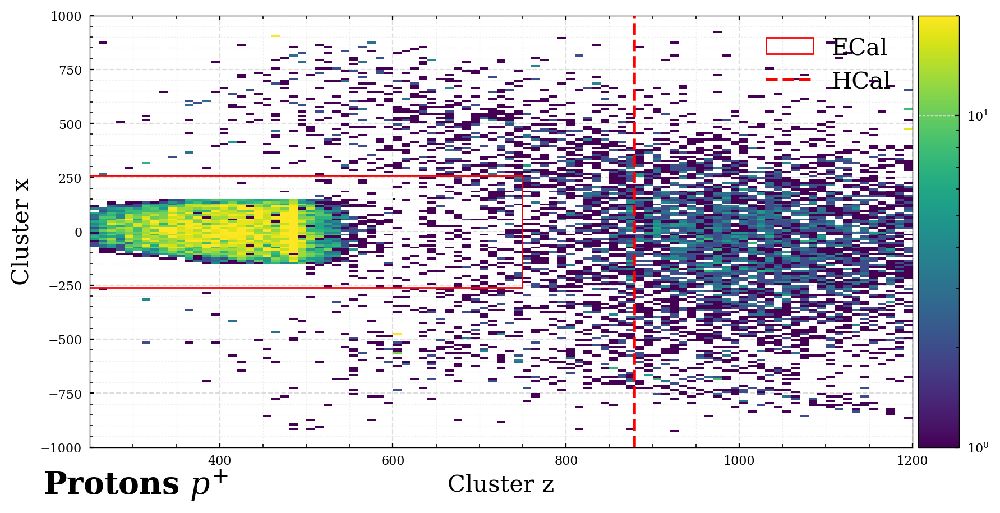

In [19]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=200)
plotting.hist2d(fig, ax,
                protons.get('PFCandidates_ecalClusterZ'),
                protons.get('PFCandidates_ecalClusterX'),
                xlim=[250, 600],
                ylim=[-150, 150],
                xlabel='ECal cluster z',
                ylabel='ECal cluster x',
                binsize=10)
plotting.hist2d(fig, ax,
                protons.get('PFCandidates_hcalClusterZ'),
                protons.get('PFCandidates_hcalClusterX'),
                xlim=[250, 1200],
                ylim=[-1000, 1000],
                xlabel='Cluster z',
                ylabel='Cluster x',
                cbar_prop=None,
                binsize=10)
plot_ecal_box(ax)
plot_hcal_box(ax)
plt.legend(fontsize=15)
ax.annotate(text=labels_dict['proton'], xy=(-30, -30), xycoords='axes points', fontsize=20, weight='bold')
plt.show()

# First-Order Energy Corrections

Axes limits [13.633378028869629, 3999.133056640625] and [0.09868235141038895, 5876.83544921875]


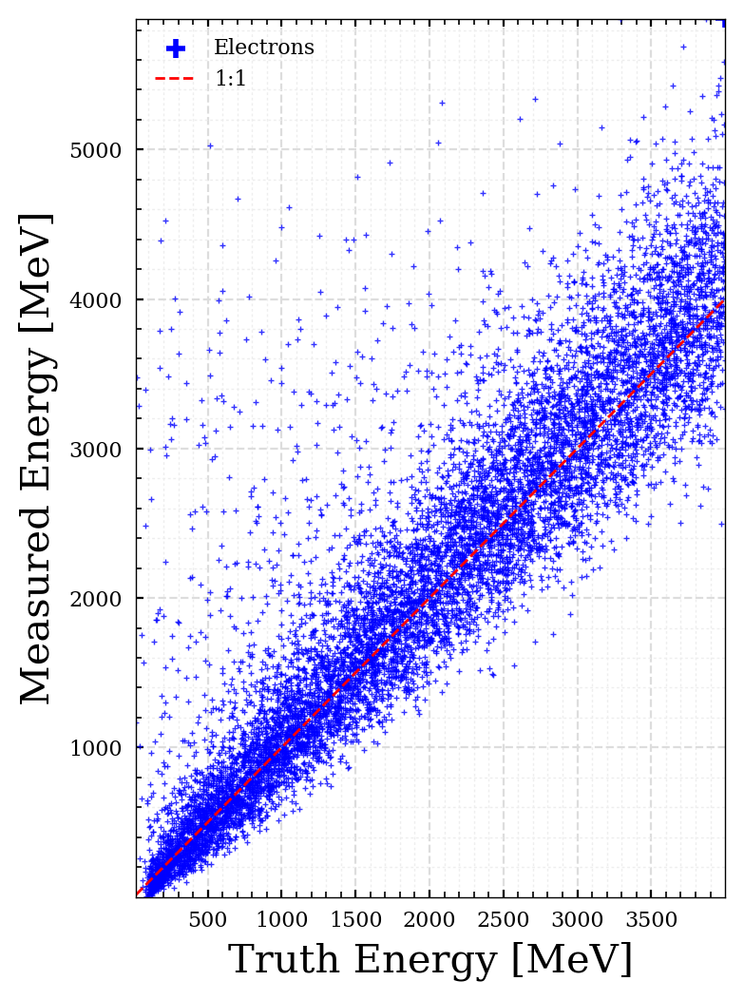

In [20]:
fig, ax = plt.subplots(figsize=(4, 6), dpi=200)
plotting.scatter(fig, ax,
                 electrons.get('PFTruthTarget_energy'), electrons.get('PFCandidates_energy'),
                 xlim=None, ylim=None,
                 label='Electrons',
                 draw_line=True, line_prop = [None, None, 1, '--', 'red', '1:1'],
                 xlabel = 'Truth Energy [MeV]', ylabel = 'Measured Energy [MeV]')

Axes limits [0, 4000.0] and [4.995575428009033, 5753.07568359375]


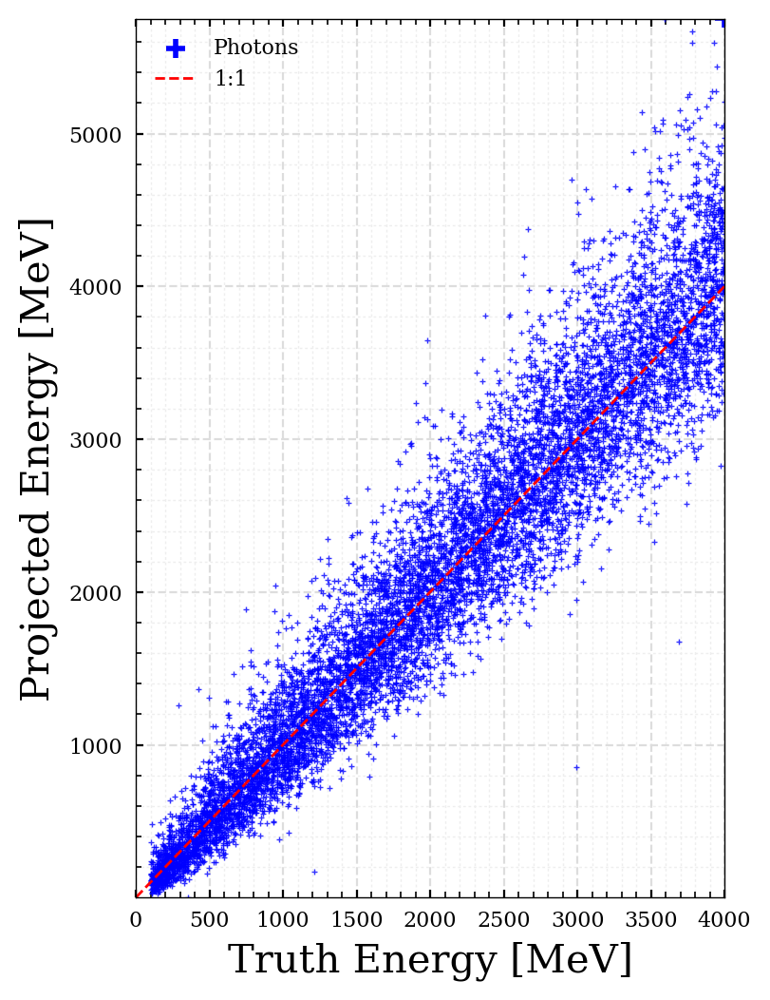

In [21]:
fig, ax = plt.subplots(figsize=(4, 6), dpi=200)
plotting.scatter(fig, ax,
                 photons.get('PFTruthTarget_energy'), photons.get('PFCandidates_energy'),
                 xlim=[0, 4e3], ylim=None,
                 label='Photons',
                 draw_line=True, line_prop = [None, None, 1, '--', 'red', '1:1'],
                 xlabel = 'Truth Energy [MeV]', ylabel = 'Projected Energy [MeV]')

Axes limits [13.633378028869629, 3999.133056640625] and (0, 2)


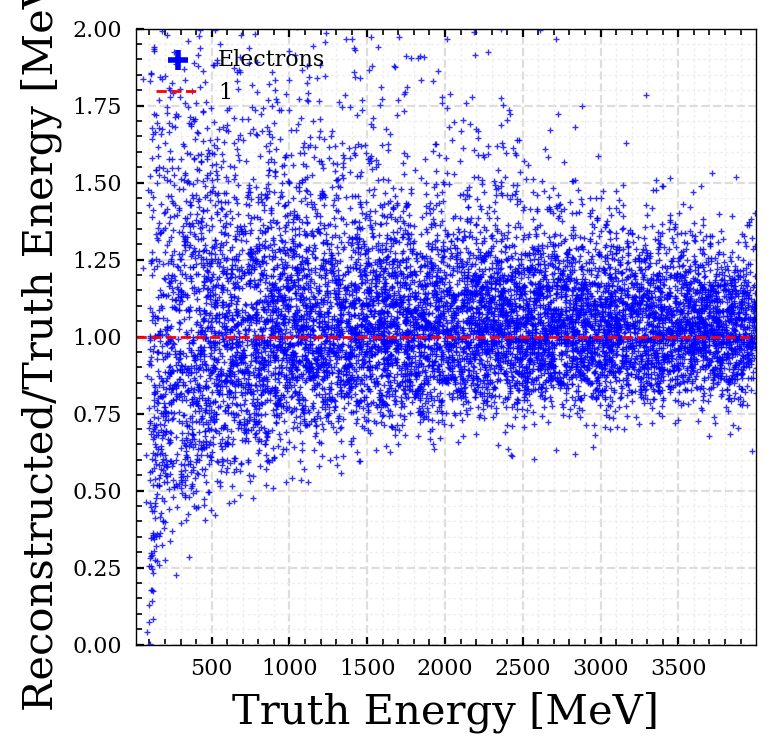

In [22]:
fig, ax = plt.subplots(figsize=(4, 4), dpi=200)
plotting.scatter(fig, ax,
                 electrons.get('PFTruthTarget_energy'), electrons.get('PFCandidates_energy')/(electrons.get('PFTruthTarget_energy')+0.0001),
                 xlim=None, ylim=(0, 2),
                 label='Electrons',
                 draw_line=True, line_prop = [None, np.ones_like, 1, '--', 'red', '1'],
                 xlabel = 'Truth Energy [MeV]', ylabel = 'Reconstructed/Truth Energy [MeV]')

## Proportions of energy deposition

In [23]:
np.mean(electrons.get('PFCandidates_ecalEnergy')), np.mean(electrons.get('PFCandidates_hcalEnergy'))

(2131.817, 0.46210766)

In [24]:
np.mean(photons.get('PFCandidates_ecalEnergy')), np.mean(photons.get('PFCandidates_hcalEnergy'))

(2088.6367, 0.47377953)

In [25]:
np.mean(neutrons.get('PFCandidates_ecalEnergy')), np.mean(neutrons.get('PFCandidates_hcalEnergy'))

(1110.0796, 74.771706)

In [26]:
np.mean(pions.get('PFCandidates_ecalEnergy')), np.mean(pions.get('PFCandidates_hcalEnergy'))

(621.1609, 200.84013)

In [27]:
np.mean(protons.get('PFCandidates_ecalEnergy')), np.mean(protons.get('PFCandidates_hcalEnergy'))

(1363.4342, 61.40925)

## Apply ECal cut

Cut out particles that don't hit ECal

In [28]:
out_mask = np.logical_or(np.logical_or(electrons.get('PFCandidates_posEcalX') > 260,
                                       electrons.get('PFCandidates_posEcalX') < -260),
                         np.logical_or(electrons.get('PFCandidates_posEcalY') > 260,
                                       electrons.get('PFCandidates_posEcalY') < -260))
print(np.sum(out_mask))

out_mask = np.logical_or(np.logical_or(electrons.get('PFCandidates_truthEcalX') > 260,
                                       electrons.get('PFCandidates_truthEcalX') < -260),
                         np.logical_or(electrons.get('PFCandidates_truthEcalY') > 260,
                                       electrons.get('PFCandidates_truthEcalY') < -260))
print(np.sum(out_mask))

9
9


In [29]:
out_mask = np.logical_or(np.logical_or(photons.get('PFCandidates_posEcalX') > 260,
                                       photons.get('PFCandidates_posEcalX') < -260),
                         np.logical_or(photons.get('PFCandidates_posEcalY') > 260,
                                       photons.get('PFCandidates_posEcalY') < -260))
print(np.sum(out_mask))

out_mask = np.logical_or(np.logical_or(photons.get('PFCandidates_truthEcalX') > 260,
                                       photons.get('PFCandidates_truthEcalX') < -260),
                         np.logical_or(photons.get('PFCandidates_truthEcalY') > 260,
                                       photons.get('PFCandidates_truthEcalY') < -260))
print(np.sum(out_mask))

0
0


## Apply the bin coefficient

The cuts will be based on the proportions between `PFCandidates_truthEnergy` and `PFCandidates_energy` (which is the sum of detector `PFCandidates_ecalEnergy` + `PFCandidates_hcalEnergy`). This constant is then applied based on each bin of `PFCandidates_ecalEnergy` to produce `PFCandidates_energy_O1corr`

In [30]:
def o1corr_ecal(particles, bin_size = 500, label = labels_dict['photon']):
    """
    Do the correction
    """
    # original plot
    fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
    energy_bins, energy_bins_avg, o1corr_bins, (XY_32, XY_68), (XY_05, XY_95) = plotting.percentile(
        particles.get('PFCandidates_energy'),
        particles.get('PFTruthTarget_energy')/\
                      (particles.get('PFCandidates_energy')),
        binwidth=bin_size, style=style, floor=True, label='Correction Coeff', textpos=[3500, 1.5])
    plt.xlabel('Measured Energy [MeV]')
    plt.ylabel('Truth / Measured Energy Bin-Wise Correction', fontsize=10)
    plt.ylim(0, 2)
    plt.legend(loc='upper right')
    plt.annotate(text=label, xy=(-50, -30), xycoords='axes points', fontsize=10, weight='bold')
    
    # print out the energy corrections
    print(f'Average energy correction is {np.mean(o1corr_bins)}')
    
    # clip the correction to < 1 for reco energy > 4 GeV (truth energy always smaller than measured)
    o1corr_bins = np.where(energy_bins[1:] > 4e3,  # 4000 MeV
                           np.clip(o1corr_bins,
                                   a_min=0., a_max=1.),  # clip to max of 1
                           o1corr_bins)
    
    # first order corrected energy
    energy_o1corr = pd.cut(particles.get('PFCandidates_ecalEnergy'), bins=energy_bins,
                           include_lowest=True, labels=o1corr_bins).to_numpy()
    particles.propdict['PFCandidates_energy_o1corr'] = particles.get('PFCandidates_ecalEnergy') * energy_o1corr\
                                                     + particles.get('PFCandidates_hcalEnergy')
    
    
    """
    Plot the corrected energies
    """
    
    # O(1) correction plot
    fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
    _ = plotting.percentile(
        particles.get('PFTruthTarget_energy'),
        particles.get('PFCandidates_energy')/\
                      (particles.get('PFTruthTarget_energy') + 1e-4),
        binwidth=bin_size, style=style, floor=True, color='red', label='Measured', textpos=[3500, 1.5])
    _ = plotting.percentile(
        particles.get('PFTruthTarget_energy'),
        particles.get('PFCandidates_energy_o1corr')/\
                      (particles.get('PFTruthTarget_energy') + 1e-4),
        binwidth=bin_size, style=style, floor=True, color='blue', label='$\mathcal{O}(1)$ Reconstructed')
    plt.xlabel('Truth Energy [MeV]')
    plt.ylabel('Reconstructed / Truth Energy', fontsize=10)
    plt.ylim(0, 2)
    plt.legend(loc='upper right')
    plt.annotate(text=label, xy=(-50, -30), xycoords='axes points', fontsize=10, weight='bold')
    
    # O(1) correction plot, naively plotting against measured values
    fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
    _ = plotting.percentile(
        particles.get('PFCandidates_energy'),
        particles.get('PFCandidates_energy')/\
                      (particles.get('PFTruthTarget_energy') + 1e-4),
        binwidth=bin_size, style=style, floor=True, color='red', label='Measured', textpos=[3500, 1.5])
    _ = plotting.percentile(
        particles.get('PFCandidates_energy'),
        particles.get('PFCandidates_energy_o1corr')/\
                      (particles.get('PFTruthTarget_energy') + 1e-4),
        binwidth=bin_size, style=style, floor=True, color='blue', label='$\mathcal{O}(1)$ Reconstructed')
    plt.xlabel('Measured Energy [MeV]')
    plt.ylabel('Reconstructed / Truth Energy', fontsize=10)
    plt.ylim(0, 2)
    plt.legend(loc='upper right')
    plt.annotate(text=label, xy=(-50, -30), xycoords='axes points', fontsize=10, weight='bold')
    
    # return the bin edges (in MeV of measured energy) and correction coefficients
    return energy_bins, o1corr_bins

### Electrons

(9965,) (9965,)
(9965,) (9965,)
(12,) (12,) (12,)
Average energy correction is 0.9138830974698067
(9965,) (9965,)
(9965,) (9965,)
(8,) (8,) (8,)
(9965,) (9965,)
(9965,) (9965,)
(8,) (8,) (8,)
(9965,) (9965,)
(9965,) (9965,)
(12,) (12,) (12,)
(9965,) (9965,)
(9965,) (9965,)
(12,) (12,) (12,)
[2578.7964 2805.2134 1355.7954 ... 2899.7878 1224.5817 3891.8264]
[2474.81122353 2692.13615734 1323.87018088 ... 2782.93083962 1195.74615628
 3602.07071414]


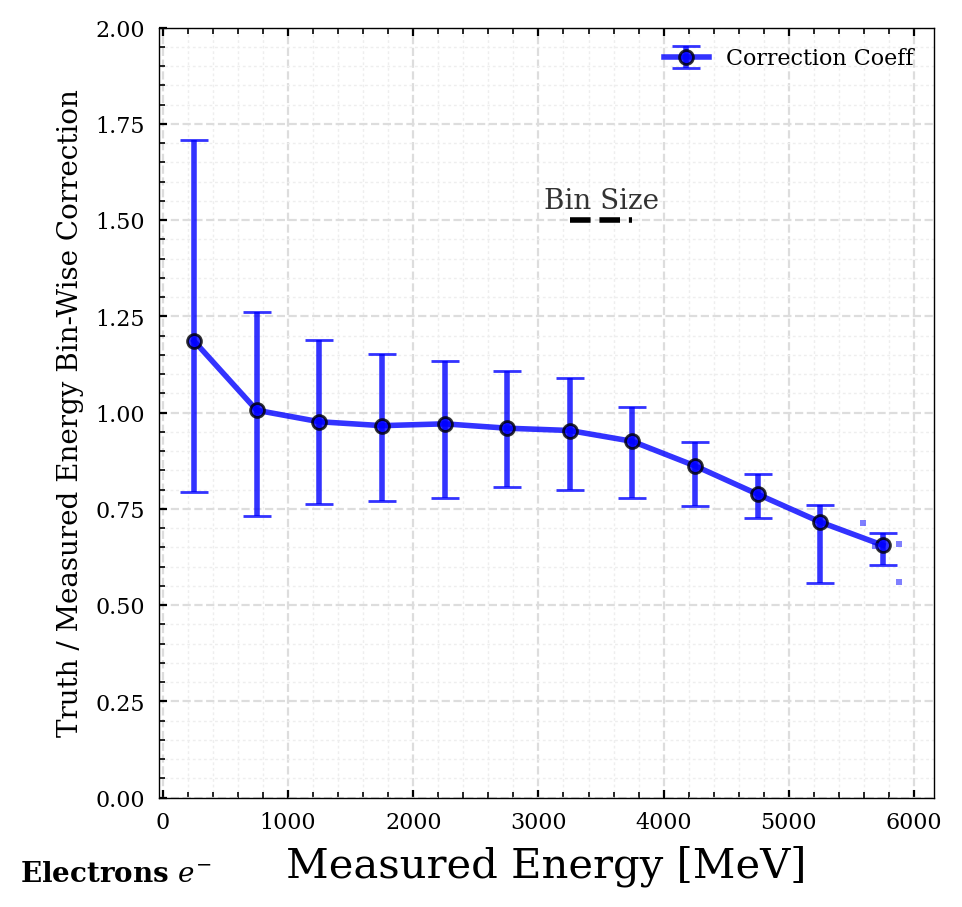

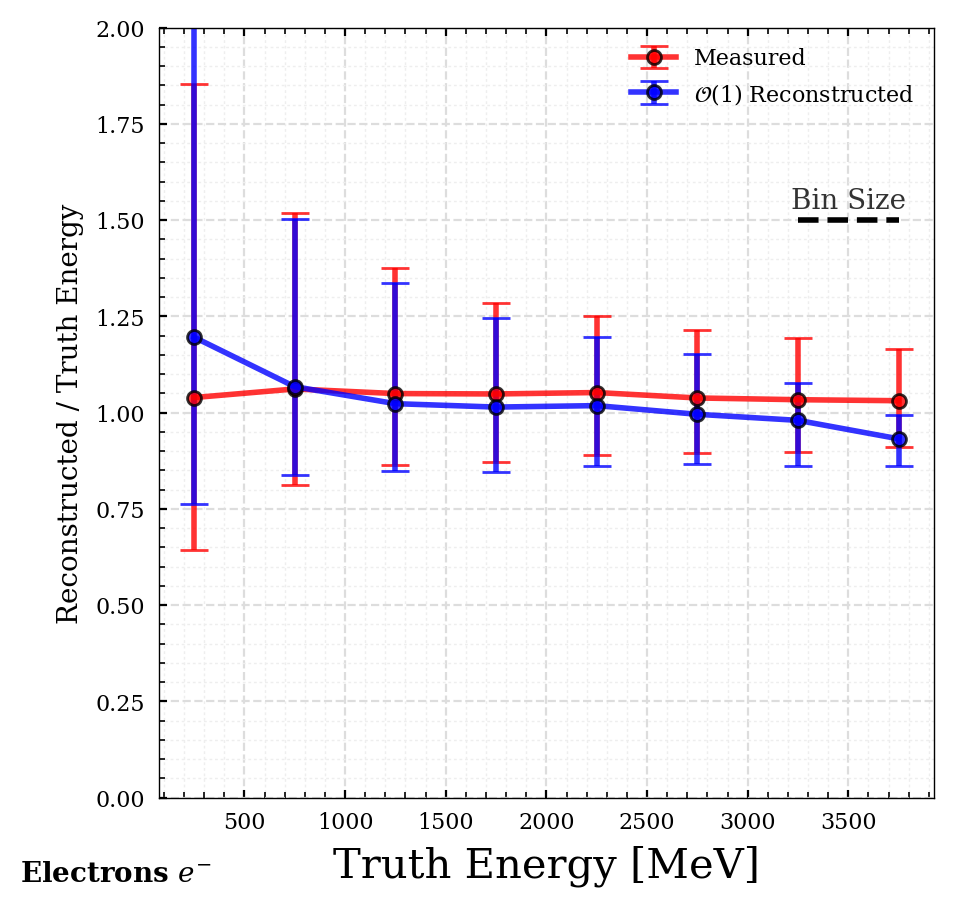

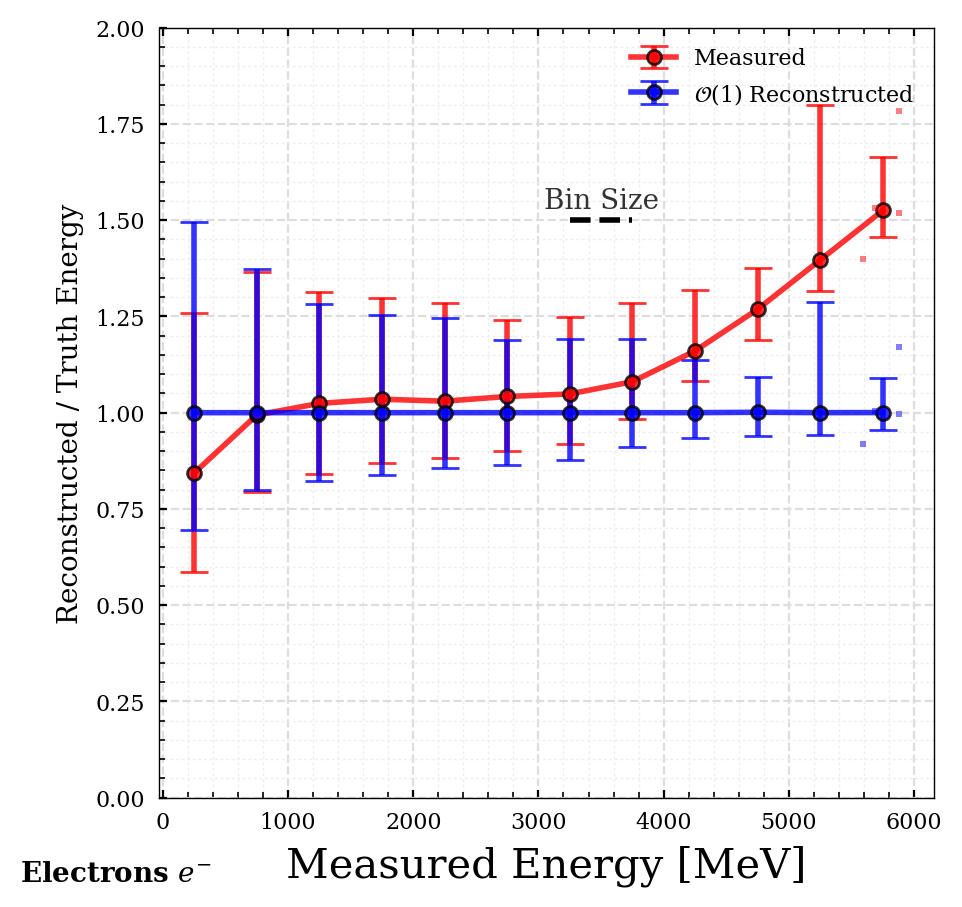

In [31]:
ele_energy_bins_ecal, ele_o1corr_ecal = o1corr_ecal(electrons, bin_size=500, label=labels_dict['electron'])
print(electrons.get('PFCandidates_energy'))
print(electrons.get('PFCandidates_energy_o1corr'))

In [32]:
ele_energy_bins_ecal, len(ele_energy_bins_ecal)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.,
        4500., 5000., 5500., 6000.]),
 13)

The bins are correctly separated and floored, and have one more element (edges) than the coefficients

In [33]:
ele_o1corr_ecal, len(ele_o1corr_ecal)

(array([1.18598557, 1.00625324, 0.97645277, 0.96624851, 0.97098845,
        0.95967686, 0.95366329, 0.92554763, 0.86182195, 0.7882978 ,
        0.71596402, 0.65569708]),
 12)

### Photons

Doing the same, but for photons

(9378,) (9378,)
(9378,) (9378,)
(12,) (12,) (12,)
Average energy correction is 0.9407399495442709
(9378,) (9378,)
(9378,) (9378,)
(8,) (8,) (8,)
(9378,) (9378,)
(9378,) (9378,)
(8,) (8,) (8,)
(9378,) (9378,)
(9378,) (9378,)
(12,) (12,) (12,)
(9378,) (9378,)
(9378,) (9378,)
(12,) (12,) (12,)
[ 832.98474 3545.8572  2227.76    ...  486.8636  1617.8966   671.48834]
[ 876.96295912 3375.95865969 2215.45045637 ...  580.81506691 1628.1716654
  706.94020495]


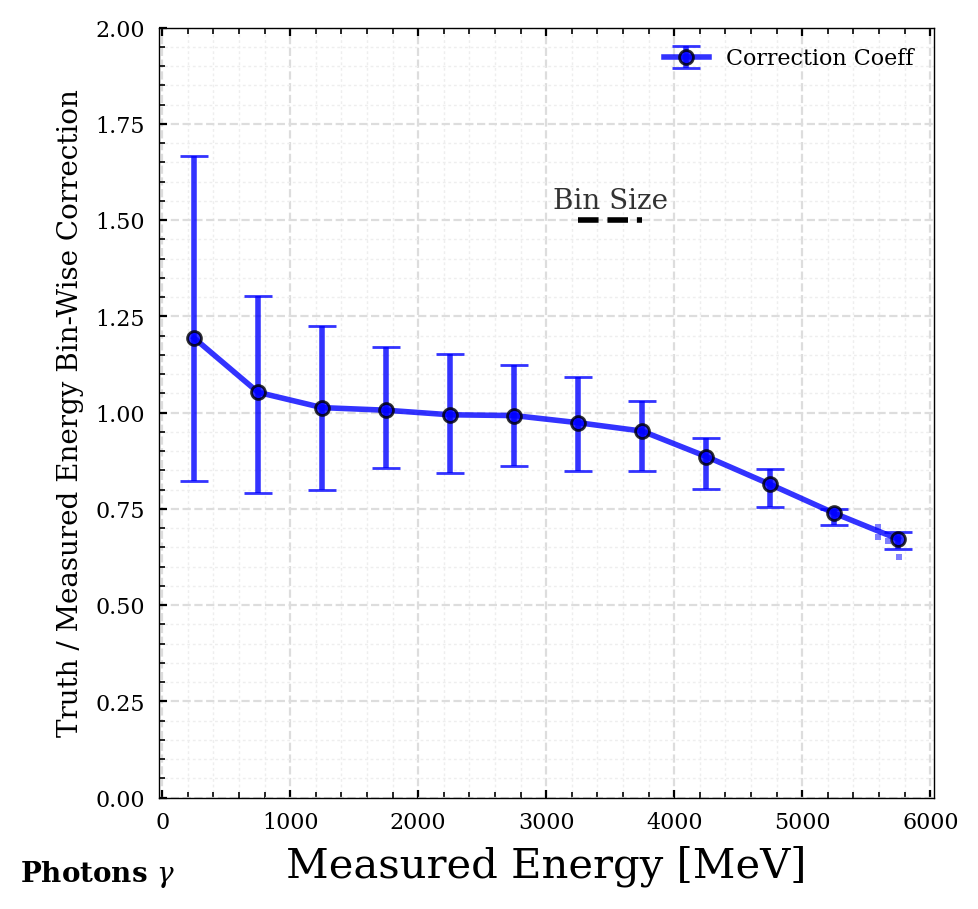

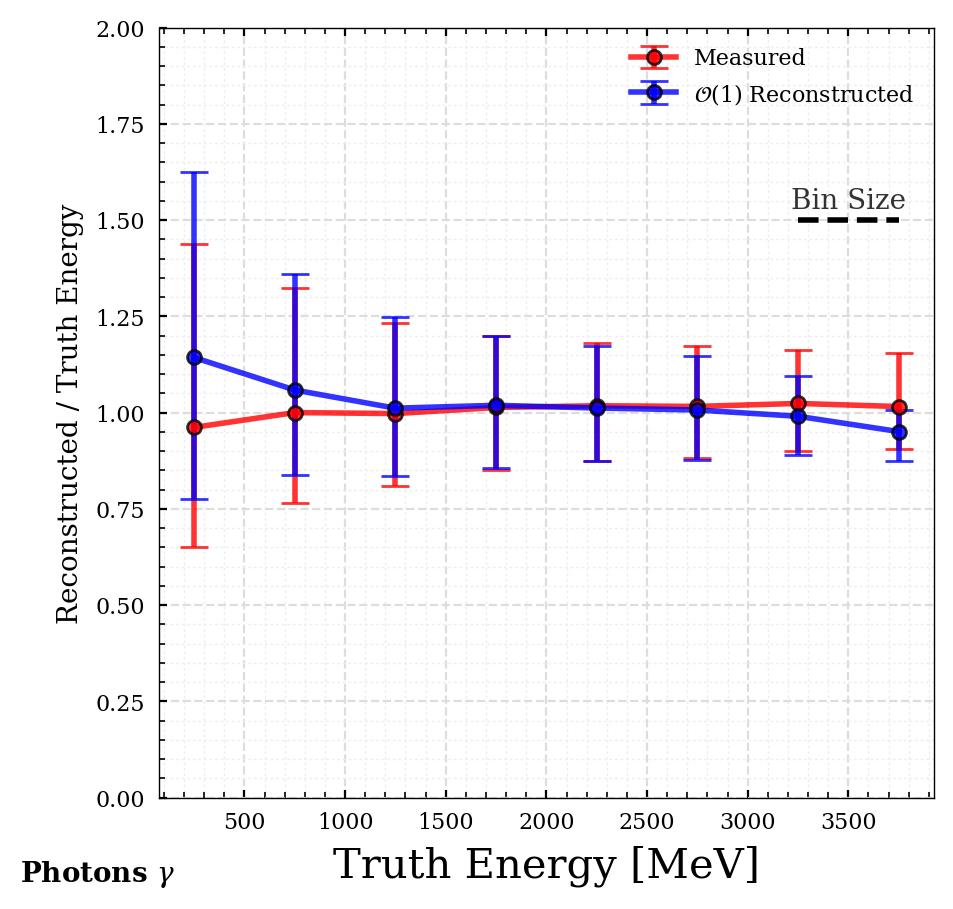

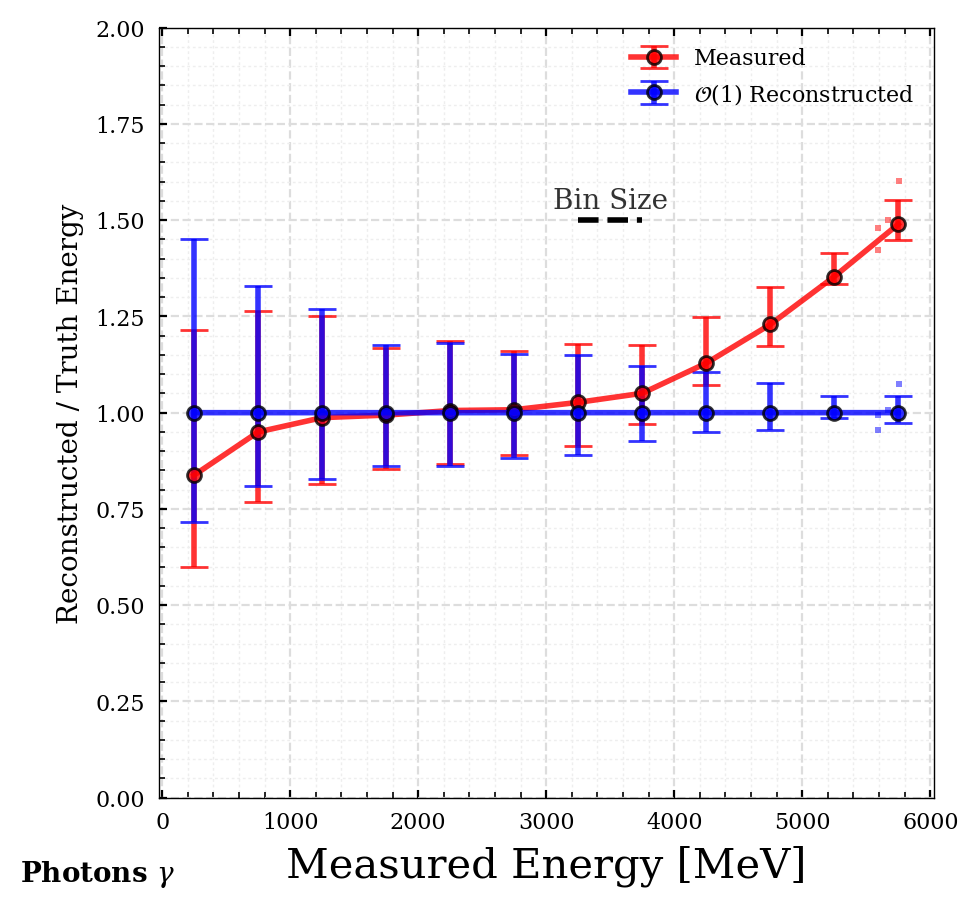

In [34]:
pho_energy_bins_ecal, pho_o1corr_ecal = o1corr_ecal(photons, bin_size=500, label=labels_dict['photon'])
print(photons.get('PFCandidates_energy'))
print(photons.get('PFCandidates_energy_o1corr'))

There are quite a few photons with truth energy of zero, resulting in very large values in the division

In [35]:
np.transpose(np.unique(photons.get('PFCandidates_truthEnergy'), return_counts=True))[0]

array([100.02324677,   1.        ])

In [36]:
pho_energy_bins_ecal, len(pho_energy_bins_ecal)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.,
        4500., 5000., 5500., 6000.]),
 13)

In [37]:
pho_o1corr_ecal, len(pho_o1corr_ecal)

(array([1.19377148, 1.05279595, 1.01311707, 1.00635087, 0.99447447,
        0.99247414, 0.97390121, 0.95206821, 0.88605094, 0.81365258,
        0.73887473, 0.67134774]),
 12)

## HCal Corrections

In [38]:
def o1corr_hcal(particles, bin_size = 500, label = labels_dict['photon'], ecal_params = [[0, 6e3], [1]]):
    """
    ecal_corr : [part_energy_bins, part_o1corr_ecal], length [nbins+1, nbins]
    Do the correction
    """
    # original plot
    fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
    energy_bins, energy_bins_avg, o1corr_bins, (XY_32, XY_68), (XY_05, XY_95) = plotting.percentile(
        particles.get('PFCandidates_hcalEnergy'),
        particles.get('PFTruthHcal_energy')/\
                      (particles.get('PFCandidates_hcalEnergy')),
        binwidth=bin_size, style=style, floor=True, label='Correction Coeff', textpos=[400, 12])
    plt.xlabel('Measured HCal Energy [MeV]')
    plt.ylabel('Truth / Measured HCal Energy Bin-Wise Correction', fontsize=10)
    #plt.ylim(0, 2)
    plt.legend(loc='upper right')
    plt.annotate(text=label, xy=(-50, -30), xycoords='axes points', fontsize=7, weight='bold')
    
    # print out the energy corrections
    print(f'Average energy correction is {np.mean(o1corr_bins)}:')
    
    # clip the correction to < 1 for reco energy > 4 GeV (truth energy always smaller than measured)
    o1corr_bins = np.where(energy_bins[1:] > 4e3,  # 4000 MeV
                           np.clip(o1corr_bins,
                                   a_min=0., a_max=1.),# - 1e-4 * np.random.randn(o1corr_bins.shape),  # clip to max of 1
                           o1corr_bins)
    
    print(energy_bins)
    print(o1corr_bins)
    
    # first order corrected energy
    # use the provided corrections for ECal (everything should be in the smallest bin)
    o1corr_ecal = pd.cut(particles.get('PFCandidates_ecalEnergy'), bins=ecal_params[0],
                           include_lowest=True, labels=ecal_params[1]).to_numpy()
    # the first order ecal energy
    energy_o1corr_ecal = particles.get('PFCandidates_ecalEnergy') * o1corr_ecal
    # calculate corrections for HCal
    o1corr_hcal = pd.cut(particles.get('PFCandidates_hcalEnergy'), bins=energy_bins,
                           include_lowest=True, labels=o1corr_bins).to_numpy()
    # the first order hcal energy
    energy_o1corr_hcal = particles.get('PFCandidates_hcalEnergy') * o1corr_hcal
    particles.propdict['PFCandidates_energy_o1corr']\
        = energy_o1corr_ecal + energy_o1corr_hcal
    
    """
    Plot the corrected energies
    """
    
    # O(1) correction plot
    fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
    _ = plotting.percentile(
        particles.get('PFTruthHcal_energy'),  # only hcal is compared here
        particles.get('PFCandidates_hcalEnergy')/\
                      (particles.get('PFTruthHcal_energy') + 1e-4),
        binwidth=bin_size*10, style=style, floor=True, color='red', label='Measured', textpos=[3500, 1.2])
    _ = plotting.percentile(
        particles.get('PFTruthHcal_energy'),
        energy_o1corr_hcal/\
                      (particles.get('PFTruthHcal_energy') + 1e-4),
        binwidth=bin_size*10, style=style, floor=True, color='blue', label='$\mathcal{O}(1)$ Reconstructed')
    plt.xlabel('Truth HCal Energy [MeV]')
    plt.ylabel('Reconstructed / Truth HCal Energy', fontsize=10)
    #plt.ylim(0, 2)
    plt.legend(loc='upper right')
    plt.annotate(text=label, xy=(-50, -30), xycoords='axes points', fontsize=7, weight='bold')
    
    # O(1) correction plot, with both energies
    fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
    _ = plotting.percentile(
        particles.get('PFCandidates_energy'),
        particles.get('PFCandidates_energy')/\
                      (particles.get('PFTruthHcal_energy') + energy_o1corr_ecal),  # in this case the truth is hcal
        binwidth=bin_size, style=style, floor=True, color='red', label='Measured', textpos=[600, 1.2])
    _ = plotting.percentile(
        particles.get('PFCandidates_energy'),  # for every measured energy, the reconstructed is on point
        particles.get('PFCandidates_energy_o1corr')/\
                      (particles.get('PFTruthHcal_energy') + energy_o1corr_ecal),
        binwidth=bin_size, style=style, floor=True, color='blue', label='$\mathcal{O}(1)$ Reconstructed')
    plt.xlabel('Measured Total Energy [MeV]')
    plt.ylabel('Reconstructed / Truth Total Energy', fontsize=10)
    #plt.ylim(0, 2)
    plt.legend(loc='upper right')
    plt.annotate(text=label, xy=(-50, -30), xycoords='axes points', fontsize=7, weight='bold')
    
    # return the bin edges (in MeV of measured energy) and correction coefficients
    return energy_bins, o1corr_bins

### Electrons

Axes limits [0, 800] and [0, 100]


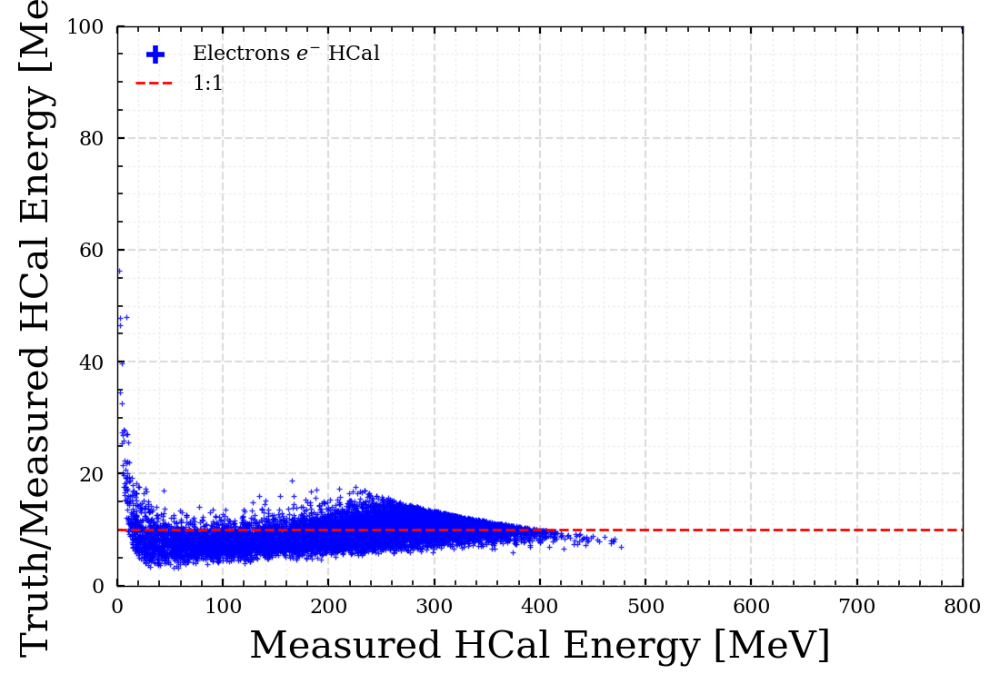

In [39]:
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
plotting.scatter(fig, ax,
                 electrons_hcal.get('PFCandidates_hcalEnergy'),
                 electrons_hcal.get('PFTruthHcal_energy')/electrons_hcal.get('PFCandidates_hcalEnergy'),
                 xlim=[0, 800], ylim=[0, 100],
                 label=labels_dict['electron']+' HCal',
                 draw_line=True, line_prop = [None, lambda x: [10]*len(x), 1, '--', 'red', '1:1'],
                 xlabel = 'Measured HCal Energy [MeV]', ylabel = 'Truth/Measured HCal Energy [MeV]')

(9999,) (9999,)
(9999,) (9999,)
(10,) (10,) (10,)
Average energy correction is 8.956021356582642:
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500.]
[ 8.72792101  7.47605658  7.8331418   8.58382893  9.46359539 10.44721127
 10.46484852  9.68849564  8.86627007  8.00884438]
(10000,) (10000,)
(10000,) (10000,)
(8,) (8,) (8,)
(10000,) (10000,)
(10000,) (10000,)
(8,) (8,) (8,)
(10000,) (10000,)
(9999,) (9999,)
(11,) (11,) (11,)
(10000,) (10000,)
(9999,) (9999,)
(11,) (11,) (11,)


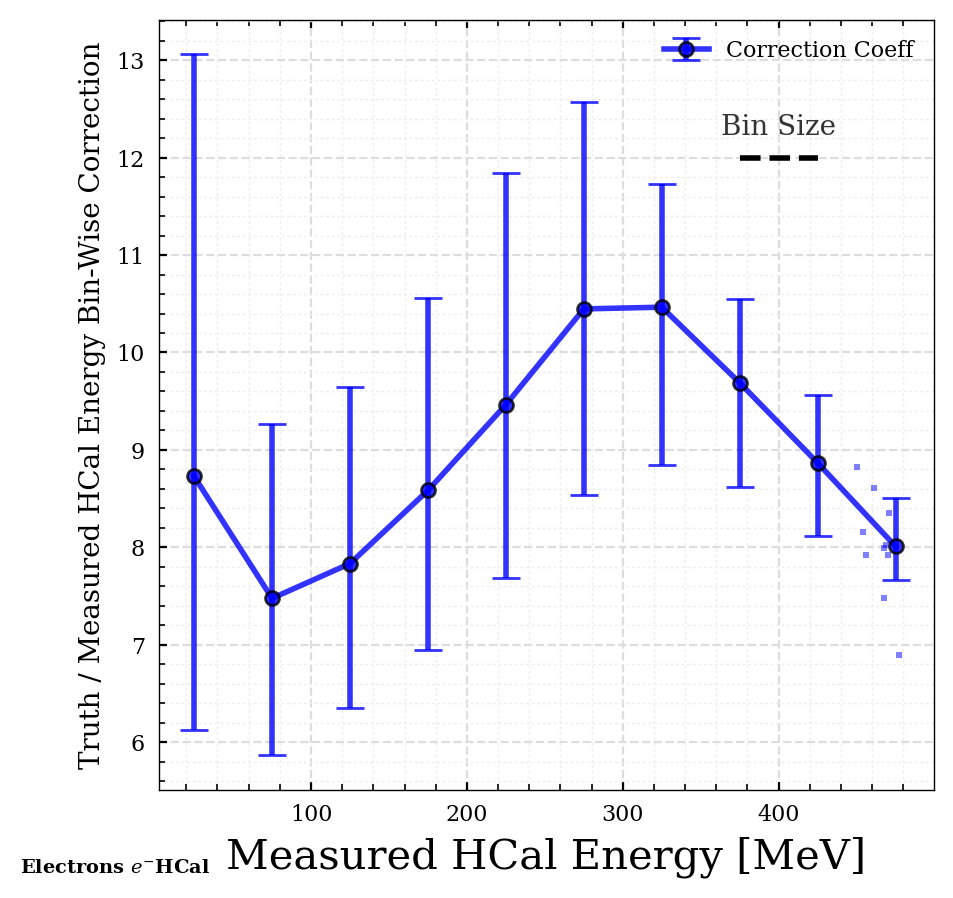

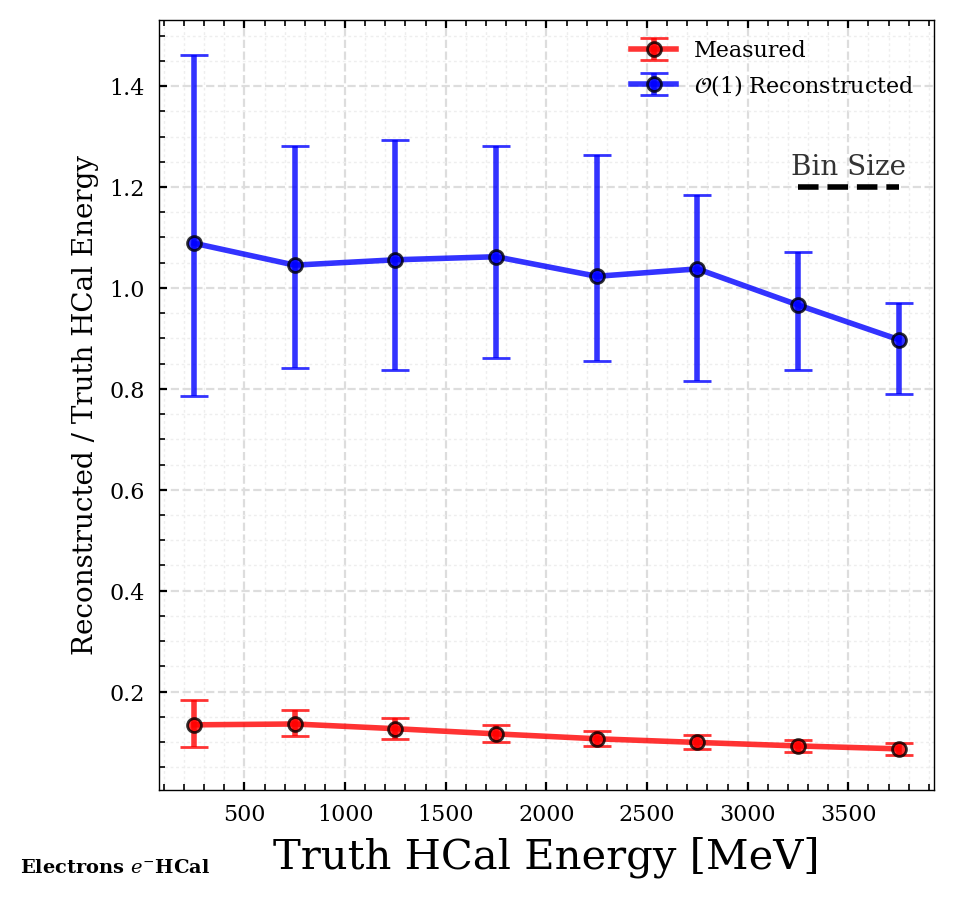

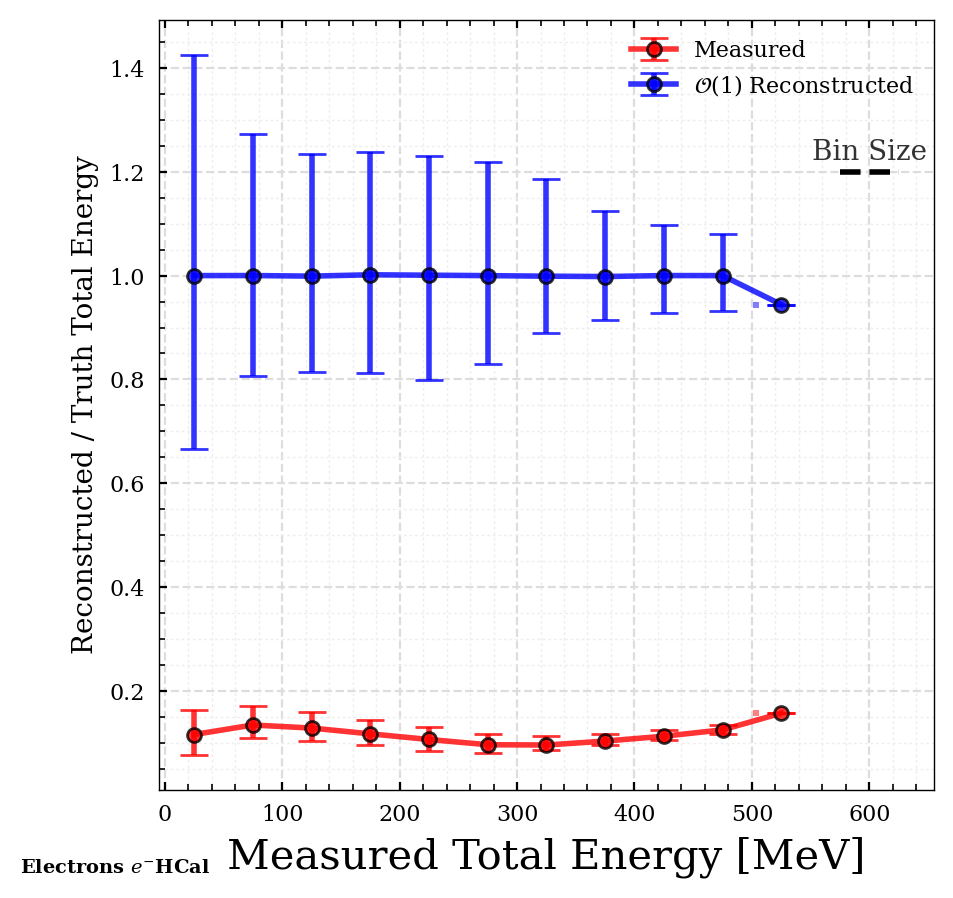

In [40]:
ele_energy_bins_hcal, ele_o1corr_hcal = o1corr_hcal(electrons_hcal, bin_size=50,
                                               label=labels_dict['electron']+'HCal',
                                               ecal_params=[ele_energy_bins_ecal, ele_o1corr_ecal])

In [41]:
ele_energy_bins_hcal, len(ele_energy_bins_hcal)

(array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.]), 11)

In [42]:
ele_o1corr_hcal, len(ele_o1corr_hcal)

(array([ 8.72792101,  7.47605658,  7.8331418 ,  8.58382893,  9.46359539,
        10.44721127, 10.46484852,  9.68849564,  8.86627007,  8.00884438]),
 10)

### Photons

Axes limits [0, 800] and [0, 100]


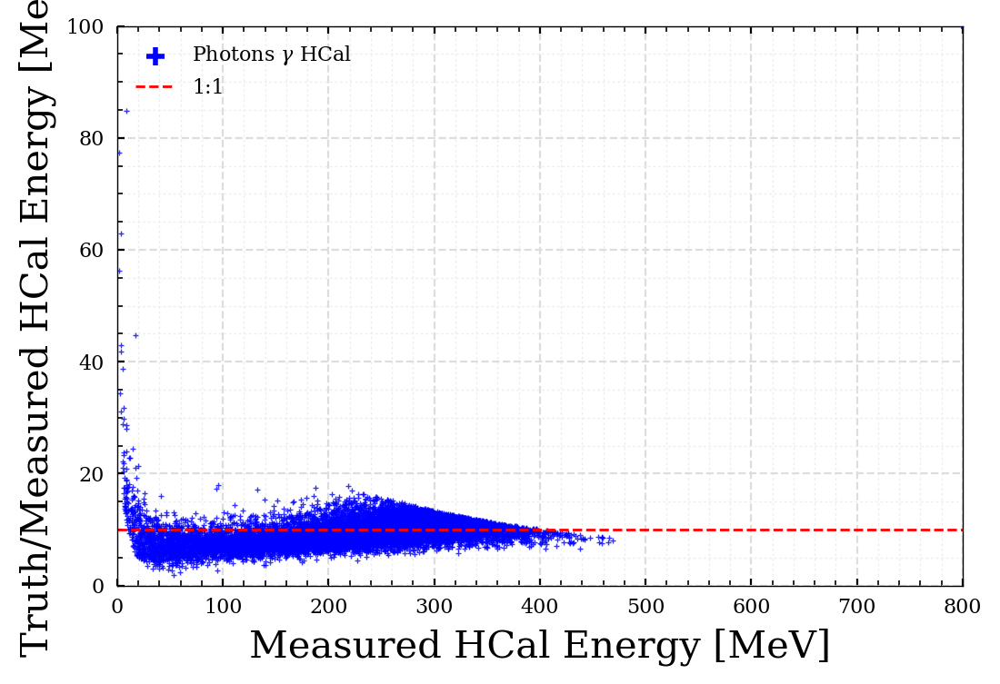

In [43]:
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
plotting.scatter(fig, ax,
                 photons_hcal.get('PFCandidates_hcalEnergy'),
                 photons_hcal.get('PFTruthHcal_energy')/photons_hcal.get('PFCandidates_hcalEnergy'),
                 xlim=[0, 800], ylim=[0, 100],
                 label=labels_dict['photon']+' HCal',
                 draw_line=True, line_prop = [None, lambda x: [10]*len(x), 1, '--', 'red', '1:1'],
                 xlabel = 'Measured HCal Energy [MeV]', ylabel = 'Truth/Measured HCal Energy [MeV]')

(10000,) (10000,)
(10000,) (10000,)
(10,) (10,) (10,)
Average energy correction is 8.905591154098511:
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500.]
[ 8.12814999  7.27960443  7.68240547  8.48420715  9.47431278 10.44567299
 10.46855545  9.72650146  8.87418842  8.49231339]
(10000,) (10000,)
(10000,) (10000,)
(8,) (8,) (8,)
(10000,) (10000,)
(10000,) (10000,)
(8,) (8,) (8,)
(10000,) (10000,)
(9999,) (9999,)
(10,) (10,) (10,)
(10000,) (10000,)
(9999,) (9999,)
(10,) (10,) (10,)
[262.792    408.1503   201.862    ... 187.1832    41.583935 287.45148 ]
[2745.03921449 3622.00265894 1912.50372223 ... 1588.10101915  338.00045894
 3002.62412945]


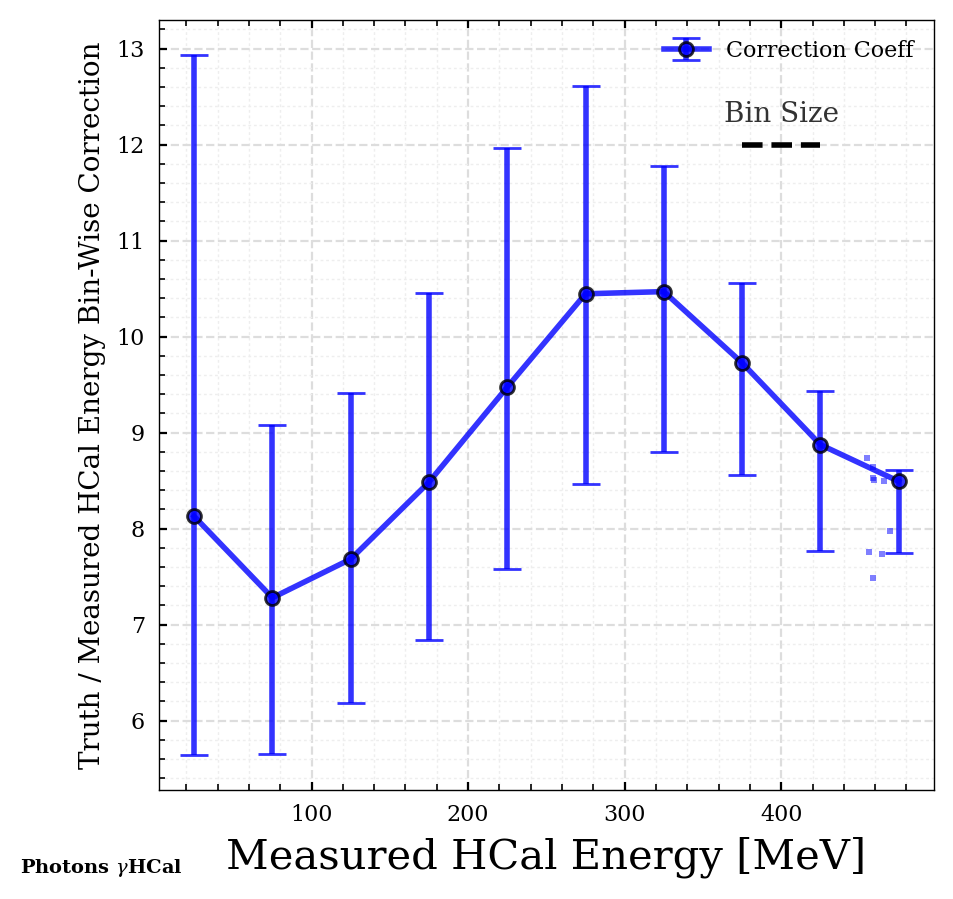

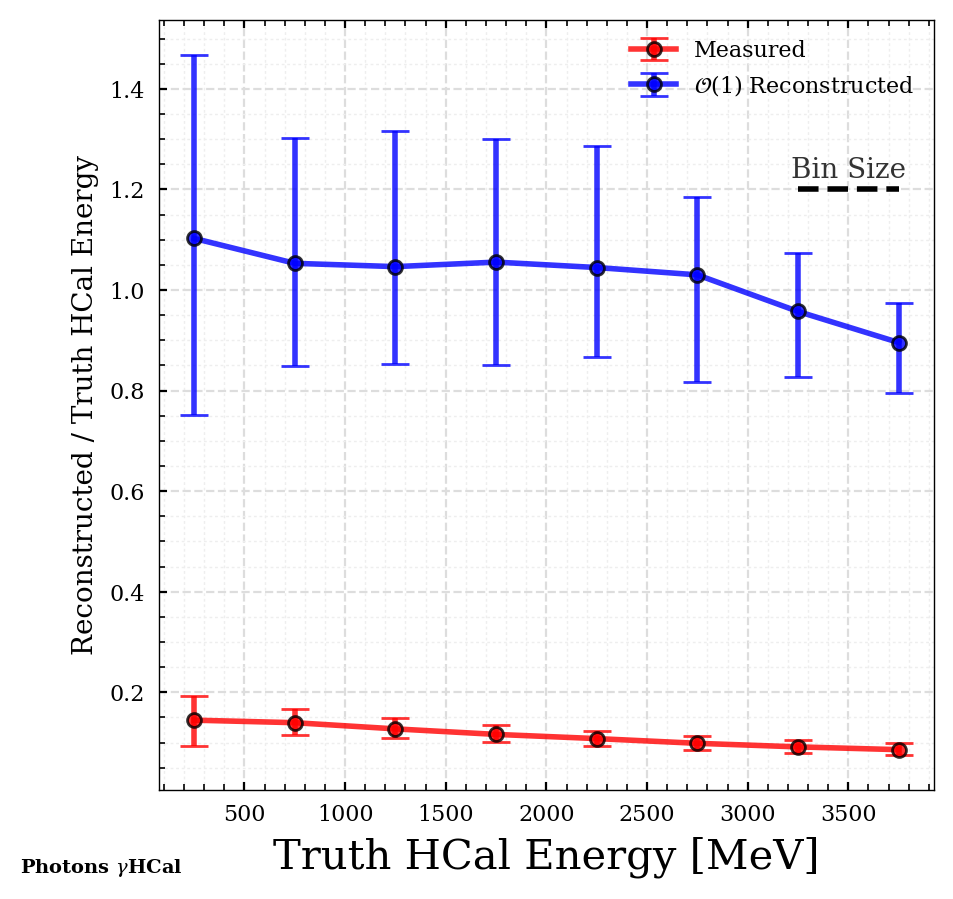

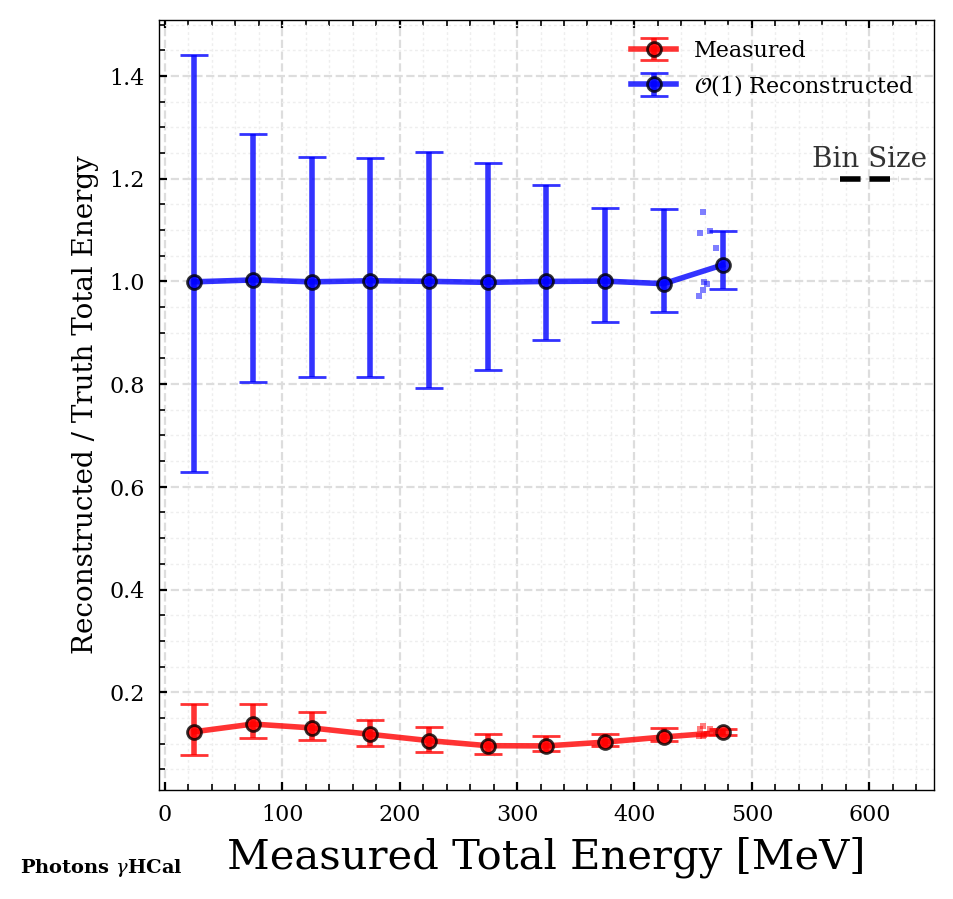

In [44]:
pho_energy_bins_hcal, pho_o1corr_hcal = o1corr_hcal(photons_hcal, bin_size=50,
                                                    label=labels_dict['photon']+'HCal',
                                                    ecal_params=[pho_energy_bins_ecal, pho_o1corr_ecal])
print(photons_hcal.get('PFCandidates_energy'))
print(photons_hcal.get('PFCandidates_energy_o1corr'))

In [45]:
pho_energy_bins_hcal, len(pho_energy_bins_hcal)

(array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.]), 11)

In [46]:
pho_o1corr_hcal, len(pho_o1corr_hcal)

(array([ 8.12814999,  7.27960443,  7.68240547,  8.48420715,  9.47431278,
        10.44567299, 10.46855545,  9.72650146,  8.87418842,  8.49231339]),
 10)

### Non Ecal corrected particles

#### Neutrons

Axes limits [0, 800] and [0, 100]


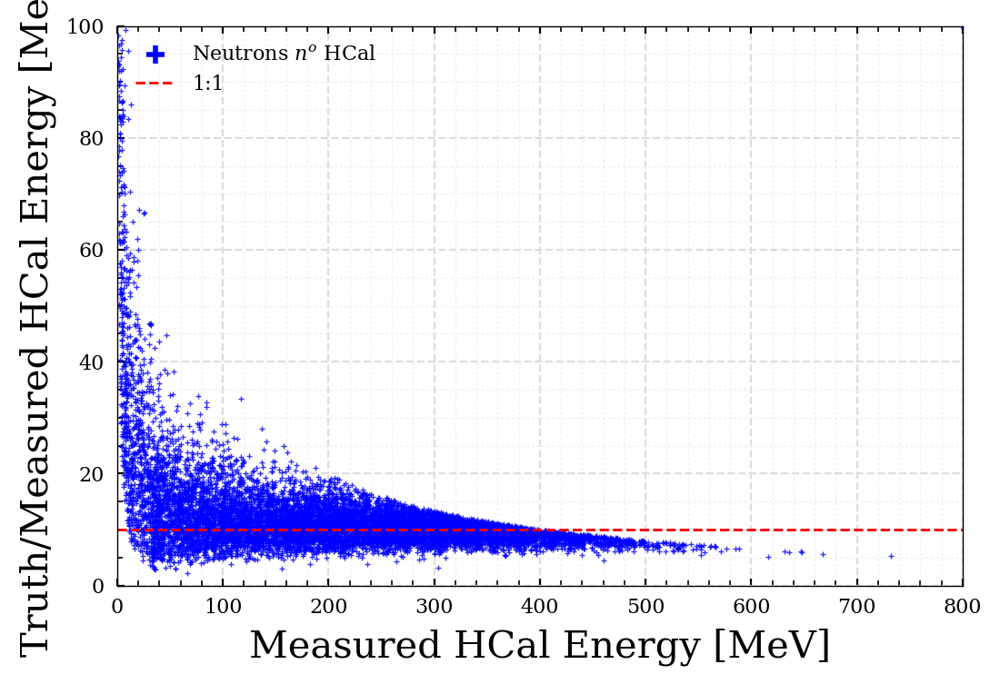

In [47]:
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
plotting.scatter(fig, ax,
                 neutrons_hcal.get('PFCandidates_hcalEnergy'),
                 neutrons_hcal.get('PFTruthHcal_energy')/neutrons_hcal.get('PFCandidates_hcalEnergy'),
                 xlim=[0, 800], ylim=[0, 100],
                 label=labels_dict['neutron']+' HCal',
                 draw_line=True, line_prop = [None, lambda x: [10]*len(x), 1, '--', 'red', '1:1'],
                 xlabel = 'Measured HCal Energy [MeV]', ylabel = 'Truth/Measured HCal Energy [MeV]')

(9994,) (9994,)
(9987,) (9987,)
(12,) (12,) (12,)
Average energy correction is 10.430161635080973:
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500. 550. 600.]
[20.69665146 12.09429502 11.27052307 10.75302887 10.78688526 10.31431437
  9.7699976   9.16780472  8.53408146  7.73670673  7.12850904  6.90914202]
(9999,) (9999,)
(9999,) (9999,)
(8,) (8,) (8,)
(9992,) (9992,)
(9992,) (9992,)
(8,) (8,) (8,)
(9999,) (9999,)
(9926,) (9926,)
(12,) (12,) (12,)
(9992,) (9992,)
(9926,) (9926,)
(12,) (12,) (12,)
[287.05566 261.4288  320.2444  ... 171.8698  363.0153  102.36407]
[2960.78235951 2696.45885305 3128.78686953 ... 1848.1208863  3328.05328202
 1153.69657967]
[20.69665146 12.09429502 11.27052307 10.75302887 10.78688526 10.31431437
  9.7699976   9.16780472  8.53408146  7.73670673  7.12850904  6.90914202] 10.430161635080973


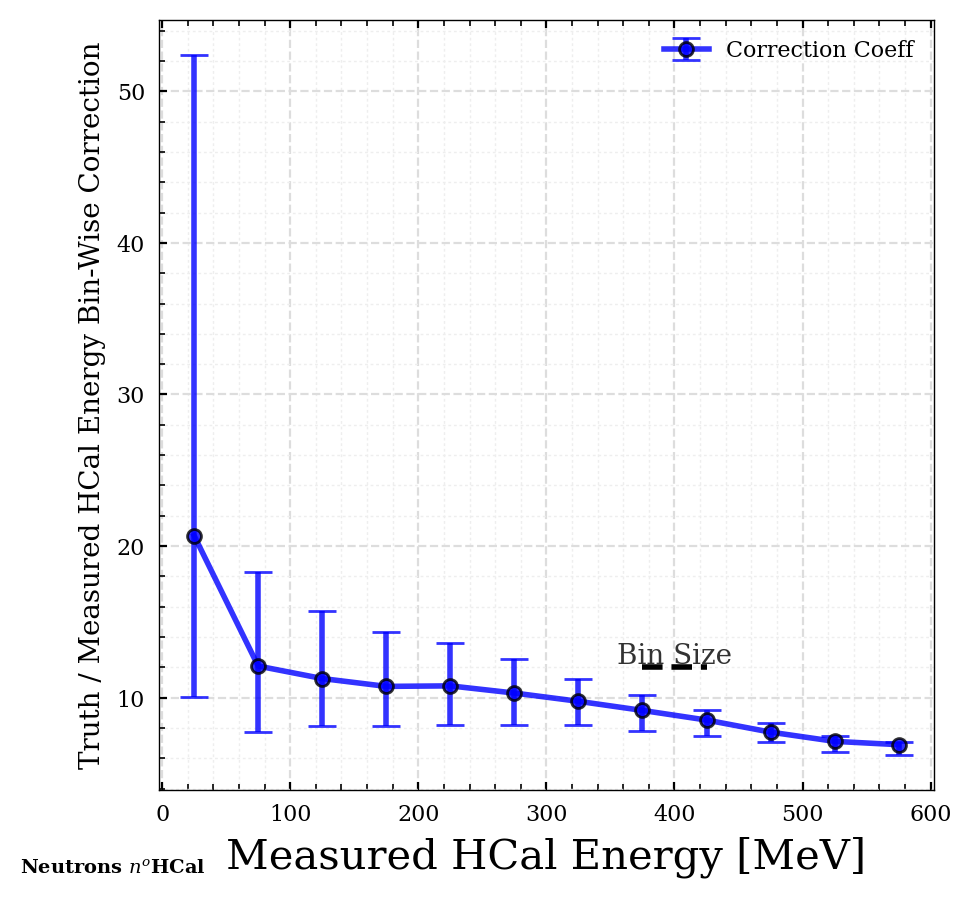

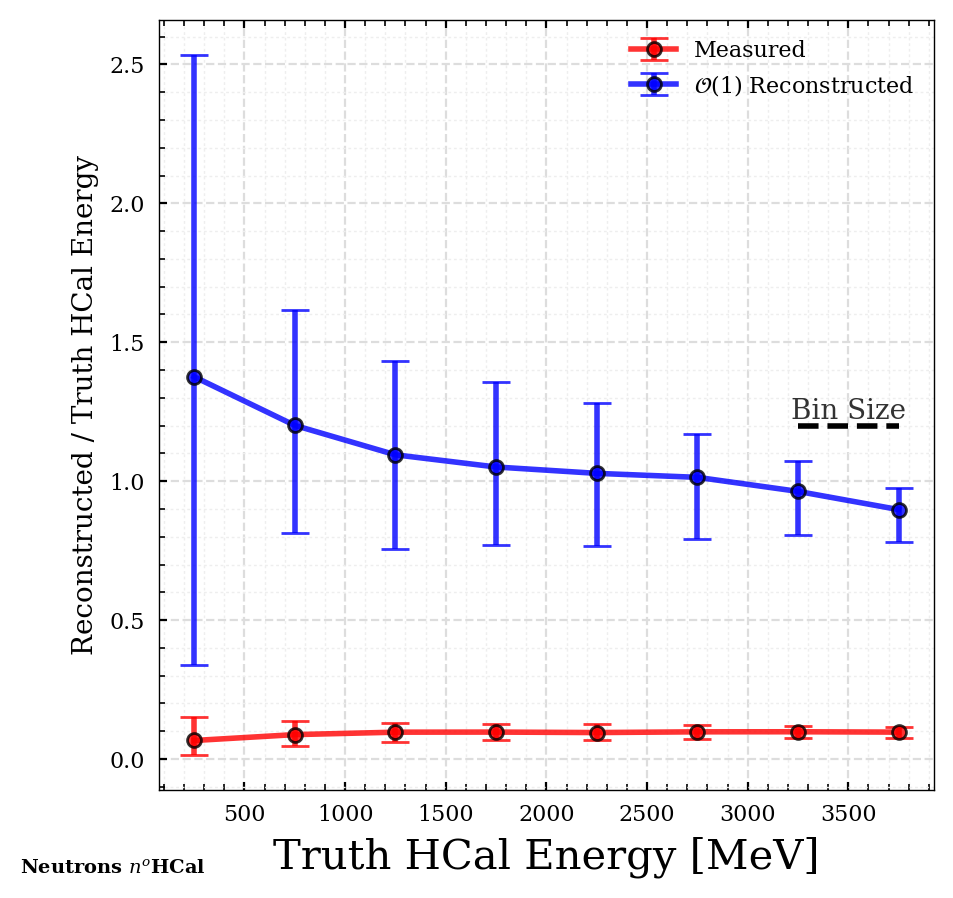

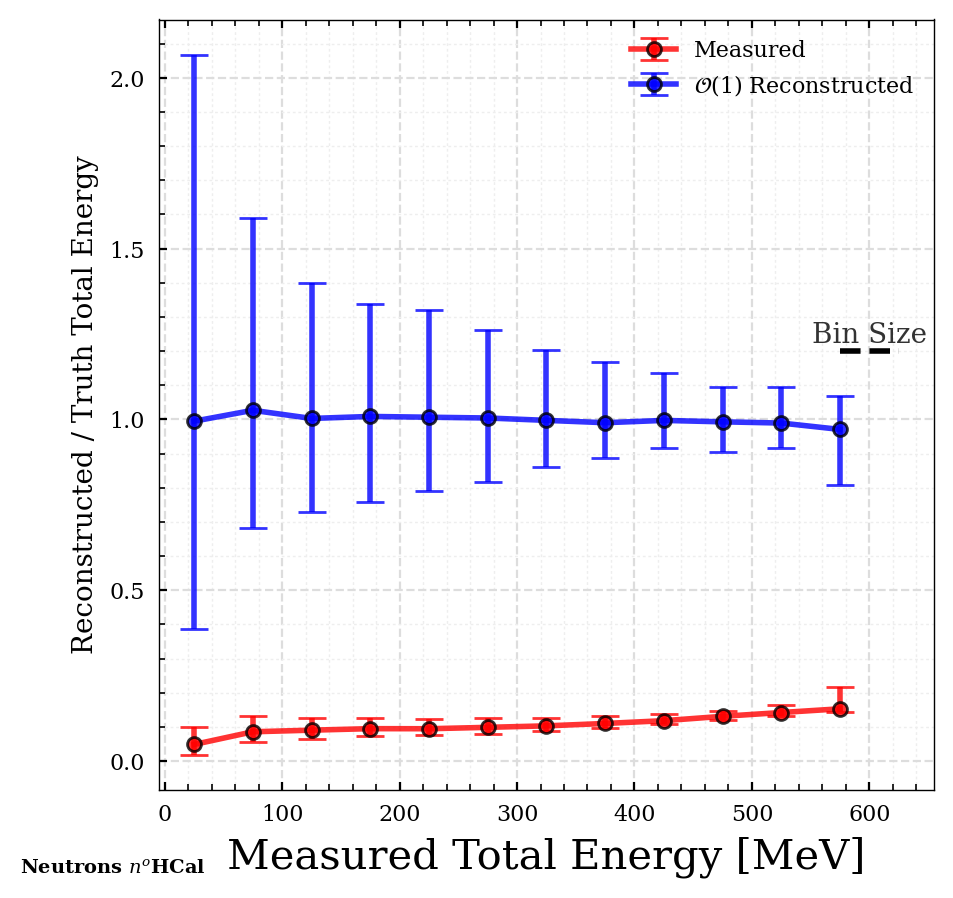

In [48]:
neu_energy_bins_hcal, neu_o1corr_hcal = o1corr_hcal(neutrons_hcal, bin_size=50,
                                                    label=labels_dict['neutron']+'HCal',
                                                    ecal_params=[[0, 1e10], [1]])  # no corrections at all
print(neutrons_hcal.get('PFCandidates_energy'))
print(neutrons_hcal.get('PFCandidates_energy_o1corr'))
print(neu_o1corr_hcal, np.mean(neu_o1corr_hcal))

#### Pions

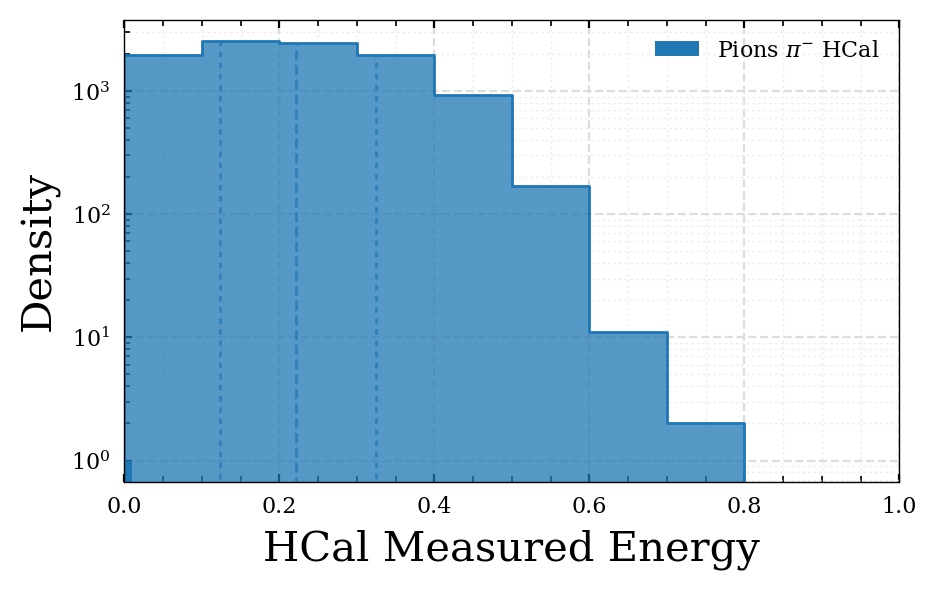

In [49]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
plotting.hist(fig, ax, pions_hcal.get('PFCandidates_hcalEnergy')/1e3, labels_dict['pion_hcal'], binwidth=0.1,
              xlim=[0, 1],
              draw_median=True, draw_quartiles=True,
              xlabel='HCal Measured Energy', ylabel='Density')
ax.set_yscale('log')
ax.legend()
plt.show()

Axes limits [0, 800] and [0, 100]


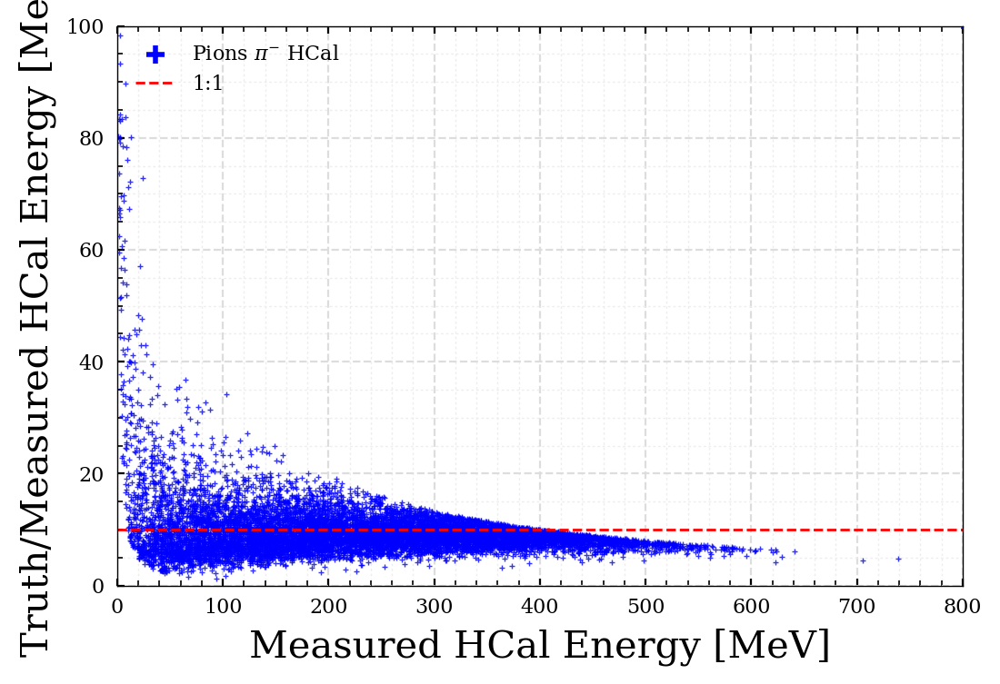

In [50]:
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
plotting.scatter(fig, ax,
                 pions_hcal.get('PFCandidates_hcalEnergy'),
                 pions_hcal.get('PFTruthHcal_energy')/pions_hcal.get('PFCandidates_hcalEnergy'),
                 xlim=[0, 800], ylim=[0, 100],
                 label=labels_dict['pion']+' HCal',
                 draw_line=True, line_prop = [None, lambda x: [10]*len(x), 1, '--', 'red', '1:1'],
                 xlabel = 'Measured HCal Energy [MeV]', ylabel = 'Truth/Measured HCal Energy [MeV]')

(9996,) (9996,)
(9992,) (9992,)
(13,) (13,) (13,)
Average energy correction is 8.51553071462191:
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500. 550. 600. 650.]
[11.40357971  8.65696907  8.89711761  9.21751165  9.43256569  9.26484966
  9.09767485  8.80322123  8.30389881  7.67658615  7.13891768  6.58217096
  6.2268362 ]
(9999,) (9999,)
(9999,) (9999,)
(8,) (8,) (8,)
(9997,) (9997,)
(9997,) (9997,)
(8,) (8,) (8,)
(9999,) (9999,)
(9900,) (9900,)
(14,) (14,) (14,)
(9997,) (9997,)
(9900,) (9900,)
(14,) (14,) (14,)
[245.32002  105.564575  87.31867  ...  51.632977  18.278372 148.98769 ]
[2313.99722786  939.22044146  755.91504434 ...  446.98508085  208.43886995
 1325.56096689]
[11.40357971  8.65696907  8.89711761  9.21751165  9.43256569  9.26484966
  9.09767485  8.80322123  8.30389881  7.67658615  7.13891768  6.58217096
  6.2268362 ] 8.51553071462191


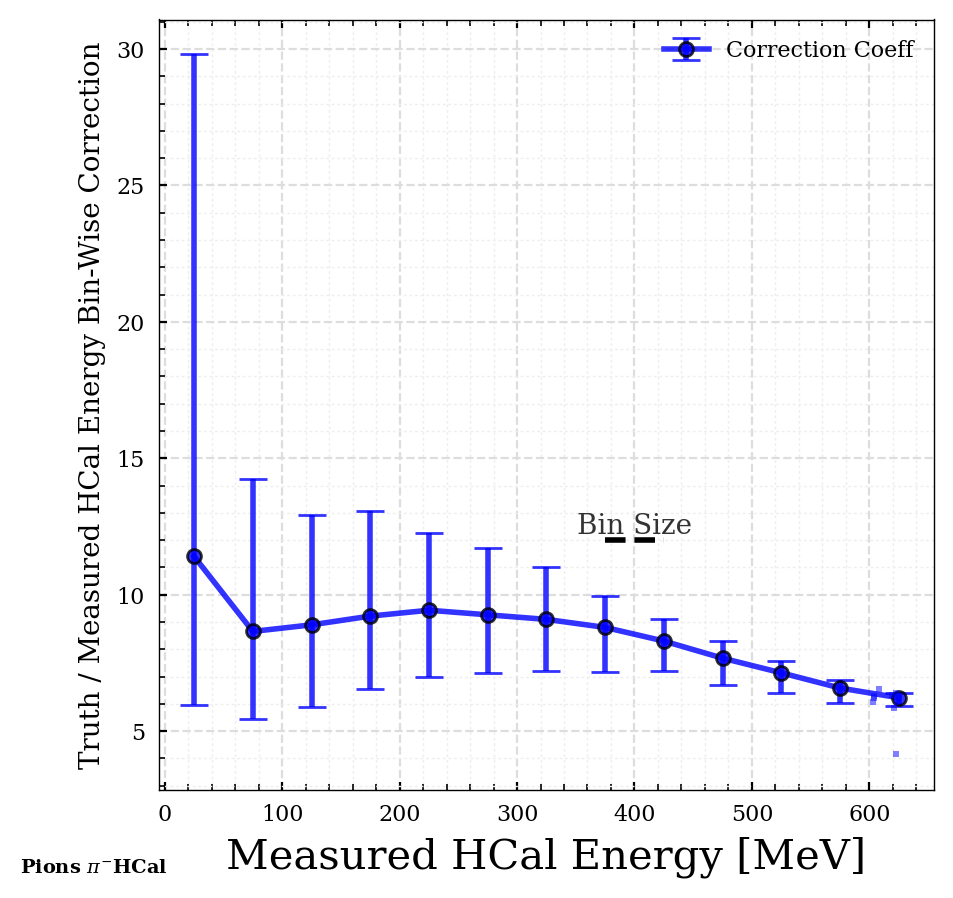

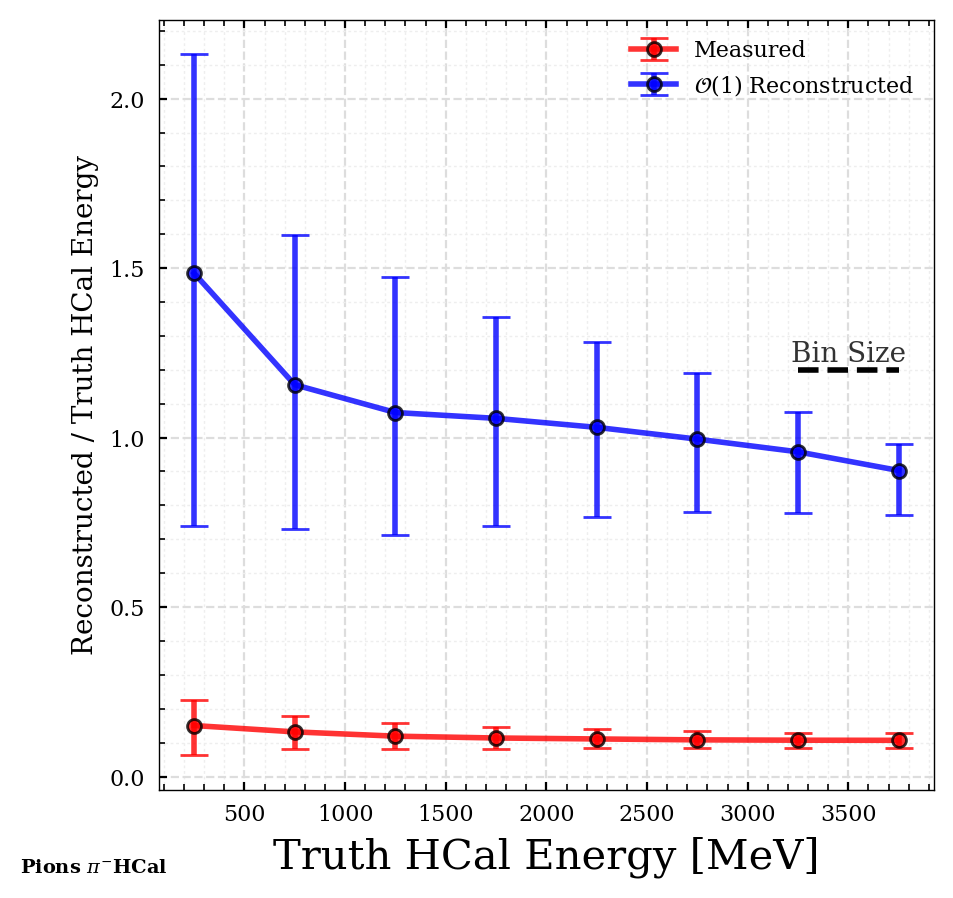

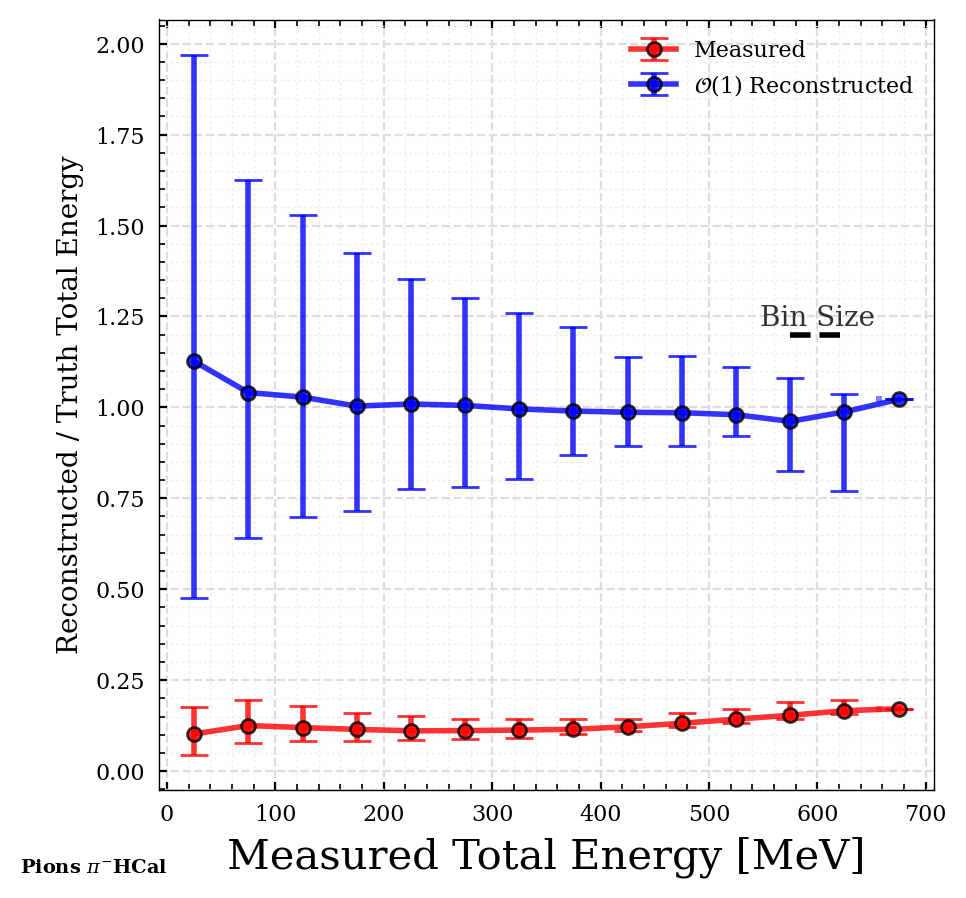

In [51]:
pim_energy_bins_hcal, pim_o1corr_hcal = o1corr_hcal(pions_hcal, bin_size=50,
                                                    label=labels_dict['pion']+'HCal',
                                                    ecal_params=[[0, 1e10], [1]])  # no corrections at all
print(pions_hcal.get('PFCandidates_energy'))
print(pions_hcal.get('PFCandidates_energy_o1corr'))
print(pim_o1corr_hcal, np.mean(pim_o1corr_hcal))

#### Protons

Axes limits [0, 800] and [0, 100]


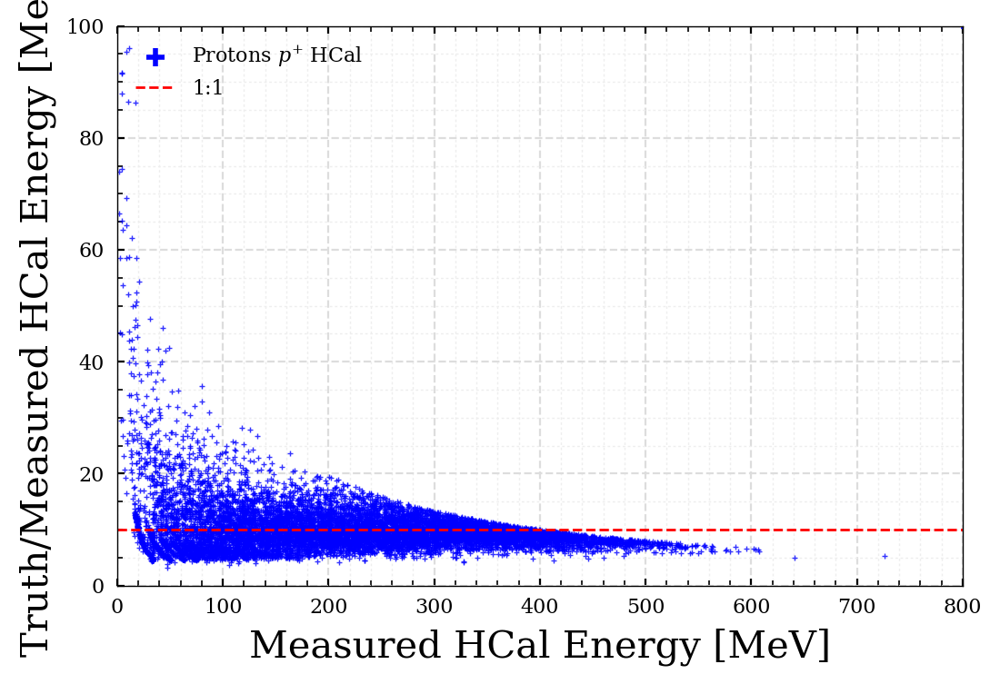

In [52]:
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
plotting.scatter(fig, ax,
                 protons_hcal.get('PFCandidates_hcalEnergy'),
                 protons_hcal.get('PFTruthHcal_energy')/protons_hcal.get('PFCandidates_hcalEnergy'),
                 xlim=[0, 800], ylim=[0, 100],
                 label=labels_dict['proton']+' HCal',
                 draw_line=True, line_prop = [None, lambda x: [10]*len(x), 1, '--', 'red', '1:1'],
                 xlabel = 'Measured HCal Energy [MeV]', ylabel = 'Truth/Measured HCal Energy [MeV]')

(9898,) (9898,)
(9892,) (9892,)
(12,) (12,) (12,)
Average energy correction is 8.94060375293096:
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500. 550. 600.]
[10.84956312  9.25769329  9.72972488  9.88422489  9.89008617  9.64541388
  9.41108131  8.89256859  8.39314938  7.75644255  7.10567379  6.47162318]
(10000,) (10000,)
(10000,) (10000,)
(8,) (8,) (8,)
(9994,) (9994,)
(9994,) (9994,)
(8,) (8,) (8,)
(10000,) (10000,)
(9945,) (9945,)
(13,) (13,) (13,)
(9994,) (9994,)
(9941,) (9941,)
(13,) (13,) (13,)
[193.76894 214.60907 260.37433 ... 190.16884 160.10231 294.0633 ]
[1915.255742   2122.50219429 2148.76692744 ... 1879.67156713 1582.4872395
 2836.36217101]
[10.84956312  9.25769329  9.72972488  9.88422489  9.89008617  9.64541388
  9.41108131  8.89256859  8.39314938  7.75644255  7.10567379  6.47162318] 8.94060375293096


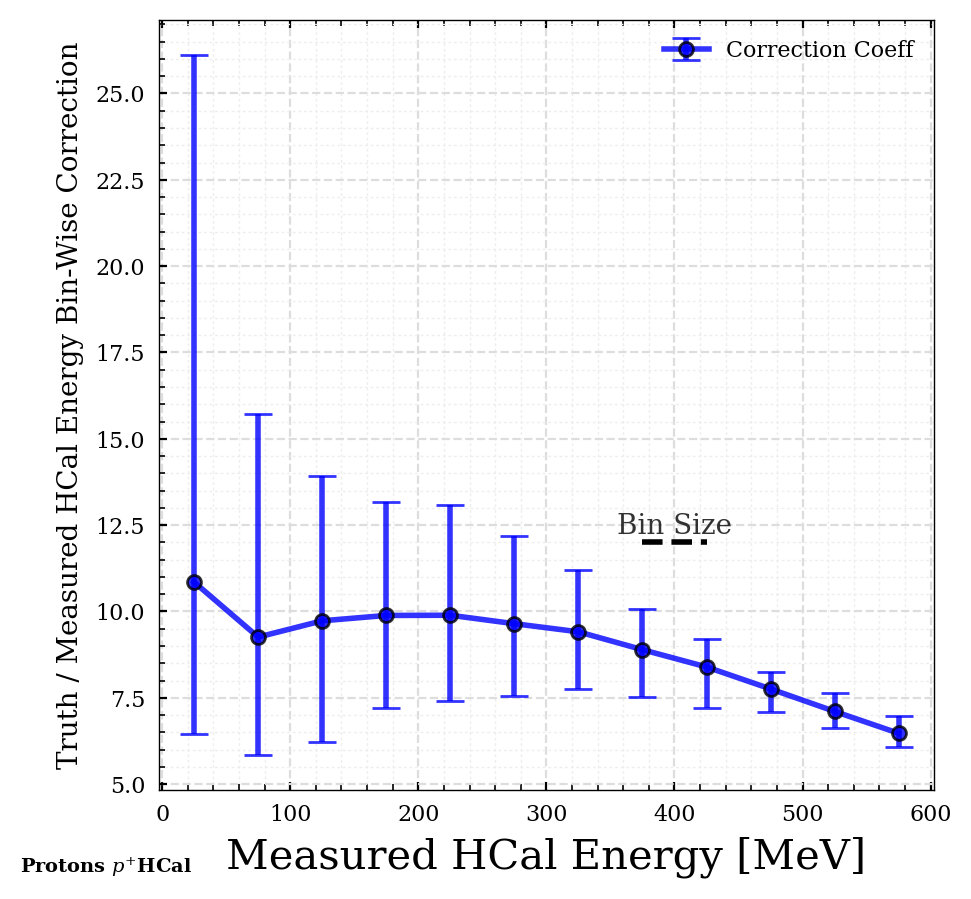

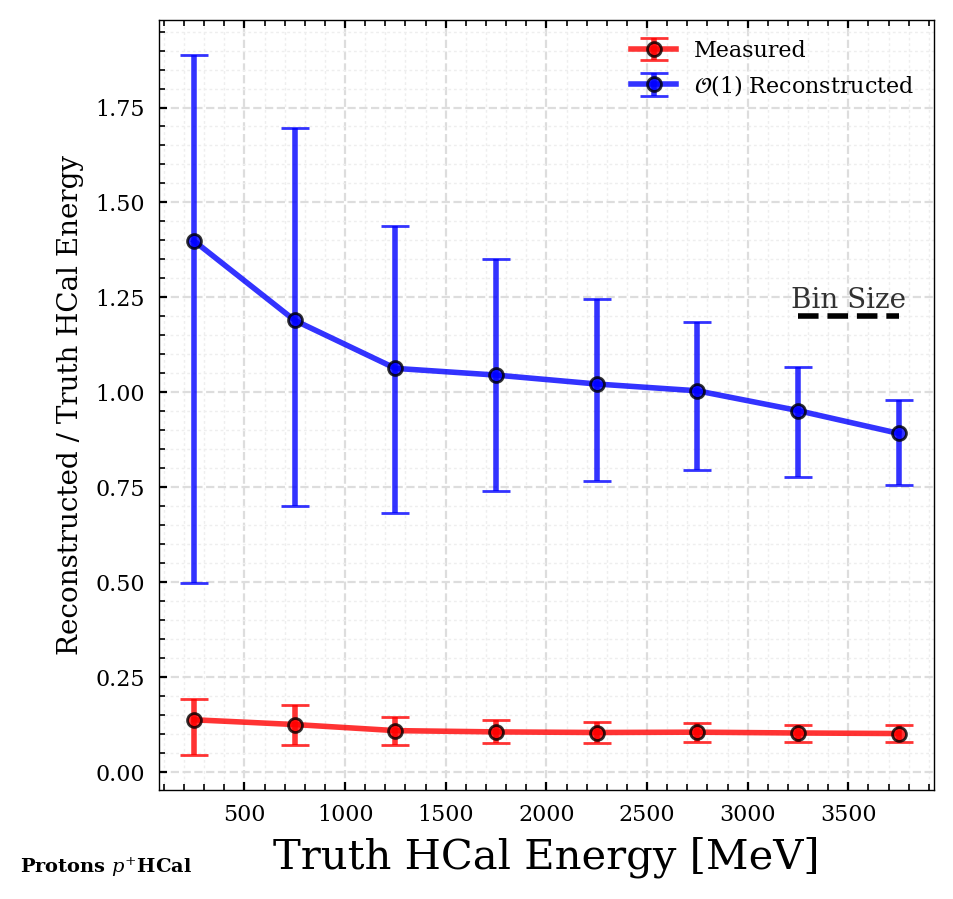

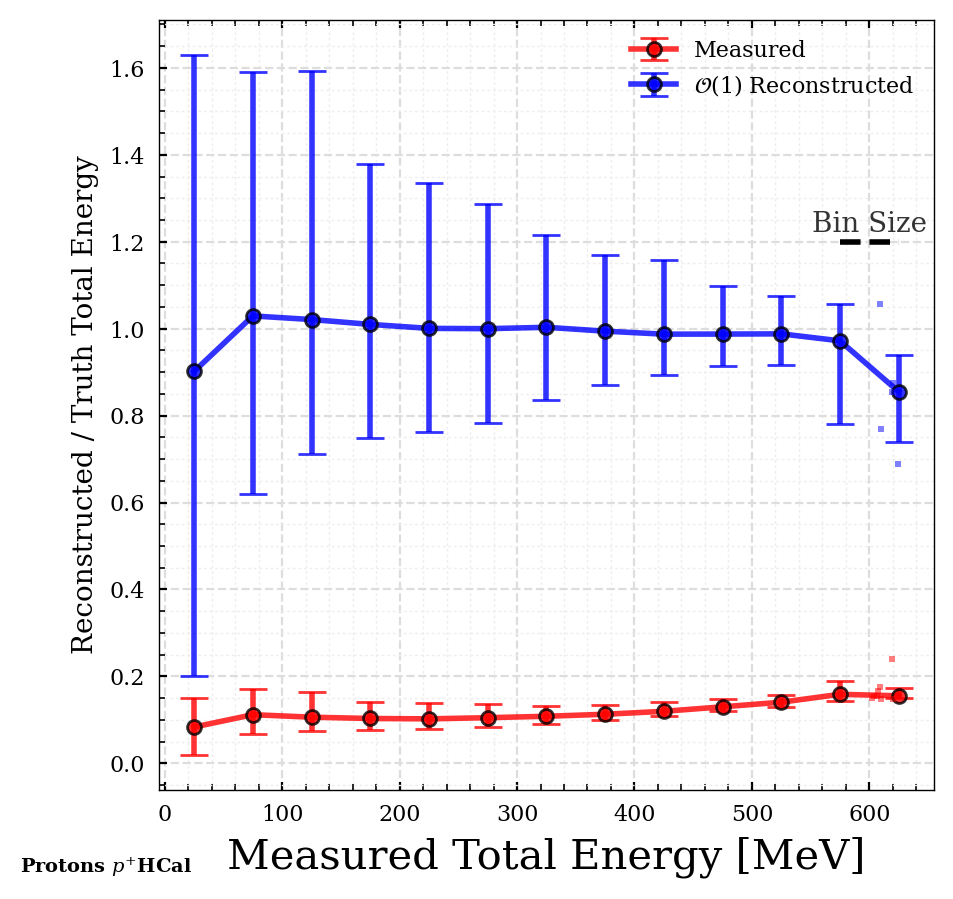

In [53]:
pro_energy_bins_hcal, pro_o1corr_hcal = o1corr_hcal(protons_hcal, bin_size=50,
                                                    label=labels_dict['proton']+'HCal',
                                                    ecal_params=[[0, 1e10], [1]])  # no corrections at all
print(protons_hcal.get('PFCandidates_energy'))
print(protons_hcal.get('PFCandidates_energy_o1corr'))
print(pro_o1corr_hcal, np.mean(pro_o1corr_hcal))

## Summary: ECal & HCal calibrations

`ele_energy_bins_ecal`, `pho_energy_bins_ecal`

`ele_o1corr_ecal`

`pho_o1corr_ecal`

-----

`ele_energy_bins_hcal`, `pho_energy_bins_hcal`

`ele_o1corr_hcal`

`pho_o1corr_hcal`

### ECal coefficients

In [54]:
ele_energy_bins_ecal, ele_o1corr_ecal

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.,
        4500., 5000., 5500., 6000.]),
 array([1.18598557, 1.00625324, 0.97645277, 0.96624851, 0.97098845,
        0.95967686, 0.95366329, 0.92554763, 0.86182195, 0.7882978 ,
        0.71596402, 0.65569708]))

In [55]:
pho_energy_bins_ecal, pho_o1corr_ecal

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.,
        4500., 5000., 5500., 6000.]),
 array([1.19377148, 1.05279595, 1.01311707, 1.00635087, 0.99447447,
        0.99247414, 0.97390121, 0.95206821, 0.88605094, 0.81365258,
        0.73887473, 0.67134774]))

### HCal coefficients

In [56]:
ele_energy_bins_hcal, ele_o1corr_hcal

(array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.]),
 array([ 8.72792101,  7.47605658,  7.8331418 ,  8.58382893,  9.46359539,
        10.44721127, 10.46484852,  9.68849564,  8.86627007,  8.00884438]))

In [57]:
pho_energy_bins_hcal, pho_o1corr_hcal

(array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.]),
 array([ 8.12814999,  7.27960443,  7.68240547,  8.48420715,  9.47431278,
        10.44567299, 10.46855545,  9.72650146,  8.87418842,  8.49231339]))

In [58]:
neu_energy_bins_hcal, neu_o1corr_hcal

(array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.,
        550., 600.]),
 array([20.69665146, 12.09429502, 11.27052307, 10.75302887, 10.78688526,
        10.31431437,  9.7699976 ,  9.16780472,  8.53408146,  7.73670673,
         7.12850904,  6.90914202]))

In [59]:
pim_energy_bins_hcal, pim_o1corr_hcal

(array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.,
        550., 600., 650.]),
 array([11.40357971,  8.65696907,  8.89711761,  9.21751165,  9.43256569,
         9.26484966,  9.09767485,  8.80322123,  8.30389881,  7.67658615,
         7.13891768,  6.58217096,  6.2268362 ]))

In [60]:
pro_energy_bins_hcal, pro_o1corr_hcal

(array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.,
        550., 600.]),
 array([10.84956312,  9.25769329,  9.72972488,  9.88422489,  9.89008617,
         9.64541388,  9.41108131,  8.89256859,  8.39314938,  7.75644255,
         7.10567379,  6.47162318]))

### Extending & Mean Corrections

In [61]:
o1corr_arr = [
    [ele_energy_bins_hcal, ele_o1corr_hcal],
    [pho_energy_bins_hcal, pho_o1corr_hcal],
    [neu_energy_bins_hcal, neu_o1corr_hcal],
    [pim_energy_bins_hcal, pim_o1corr_hcal],
    [pro_energy_bins_hcal, pro_o1corr_hcal]
]
names_arr = 'electron photon neutron pion proton'.split(' ')

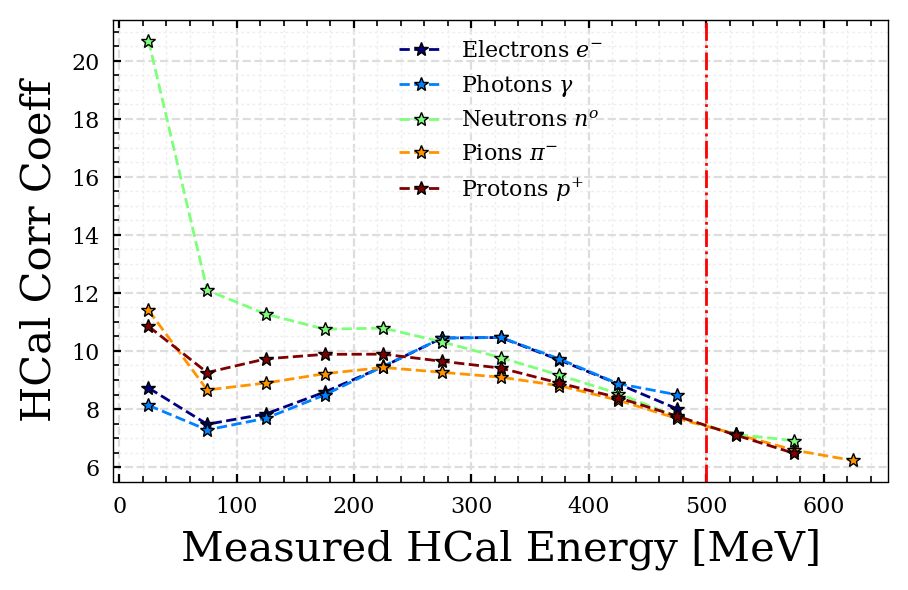

In [62]:
# make a line at HCal measurement = 500
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
plotting.grid(ax)
# plot the hcal corrections
from matplotlib import cm
colors = cm.jet(np.linspace(0, 1, len(o1corr_arr)))

for i, o1corr in enumerate(o1corr_arr):
    plotting.bin_plot(fig, ax, o1corr[0], o1corr[1],
                      color=colors[i], alpha=1,
                      xlabel='Measured HCal Energy [MeV]',
                      ylabel='HCal Corr Coeff',
                      label=labels_dict[names_arr[i]])
ax.axvline(x=500, lw=1, ls='-.', c='red')
ax.legend()
plt.show()

In [63]:
def extended_mean(corr_arr):
    flip_arr = list(map(list, zip(*corr_arr)))
    bins = flip_arr[0]
    vals = flip_arr[1]
    # the largest set of bins
    bin_len = np.array([len(i) for i in bins])
    ext_bins = np.array(bins[np.argmax(bin_len)])
    # index for mapping
    ind = []
    for i, _ in enumerate(ext_bins[:-1]):
        ind.append(i < bin_len - 1)
    # extend val for each type
    ind = np.cumsum(np.transpose(ind), axis=1) - 1
    ext_vals = np.array([val[ind[j]] for j, val in enumerate(vals)])
    # average corrections for all particles
    avg_vals = np.mean(ext_vals, axis=0)
    # average corrections for only electrons and photons
    avg_vals_pe = np.mean(ext_vals[:2], axis=0)
    
    return ext_bins, ext_vals, avg_vals, avg_vals_pe
    
ext_bins_hcal, ext_o1corrs_hcal, avg_o1corr_hcal, pe_o1corr_hcal = extended_mean(o1corr_arr)

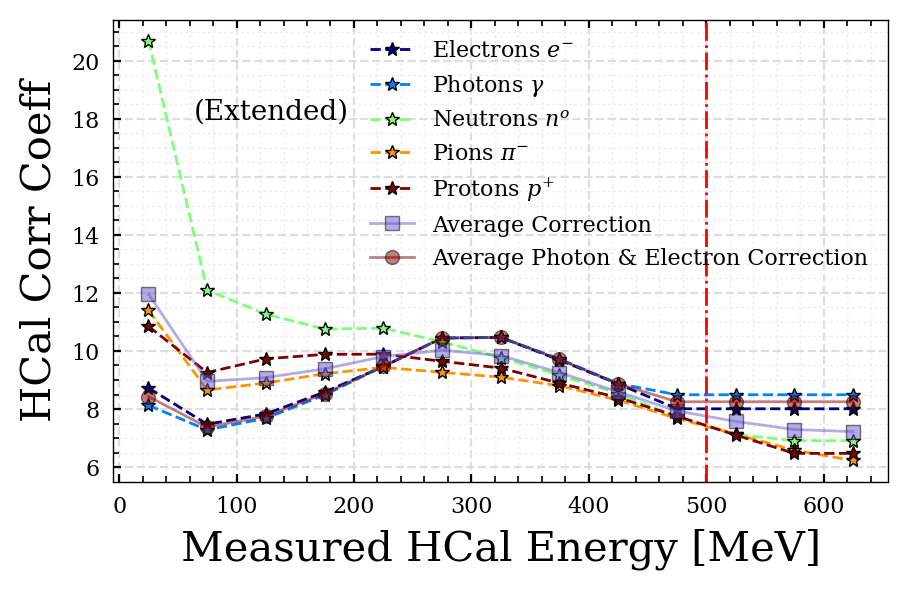

In [64]:
# make a line at HCal measurement = 500
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
plotting.grid(ax)
# plot the hcal corrections
from matplotlib import cm
colors = cm.jet(np.linspace(0, 1, len(o1corr_arr)))

for i, o1corr in enumerate(ext_o1corrs_hcal):
    plotting.bin_plot(fig, ax, ext_bins_hcal, o1corr,
                      color=colors[i], alpha=1,
                      xlabel='Measured HCal Energy [MeV]',
                      ylabel='HCal Corr Coeff',
                      label=labels_dict[names_arr[i]])
# avergae
plotting.bin_plot(fig, ax, ext_bins_hcal, avg_o1corr_hcal,
                  color='slateblue', fmt='s-', alpha=0.5,
                  xlabel='Measured HCal Energy [MeV]',
                  ylabel='HCal Corr Coeff',
                  label='Average Correction')
# photon & electron average
plotting.bin_plot(fig, ax, ext_bins_hcal, pe_o1corr_hcal,
                  color='maroon', fmt='o-', alpha=0.5,
                  xlabel='Measured HCal Energy [MeV]',
                  ylabel='HCal Corr Coeff',
                  label='Average Photon & Electron Correction')
ax.axvline(x=500, lw=1, ls='-.', c='red')
ax.text(130, 18, '(Extended)', ha='center')
#ax.set_yscale('log')
ax.legend()
plt.show()

In [65]:
print('ECal Corrections')
print(f'{"bins":<15}{"ele coeff":<15}{"pho coeff":<15}')
assert(np.array_equiv(ele_energy_bins_ecal, pho_energy_bins_ecal))
for ebin, ecorr, gcorr in zip(ele_energy_bins_ecal, ele_o1corr_ecal, pho_o1corr_ecal):
    print(f'{ebin:<15.2f}{ecorr:<15.2f}{gcorr:<15.2f}')

print('-' * 20)

print('HCal Corrections')
print(f'{"bins":<15}{"ele coeff":<15}{"pho coeff":<15}')
assert(np.array_equiv(ele_energy_bins_hcal, pho_energy_bins_hcal))
for ebin, ecorr, gcorr in zip(ele_energy_bins_hcal, ele_o1corr_hcal, pho_o1corr_hcal):
    print(f'{ebin:<15.2f}{ecorr:<15.2f}{gcorr:<15.2f}')

ECal Corrections
bins           ele coeff      pho coeff      
0.00           1.19           1.19           
500.00         1.01           1.05           
1000.00        0.98           1.01           
1500.00        0.97           1.01           
2000.00        0.97           0.99           
2500.00        0.96           0.99           
3000.00        0.95           0.97           
3500.00        0.93           0.95           
4000.00        0.86           0.89           
4500.00        0.79           0.81           
5000.00        0.72           0.74           
5500.00        0.66           0.67           
--------------------
HCal Corrections
bins           ele coeff      pho coeff      
0.00           8.73           8.13           
50.00          7.48           7.28           
100.00         7.83           7.68           
150.00         8.58           8.48           
200.00         9.46           9.47           
250.00         10.45          10.45          
300.00         10.46     

## Applying to other particles

The range of ecal and hcal measurements should be similar for all particle species, since they roughly had the same energy composition.

In [66]:
print(names_arr)
len(ext_bins_hcal), ext_o1corrs_hcal.shape, len(avg_o1corr_hcal), len(pe_o1corr_hcal)

['electron', 'photon', 'neutron', 'pion', 'proton']


(14, (5, 13), 13, 13)

In [67]:
# ecal is only electrons & photons
avg_o1corr_ecal = np.mean([ele_o1corr_ecal, pho_o1corr_ecal], axis=0)
avg_o1corr_ecal

array([1.18987852, 1.02952459, 0.99478492, 0.98629969, 0.98273146,
       0.9760755 , 0.96378225, 0.93880792, 0.87393644, 0.80097519,
       0.72741938, 0.66352241])

In [68]:
# scheme = 'nearest'
scheme = 'spline'

### Electrons & Photons

#### Average

In [69]:
ele_energy_bins_ecal, avg_o1corr_ecal, ext_bins_hcal, pe_o1corr_hcal

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.,
        4500., 5000., 5500., 6000.]),
 array([1.18987852, 1.02952459, 0.99478492, 0.98629969, 0.98273146,
        0.9760755 , 0.96378225, 0.93880792, 0.87393644, 0.80097519,
        0.72741938, 0.66352241]),
 array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.,
        550., 600., 650.]),
 array([ 8.4280355 ,  7.37783051,  7.75777364,  8.53401804,  9.46895409,
        10.44644213, 10.46670198,  9.70749855,  8.87022924,  8.25057888,
         8.25057888,  8.25057888,  8.25057888]))

(10000,) (10000,)
(10000,) (10000,)
(19,) (19,) (19,)
(10000,) (10000,)
(10000,) (10000,)
(19,) (19,) (19,)
(9965,) (9965,)
(9965,) (9965,)
(19,) (19,) (19,)
(9965,) (9965,)
(9965,) (9965,)
(19,) (19,) (19,)
(10000,) (10000,)
(10000,) (10000,)
(19,) (19,) (19,)
(10000,) (10000,)
(10000,) (10000,)
(19,) (19,) (19,)
(9378,) (9378,)
(9378,) (9378,)
(19,) (19,) (19,)
(9378,) (9378,)
(9378,) (9378,)
(19,) (19,) (19,)


(array([ 848.20860187, 3378.21401351, 2189.67325666, ...,  529.13885138,
        1598.30882393,  700.59265157]),
 array([ 0.        , 12.38338943,  0.        , ..., 19.5152895 ,
         0.        ,  0.        ]),
 array([ 848.20860187, 3390.59740294, 2189.67325666, ...,  548.65414088,
        1598.30882393,  700.59265157]))

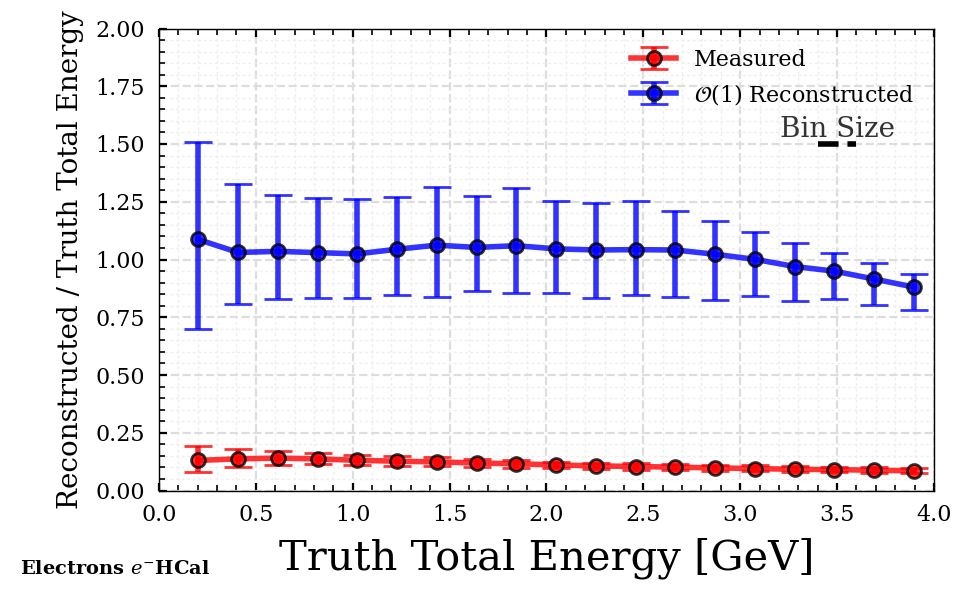

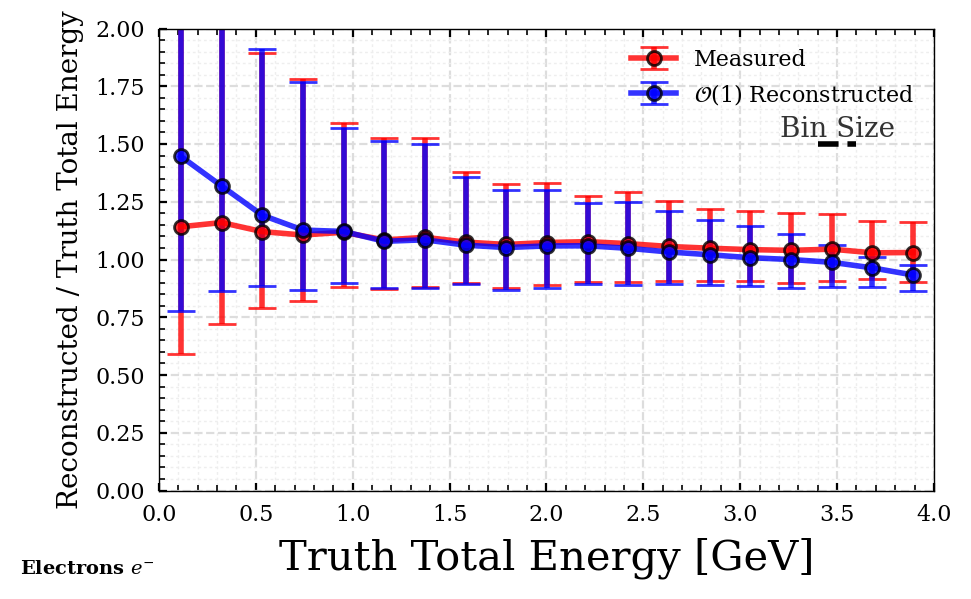

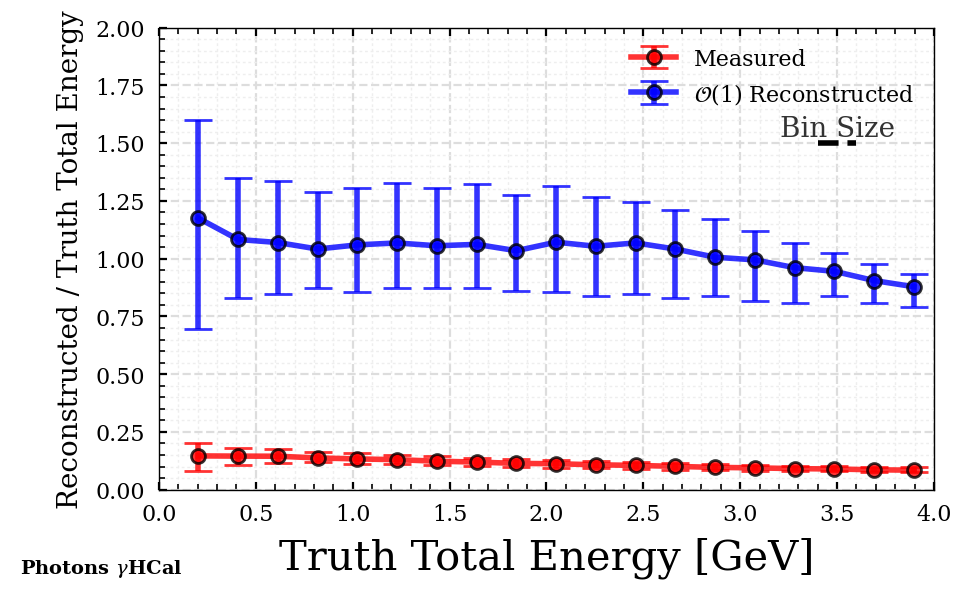

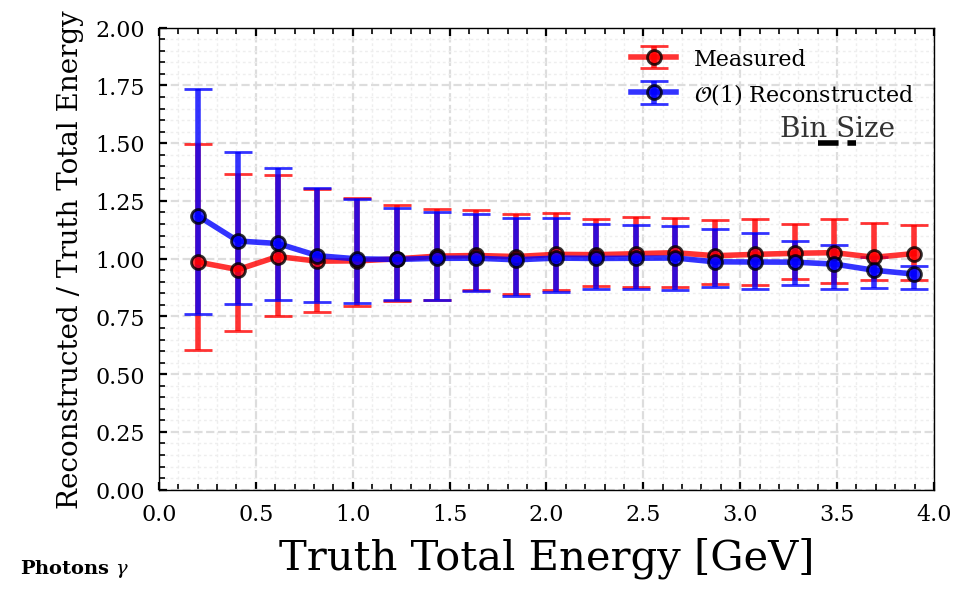

In [70]:
electrons_hcal.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                             energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                             scheme=scheme, label=labels_dict['electron']+'HCal')
electrons.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                        energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                        scheme=scheme, label=labels_dict['electron'])
photons_hcal.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                           energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                           scheme=scheme, label=labels_dict['photon']+'HCal')
photons.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                      energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                      scheme=scheme, label=labels_dict['photon'])

#### Per-Particle

In [71]:
# electrons_hcal.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
#                              energy_bins_hcal=ext_bins_hcal, o1corr_hcal=ext_o1corrs_hcal[0],
#                              scheme=scheme, label=labels_dict['electron']+'HCal')
# electrons.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
#                         energy_bins_hcal=ext_bins_hcal, o1corr_hcal=ext_o1corrs_hcal[0],
#                         scheme=scheme, label=labels_dict['electron'])
# photons_hcal.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
#                            energy_bins_hcal=ext_bins_hcal, o1corr_hcal=ext_o1corrs_hcal[1],
#                            scheme=scheme, label=labels_dict['photon']+'HCal')
# photons.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
#                       energy_bins_hcal=ext_bins_hcal, o1corr_hcal=ext_o1corrs_hcal[1],
#                       scheme=scheme, label=labels_dict['photon'])

### Other particles

#### Average

(9999,) (9999,)
(9999,) (9999,)
(19,) (19,) (19,)
(9999,) (9999,)
(9999,) (9999,)
(19,) (19,) (19,)
(9881,) (9881,)
(9653,) (9653,)
(19,) (19,) (19,)
(9881,) (9881,)
(9653,) (9653,)
(19,) (19,) (19,)
(9999,) (9999,)
(9999,) (9999,)
(19,) (19,) (19,)
(9999,) (9999,)
(9999,) (9999,)
(19,) (19,) (19,)
(9873,) (9873,)
(9862,) (9862,)
(19,) (19,) (19,)
(9873,) (9873,)
(9862,) (9862,)
(19,) (19,) (19,)
(10000,) (10000,)
(10000,) (10000,)
(19,) (19,) (19,)
(10000,) (10000,)
(10000,) (10000,)
(19,) (19,) (19,)
(9902,) (9902,)
(9741,) (9741,)
(19,) (19,) (19,)
(9902,) (9902,)
(9741,) (9741,)
(19,) (19,) (19,)


(array([ 953.31775534, 2274.83179733, 2216.95842701, ..., 1198.10623341,
         781.19022399,  404.31143089]),
 array([   2.10689739,  568.5480087 ,   38.62092111, ...,    0.        ,
           0.        , 1416.00674663]),
 array([ 955.42465272, 2843.37980603, 2255.57934813, ..., 1198.10623341,
         781.19022399, 1820.31817753]))

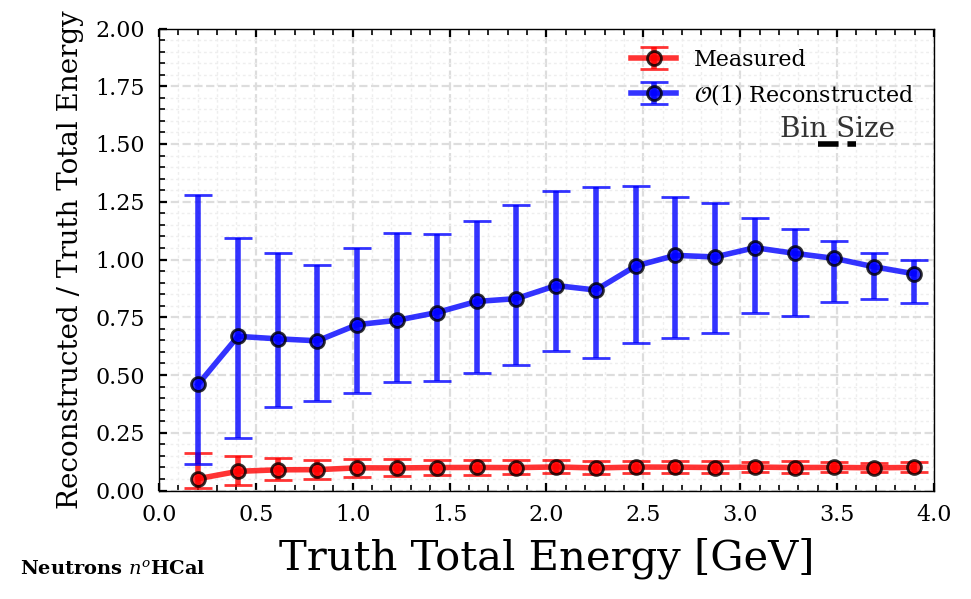

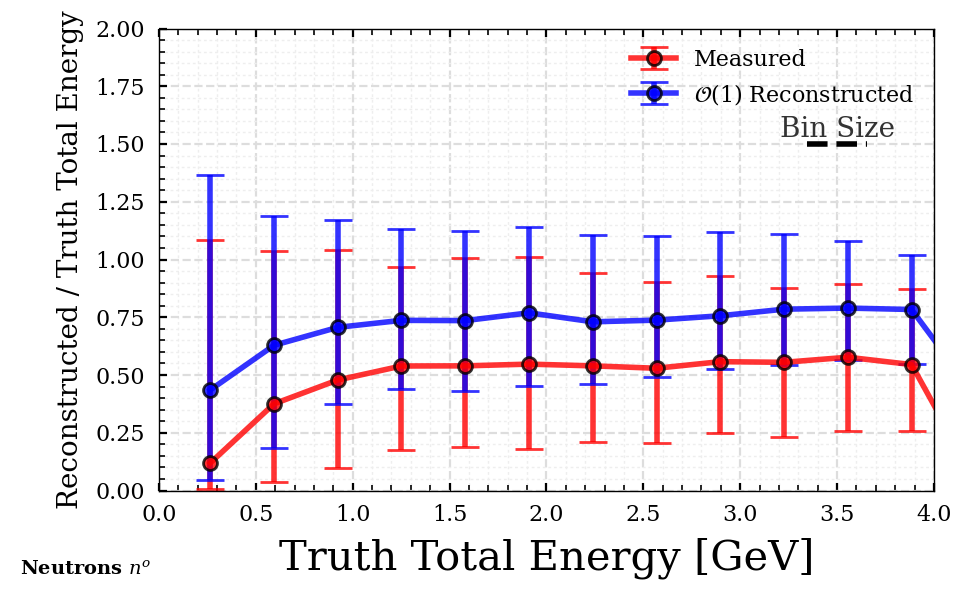

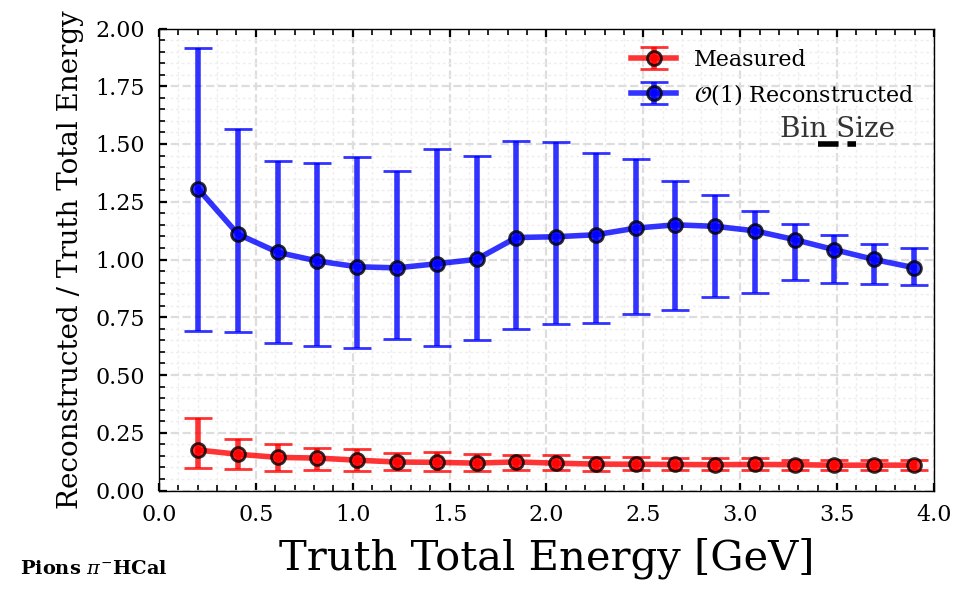

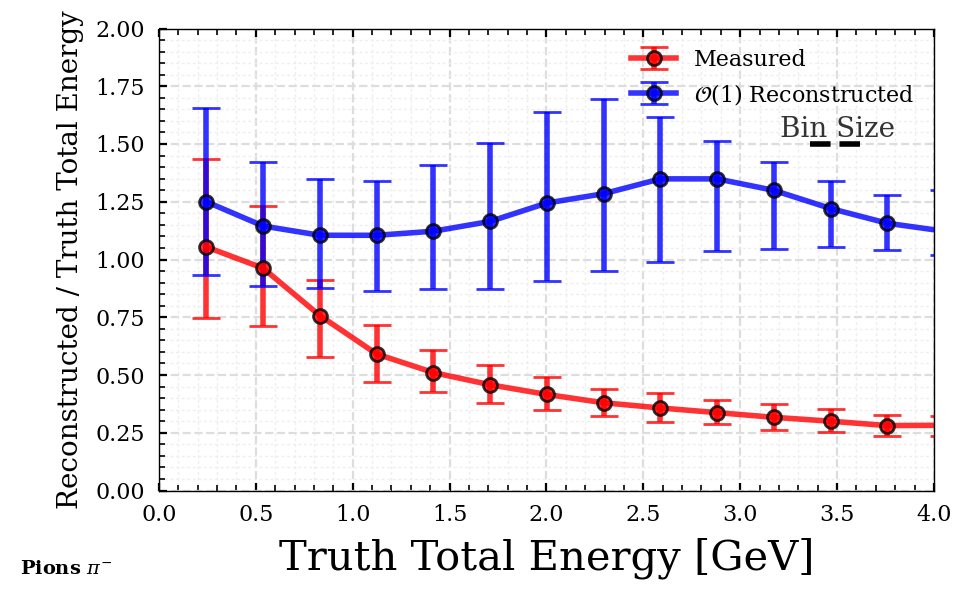

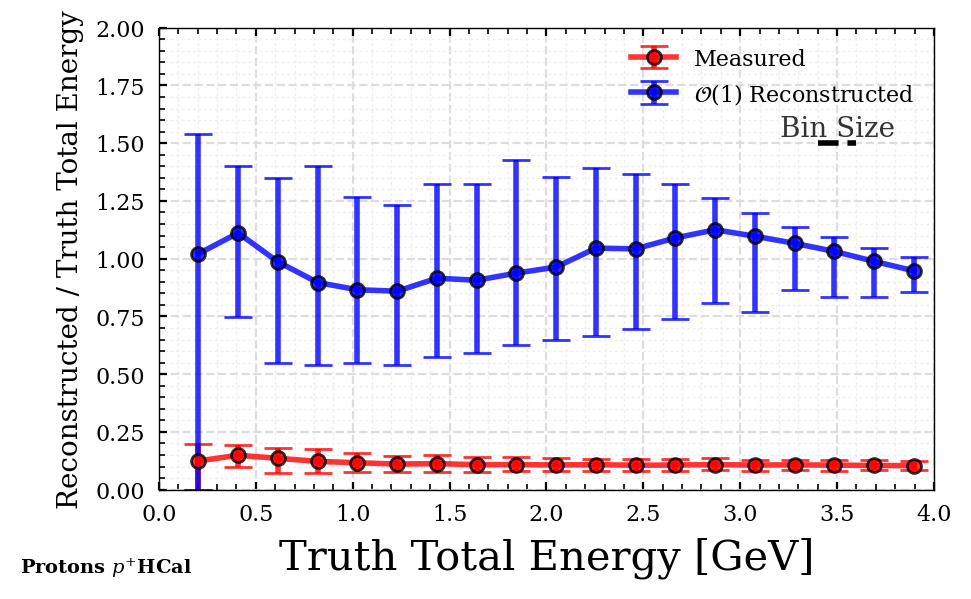

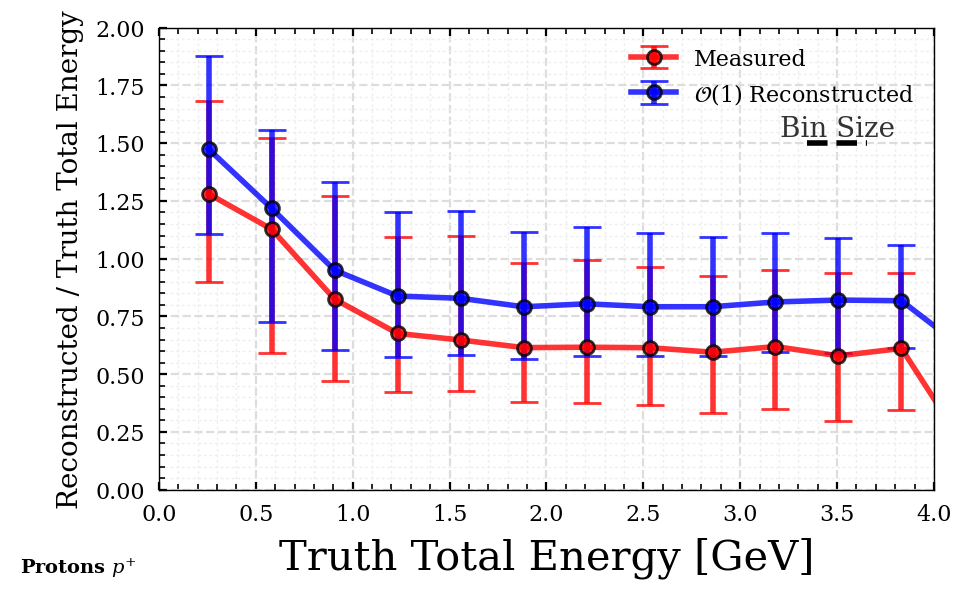

In [72]:
neutrons_hcal.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                            energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                            scheme=scheme, label=labels_dict['neutron']+'HCal')
neutrons.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                       energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                       scheme=scheme, label=labels_dict['neutron'])
pions_hcal.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                         energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                         scheme=scheme, label=labels_dict['pion']+'HCal')
pions.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                    energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                    scheme=scheme, label=labels_dict['pion'])
protons_hcal.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                           energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                           scheme=scheme, label=labels_dict['proton']+'HCal')
protons.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                      energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                      scheme=scheme, label=labels_dict['proton'])

#### Per-Particle

In [73]:
# neutrons_hcal.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
#                             energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
#                             scheme=scheme, label=labels_dict['neutron']+'HCal')
# neutrons.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
#                        energy_bins_hcal=ext_bins_hcal, o1corr_hcal=ext_o1corrs_hcal[2],
#                        scheme=scheme, label=labels_dict['neutron'])
# pions_hcal.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
#                          energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
#                          scheme=scheme, label=labels_dict['pion']+'HCal')
# pions.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
#                     energy_bins_hcal=ext_bins_hcal, o1corr_hcal=ext_o1corrs_hcal[3],
#                     scheme=scheme, label=labels_dict['pion'])
# protons_hcal.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
#                            energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
#                            scheme=scheme, label=labels_dict['proton']+'HCal')
# protons.o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
#                       energy_bins_hcal=ext_bins_hcal, o1corr_hcal=ext_o1corrs_hcal[4],
#                       scheme=scheme, label=labels_dict['proton'])

## Investigating other particles

In [74]:
_ = pions.list_props()

Property Name                 Number of Entries   Unique Entries      Range                         Mean
PFCandidates_ecalClusterDXDZ  9873                9867                -0.63         0.43            -0.04
PFCandidates_ecalClusterDYDZ  9873                9872                -0.48         0.56            0.00
PFCandidates_ecalClusterEDXDZ 9873                9867                0.00          0.08            0.00
PFCandidates_ecalClusterEDYDZ 9873                9873                0.00          0.04            0.00
PFCandidates_ecalClusterEX    9873                9859                0.24        120.05            22.95
PFCandidates_ecalClusterEY    9873                9840                0.00        104.30            22.26
PFCandidates_ecalClusterEZ    9873                4143                3.30        182.73            131.69
PFCandidates_ecalClusterX     9873                9687                -184.14     179.66            -15.63
PFCandidates_ecalClusterY     9873              

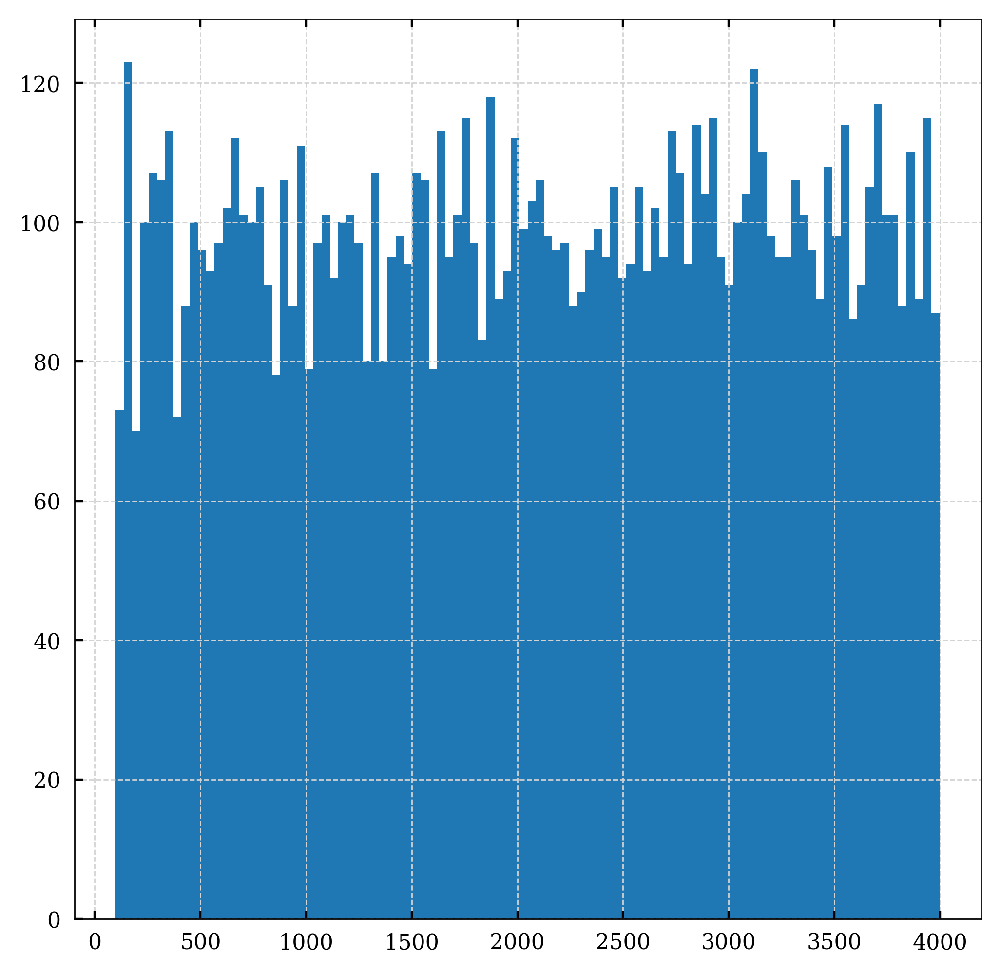

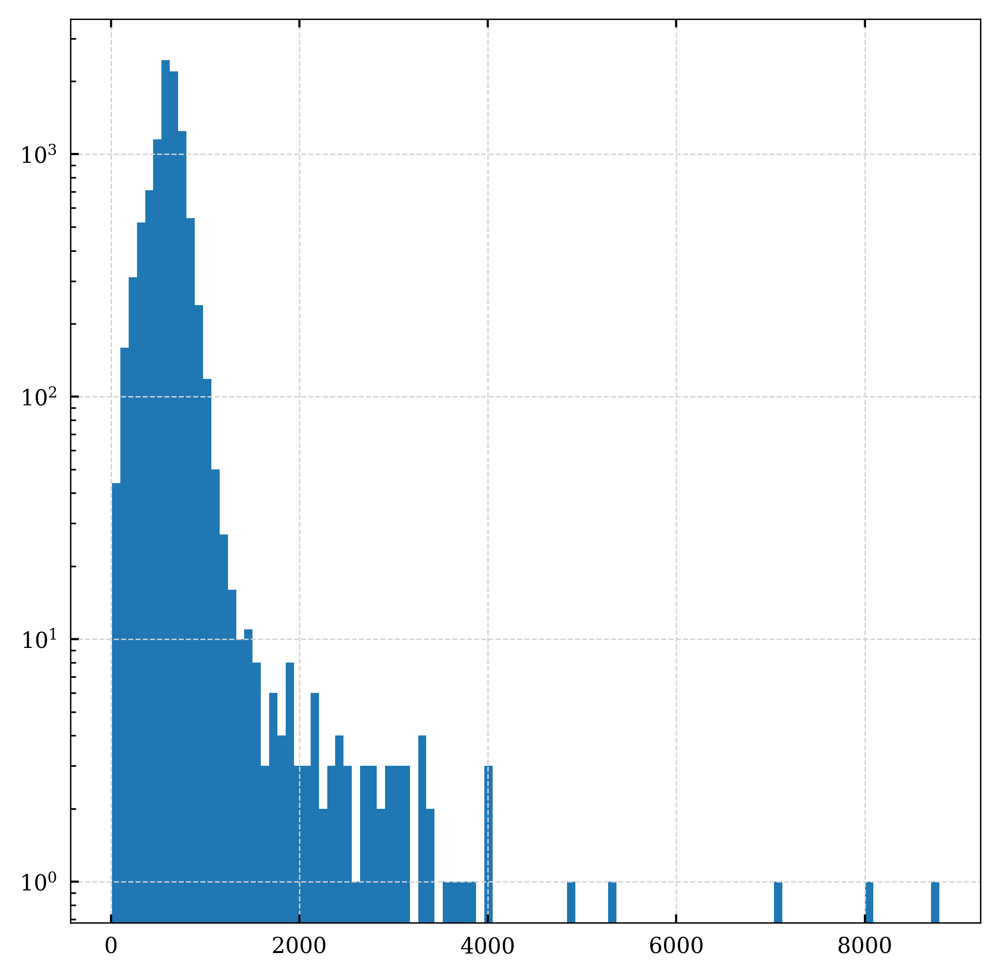

In [75]:
particles = pions
plt.hist(particles.get('PFTruthEcal_energy'))
plt.show()
plt.hist(particles.get('PFCandidates_ecalEnergy'))
plt.gca().set_yscale('log')
plt.show()

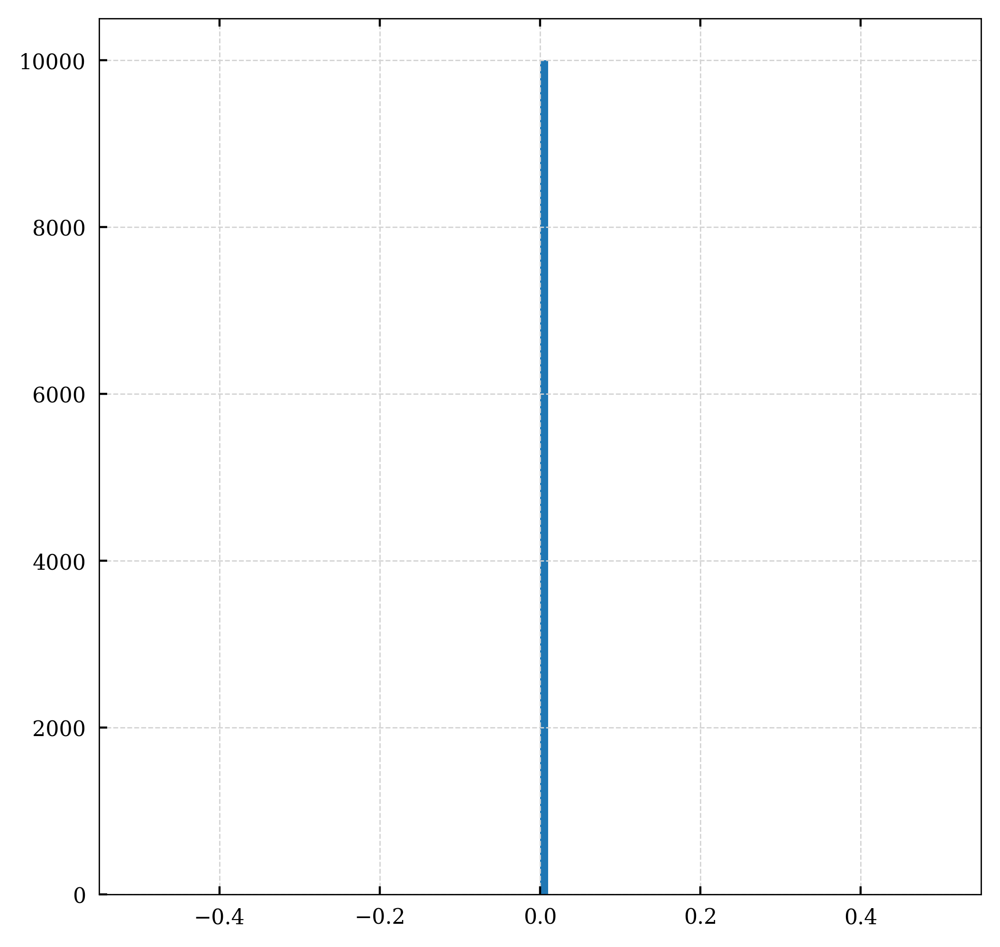

In [76]:
_ = plt.hist(protons_hcal.get('PFTruthTarget_energy'))

# Energy Resolution

## Reconstructed Energy Bins (old)

```
self.propdict['PFCandidates_ecalEnergy_o1corr'] = energy_o1corr_ecal
self.propdict['PFCandidates_hcalEnergy_o1corr'] = energy_o1corr_hcal
self.propdict['PFCandidates_energy_o1corr'] = energy_o1corr_total
```

In [77]:
def plot_erg_resolution(fig, ax, particles, marker='+', color='slateblue',
                        size=50, alpha=1, label='', dict_label=None):
    # bin the reconstructed energy
    _, ax_ = plt.subplots(figsize=(0, 0), dpi=200)
    bins, bins_avg, med, (XY_16, XY_84), (XY_05, XY_95) = \
    plotting.percentile(particles.get('PFCandidates_energy_o1corr'),
                        particles.get('PFCandidates_energy_o1corr'), color='red')
    ax_.set_visible(False)
    sigma = XY_84 - XY_16
    sigma_ = XY_95 - XY_05
    
    # make the scatter plot
    y = sigma/med
    yerr = np.array([[0] * len(y), [0] * len(y)])
    ax.scatter(x=np.array(bins_avg)/1e3, y=y, marker=marker, s=size, lw=2, alpha=alpha, color=color, label=label)
    if dict_label is not None:
        ax.set_xlabel(f'Reconstructed energy {labels_dict[dict_label]} [GeV]', fontsize=10)
        ax.set_ylabel(r'${\sigma_{\rm eff}(E_{\rm reco})} / {E_{\rm reco}}$', fontsize=10)
    ax.set_xlim([0, 4])
    ax.legend(fontsize=10)
    return sigma/med


full_particles_list = [
    electrons_hcal, electrons,
    photons_hcal, photons,
    neutrons_hcal, neutrons,
    pions_hcal, pions,
    protons_hcal, protons
]

def plot_reg_resolution_others(fig, ax, particles_list):
    other_particles_list = []
    for particles in full_particles_list:
        # add every particle not in the list to plot
        if particles not in particles_list:
            other_particles_list.append(particles)
    
    # label the first particle
    plot_erg_resolution(fig, ax, other_particles_list[0], marker='*', color='grey', size=20, alpha=0.3, label='Others')
    for particles in other_particles_list[1:]:
        plot_erg_resolution(fig, ax, particles, marker='*', color='grey', size=20, alpha=0.3)

(9881,) (9881,)
(9833,) (9833,)
(9999,) (9999,)
(9998,) (9998,)
(10000,) (10000,)
(10000,) (10000,)
(9965,) (9965,)
(9965,) (9965,)
(10000,) (10000,)
(10000,) (10000,)
(9378,) (9378,)
(9378,) (9378,)
(9999,) (9999,)
(9999,) (9999,)
(9873,) (9873,)
(9872,) (9872,)
(10000,) (10000,)
(9999,) (9999,)
(9902,) (9902,)
(9845,) (9845,)


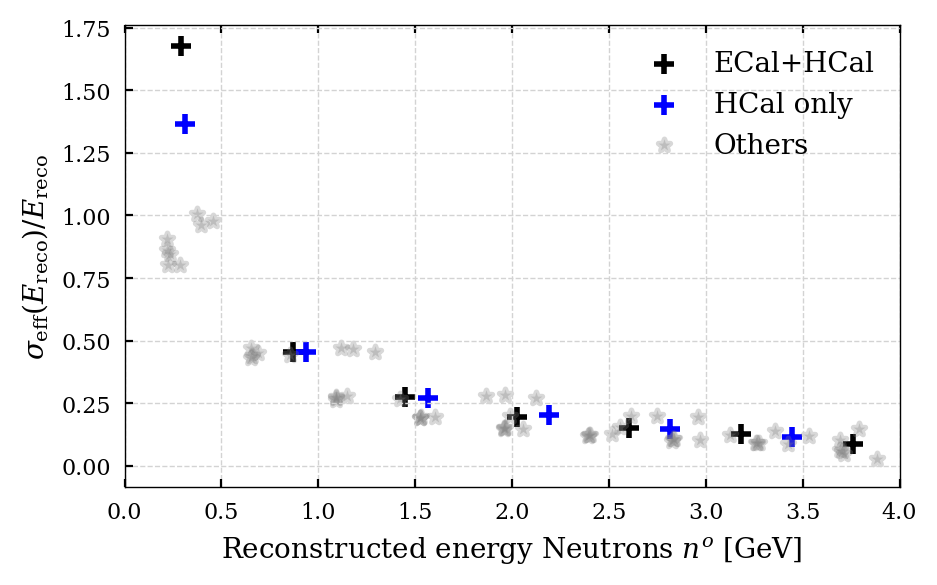

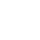

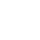

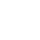

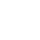

...

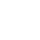

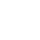

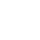

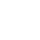

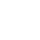

In [78]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
part_particles_list = [neutrons, neutrons_hcal]
plot_erg_resolution(fig, ax, part_particles_list[0], color='black', label='ECal+HCal', dict_label='neutron')
plot_erg_resolution(fig, ax, part_particles_list[1], color='blue', label='HCal only')
plot_reg_resolution_others(fig, ax, part_particles_list)
plt.show()

(9965,) (9965,)
(9965,) (9965,)
(10000,) (10000,)
(10000,) (10000,)
(10000,) (10000,)
(10000,) (10000,)
(9378,) (9378,)
(9378,) (9378,)
(9999,) (9999,)
(9998,) (9998,)
(9881,) (9881,)
(9833,) (9833,)
(9999,) (9999,)
(9999,) (9999,)
(9873,) (9873,)
(9872,) (9872,)
(10000,) (10000,)
(9999,) (9999,)
(9902,) (9902,)
(9845,) (9845,)


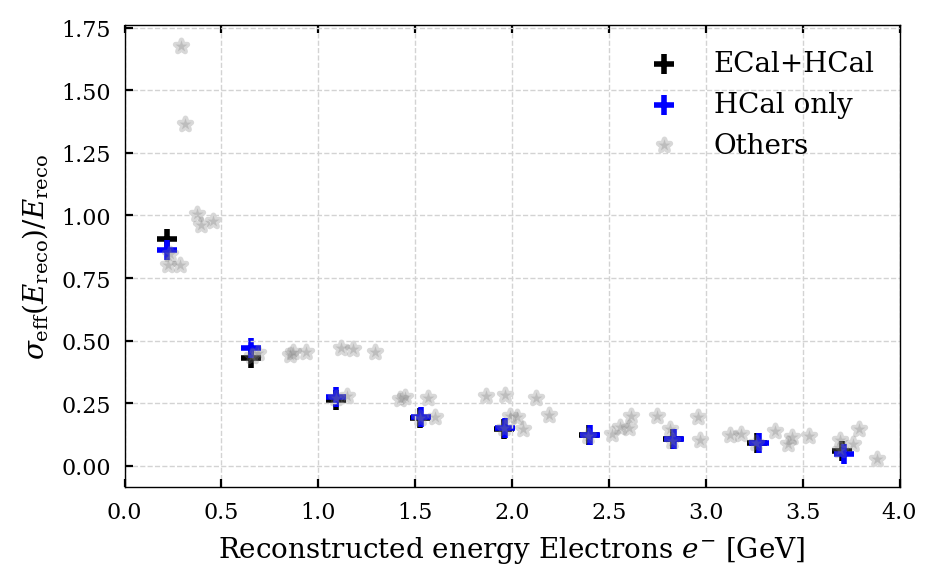

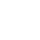

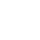

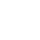

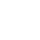

...

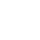

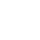

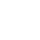

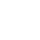

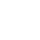

In [79]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
part_particles_list = [electrons, electrons_hcal]
plot_erg_resolution(fig, ax, part_particles_list[0], color='black', label='ECal+HCal', dict_label='electron')
plot_erg_resolution(fig, ax, part_particles_list[1], color='blue', label='HCal only')
plot_reg_resolution_others(fig, ax, part_particles_list)
plt.show()

(9378,) (9378,)
(9378,) (9378,)
(10000,) (10000,)
(10000,) (10000,)
(10000,) (10000,)
(10000,) (10000,)
(9965,) (9965,)
(9965,) (9965,)
(9999,) (9999,)
(9998,) (9998,)
(9881,) (9881,)
(9833,) (9833,)
(9999,) (9999,)
(9999,) (9999,)
(9873,) (9873,)
(9872,) (9872,)
(10000,) (10000,)
(9999,) (9999,)
(9902,) (9902,)
(9845,) (9845,)


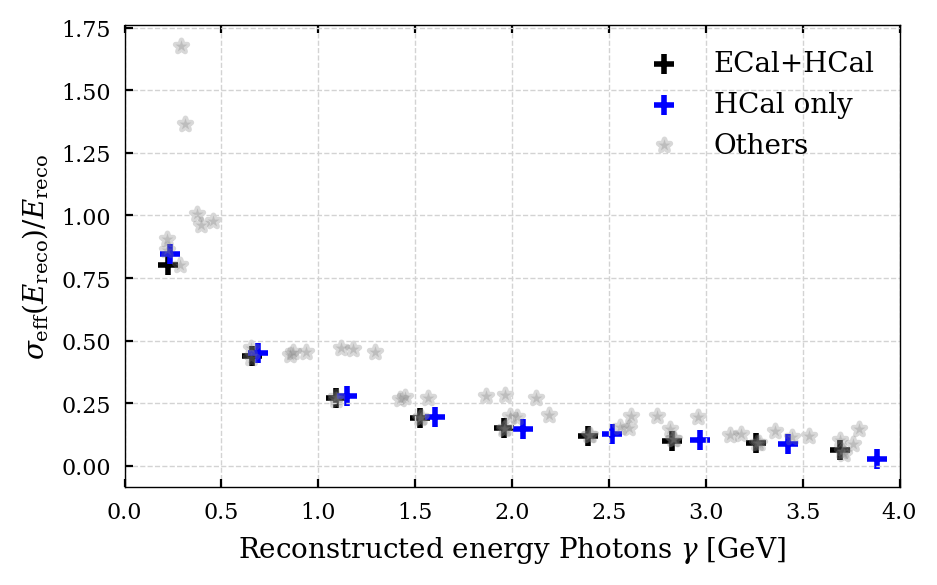

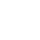

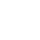

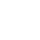

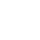

...

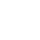

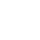

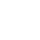

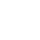

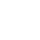

In [80]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
part_particles_list = [photons, photons_hcal]
plot_erg_resolution(fig, ax, part_particles_list[0], color='black', label='ECal+HCal', dict_label='photon')
plot_erg_resolution(fig, ax, part_particles_list[1], color='blue', label='HCal only')
plot_reg_resolution_others(fig, ax, part_particles_list)
plt.show()

(9873,) (9873,)
(9872,) (9872,)
(9999,) (9999,)
(9999,) (9999,)
(10000,) (10000,)
(10000,) (10000,)
(9965,) (9965,)
(9965,) (9965,)
(10000,) (10000,)
(10000,) (10000,)
(9378,) (9378,)
(9378,) (9378,)
(9999,) (9999,)
(9998,) (9998,)
(9881,) (9881,)
(9833,) (9833,)
(10000,) (10000,)
(9999,) (9999,)
(9902,) (9902,)
(9845,) (9845,)


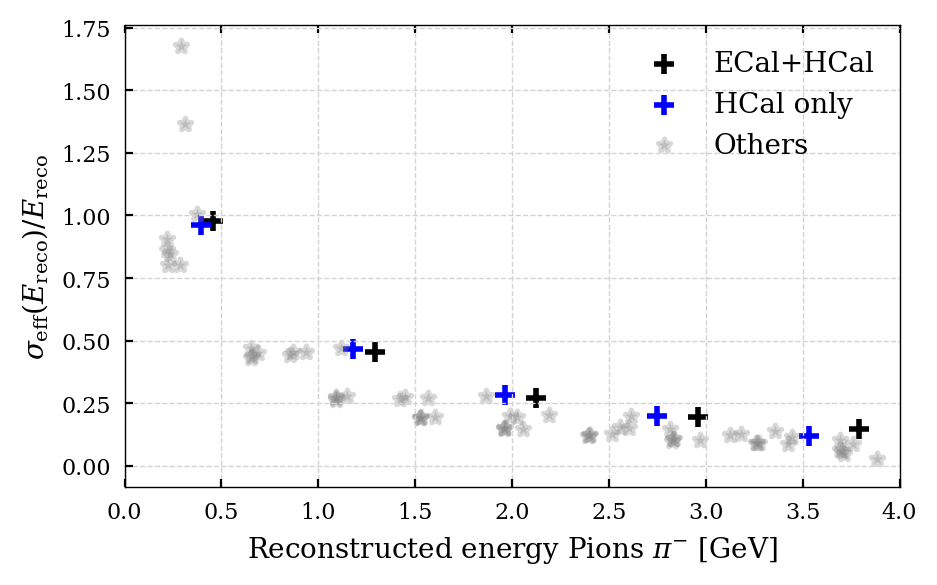

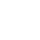

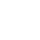

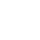

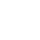

...

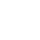

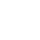

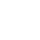

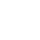

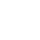

In [81]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
part_particles_list = [pions, pions_hcal]
plot_erg_resolution(fig, ax, part_particles_list[0], color='black', label='ECal+HCal', dict_label='pion')
plot_erg_resolution(fig, ax, part_particles_list[1], color='blue', label='HCal only')
plot_reg_resolution_others(fig, ax, part_particles_list)
plt.show()

(9902,) (9902,)
(9845,) (9845,)
(10000,) (10000,)
(9999,) (9999,)
(10000,) (10000,)
(10000,) (10000,)
(9965,) (9965,)
(9965,) (9965,)
(10000,) (10000,)
(10000,) (10000,)
(9378,) (9378,)
(9378,) (9378,)
(9999,) (9999,)
(9998,) (9998,)
(9881,) (9881,)
(9833,) (9833,)
(9999,) (9999,)
(9999,) (9999,)
(9873,) (9873,)
(9872,) (9872,)


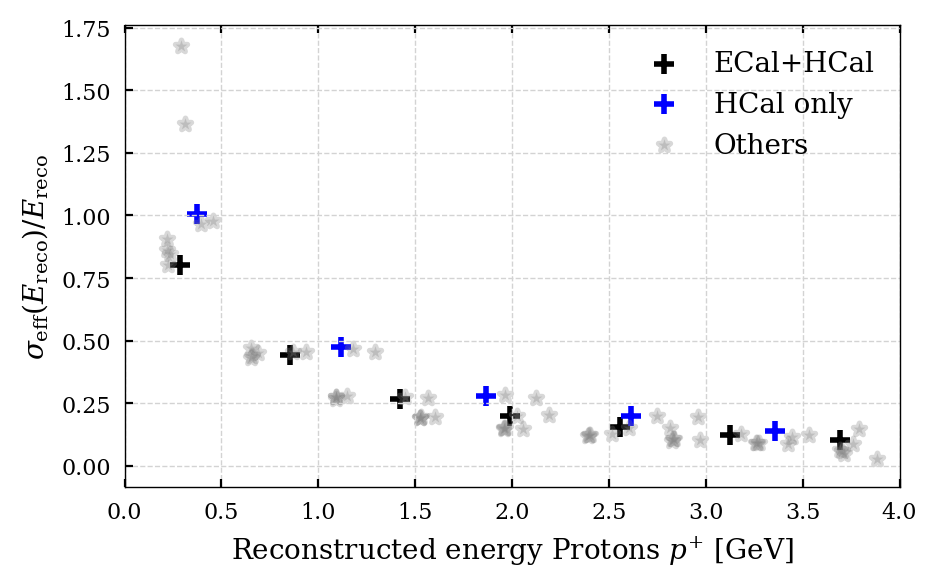

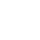

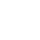

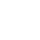

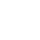

...

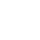

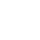

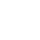

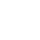

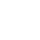

In [82]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
part_particles_list = [protons, protons_hcal]
plot_erg_resolution(fig, ax, part_particles_list[0], color='black', label='ECal+HCal', dict_label='proton')
plot_erg_resolution(fig, ax, part_particles_list[1], color='blue', label='HCal only')
plot_reg_resolution_others(fig, ax, part_particles_list)
plt.show()

## Truth Energy Bins

In [83]:
# bin the reconstructed energy data by truth energy
# plot by mean reconstructed energy

def plot_erg_resolution(fig, ax, particles, marker='+', color='slateblue', bin_num=20,
                        size=50, alpha=1, label='', dict_label=None, verbose=True):
    import scipy.stats as stats
    
    # the two energies
    erg_truth = particles.get('PFTruthEcal_energy') + particles.get('PFTruthHcal_energy')
    erg_recon = particles.get('PFCandidates_energy_o1corr')
    # filter outliers
    erg_truth, erg_recon = plotting._clean_data(erg_truth, erg_recon)
    #(erg_truth, erg_recon), (_, _) = plotting.outlier_IQR(erg_truth, erg_recon)
    
    # bin the reconstructed energy by truth energy
    bin_min = 0
    bin_max = np.nanmax(erg_truth) if np.nanmax(erg_truth) < 4e3 else 4e3
    truth_bins = np.linspace(bin_min, bin_max, bin_num)  # bins
    
    # define percentile functions
    def _16(arr): return np.quantile(arr, .159) # sigma CI
    def _84(arr): return np.quantile(arr, .841)
    recon_med = stats.binned_statistic(erg_truth, erg_recon, statistic=np.median, bins=truth_bins)[0]  # median
    recon_mean = stats.binned_statistic(erg_truth, erg_recon, statistic=np.mean, bins=truth_bins)[0]  # mean
    # bin the reconstructed energies
    recon_16 = stats.binned_statistic(erg_truth, erg_recon, statistic=_16, bins=truth_bins)[0]  # percentiles
    recon_84 = stats.binned_statistic(erg_truth, erg_recon, statistic=_84, bins=truth_bins)[0]
    truth_bins_avg = [(a + b) / 2 for a, b in zip(truth_bins[::], truth_bins[1::])]  # average of two consecutive elements in bins
    
    # sigma value
    recon_sigma = recon_84 - recon_16
    recon_sigma = np.mean([recon_84 - recon_med, recon_med - recon_16], axis=0)
    
    # plot the binned distributions
    if verbose and dict_label is not None:
        _, ax_ = plt.subplots(figsize=(5, 3), dpi=200)
        # scatter if smaller than bin size
        truth_hist, truth_edges = np.histogram(erg_truth, bins=truth_bins) # histogram of data
        truth_bin_size = truth_edges[1] - truth_edges[0]
        
        # sort both with the same index
        truth_sortind = np.argsort(erg_truth).astype(int)
        truth_sort = np.array(erg_truth)[truth_sortind]
        recon_sort = np.array(erg_recon)[truth_sortind]
        
        bin_num = 0 # index of x and y to scatter
        for i, truth_bin in enumerate(truth_hist):
            # get the values within the bin
            x_bin = truth_sort[bin_num: bin_num+truth_bin]
            y_bin = recon_sort[bin_num: bin_num+truth_bin]
            
            # plot the at the average of the bin
#             x_med = np.median(x_bin)  # median of truth
#             x_med = np.array(truth_bins_avg)[i]  # bin location of truth
            x_med = recon_med[i]  # median of reconstructed
    
#             print((np.quantile(y_bin, .841) - np.median(y_bin))/x_med)
            ax_.boxplot([y_bin/1e3], positions=[x_med/1e3], vert=True, labels=[i],
                        showmeans=True, meanline=True, showfliers=False, notch=True, bootstrap=1000)
            xlim = [0, 4]
            ax_.set_xlim(xlim)
            ax_.set_xticks(np.arange(xlim[0], xlim[1]+0.5, 0.5), np.arange(xlim[0], xlim[1]+0.5, 0.5))
            ax_.set_ylim([0, 6])
            
            # add the number of elements in this bin
            bin_num += truth_bin
        
        ax_.annotate(text=labels_dict[dict_label], xy=(-50, -30), xycoords='axes points', fontsize=10, weight='bold')
        ax_.set_xlabel(f'Reconstructed energy bins', fontsize=10)
        ax_.set_ylabel(f'Reconstructed energies [GeV]', fontsize=10)
    
    # make the scatter plot
#     x = np.array(truth_bins_avg)/1e3  # truth
    x = np.array(recon_med)/1e3  # reconstructed
    y = recon_sigma/recon_med
    ax.scatter(x=x, y=y, marker=marker, s=size, lw=2, alpha=alpha, color=color, label=label)
    if dict_label is not None:
        ax.annotate(text=labels_dict[dict_label], xy=(-50, -30), xycoords='axes points', fontsize=10, weight='bold')
        ax.set_xlabel('Reconstructed energy [GeV]', fontsize=10)
        ax.set_ylabel(r'${\sigma_{\rm eff}(E_{\rm reco})} / {E_{\rm reco}}$', fontsize=10)
    ax.set_xlim([0, 4])
    ax.legend(fontsize=10)
    return y


full_particles_list = [
    electrons_hcal, electrons,
    photons_hcal, photons,
    neutrons_hcal, neutrons,
    pions_hcal, pions,
    protons_hcal, protons
]

def plot_reg_resolution_others(fig, ax, particles_list):
    other_particles_list = []
    for particles in full_particles_list:
        # add every particle not in the list to plot
        if particles not in particles_list:
            other_particles_list.append(particles)
    
    # label the first particle
    plot_erg_resolution(fig, ax, other_particles_list[0], marker='*', color='grey', size=20, alpha=0.3, verbose=False, label='Others')
    for particles in other_particles_list[1:]:
        plot_erg_resolution(fig, ax, particles, marker='*', color='grey', size=20, verbose=False, alpha=0.3)

### Neutrons

In [84]:
_ = neutrons.list_props()

Property Name                 Number of Entries   Unique Entries      Range                         Mean
PFCandidates_ecalClusterDXDZ  9881                7312                -0.52         0.57            0.00
PFCandidates_ecalClusterDYDZ  9881                7314                -0.54         0.50            0.00
PFCandidates_ecalClusterEDXDZ 9881                7313                0.00          0.19            0.00
PFCandidates_ecalClusterEDYDZ 9881                7315                0.00          0.15            0.00
PFCandidates_ecalClusterEX    9881                7514                0.00        161.13            27.74
PFCandidates_ecalClusterEY    9881                7433                0.00        161.46            27.69
PFCandidates_ecalClusterEZ    9881                7006                0.00        218.70            45.73
PFCandidates_ecalClusterX     9881                7583                -253.37     257.58            1.29
PFCandidates_ecalClusterY     9881                71

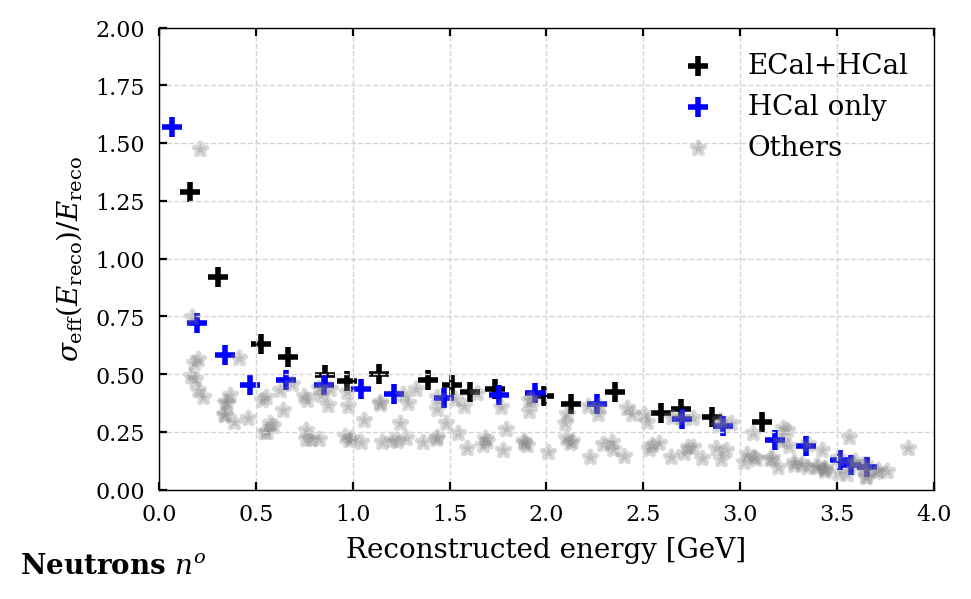

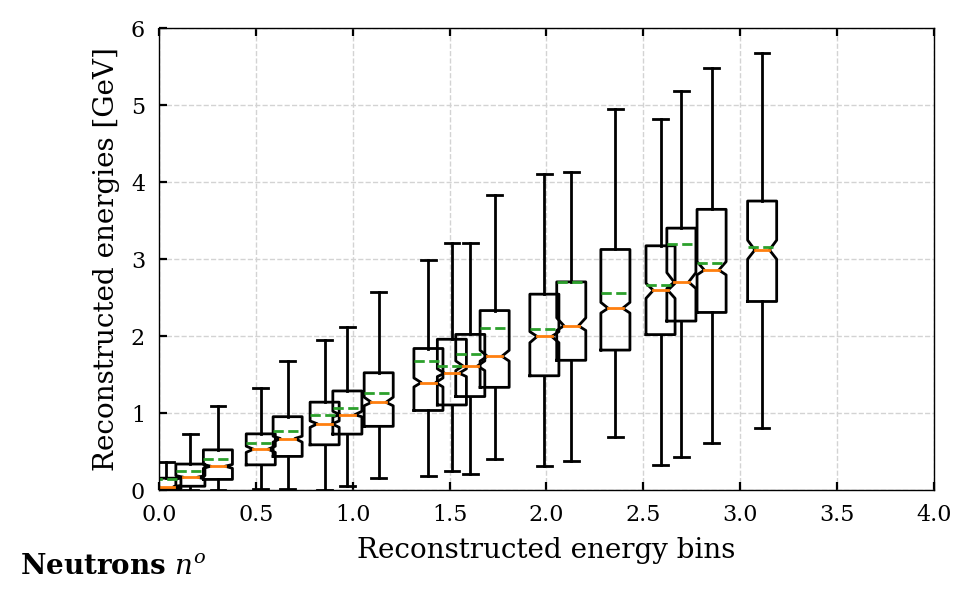

In [109]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
part_particles_list = [neutrons, neutrons_hcal]
plot_erg_resolution(fig, ax, part_particles_list[0], color='black', label='ECal+HCal', dict_label='neutron')
plot_erg_resolution(fig, ax, part_particles_list[1], color='blue', label='HCal only')
ax.set_ylim(0, 2)
ax.set_xlim(0, 2)
plot_reg_resolution_others(fig, ax, part_particles_list)
plt.show()

### Electrons

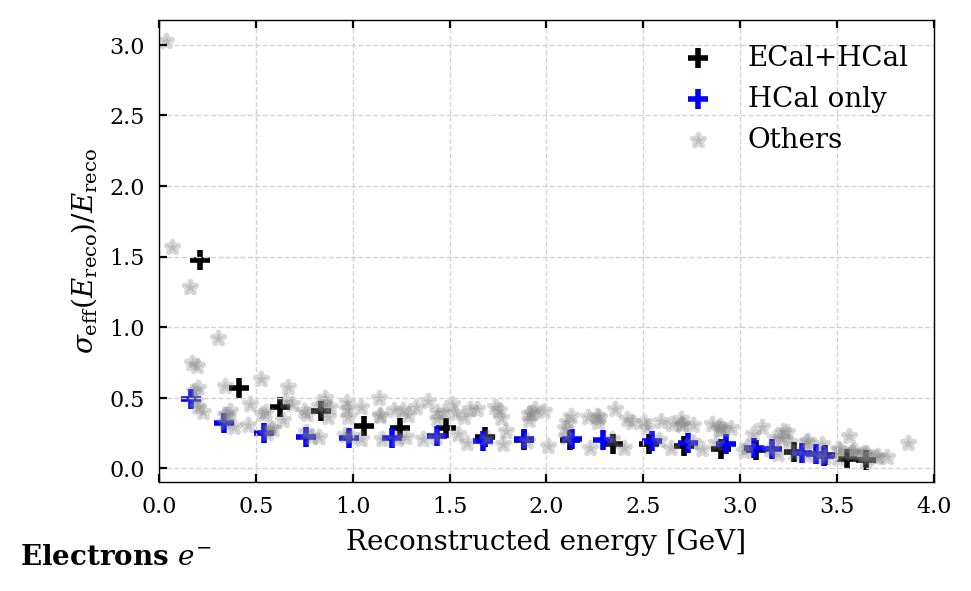

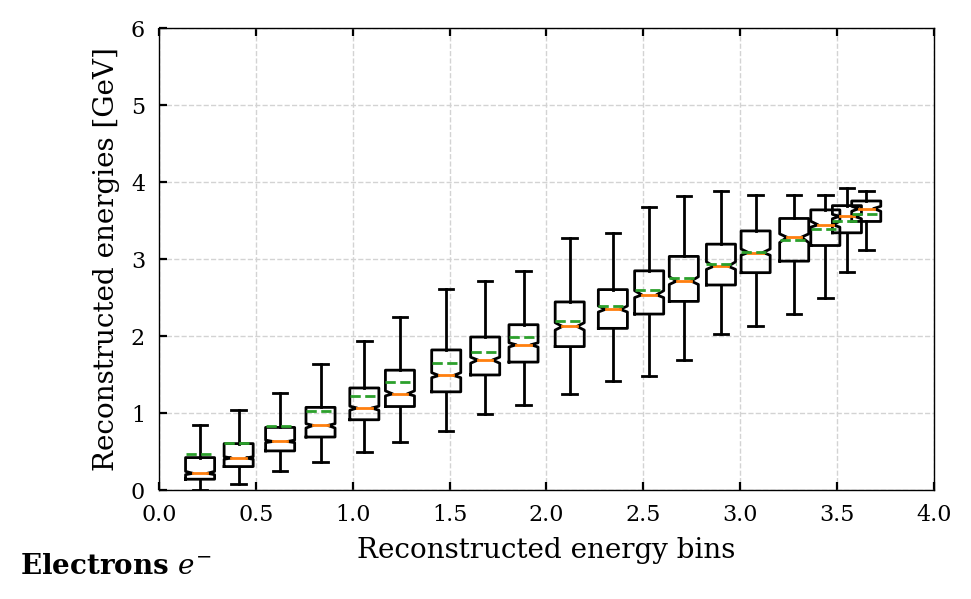

In [86]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
part_particles_list = [electrons, electrons_hcal]
plot_erg_resolution(fig, ax, part_particles_list[0], color='black', label='ECal+HCal', dict_label='electron')
plot_erg_resolution(fig, ax, part_particles_list[1], color='blue', label='HCal only')
plot_reg_resolution_others(fig, ax, part_particles_list)
plt.show()

### Photons

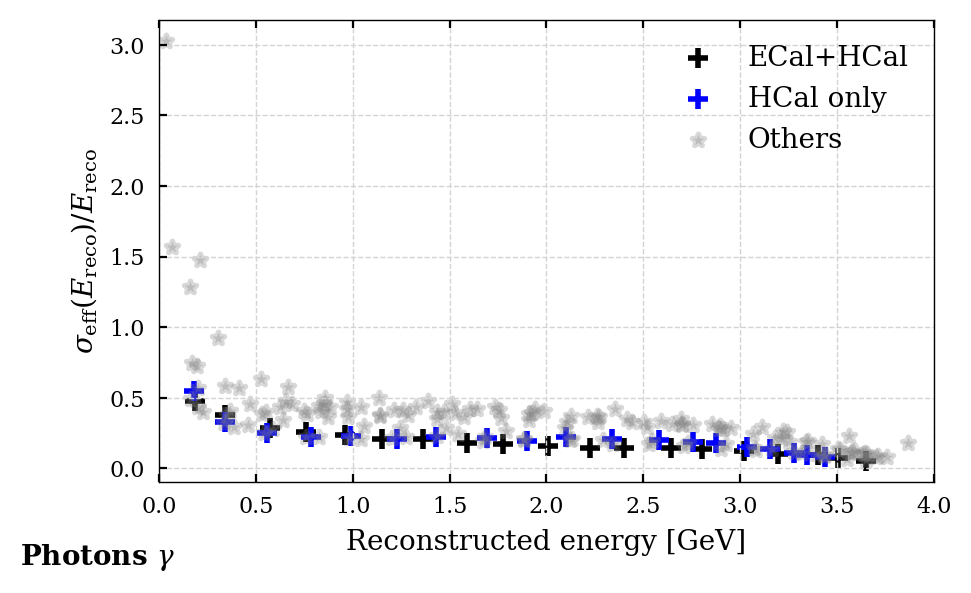

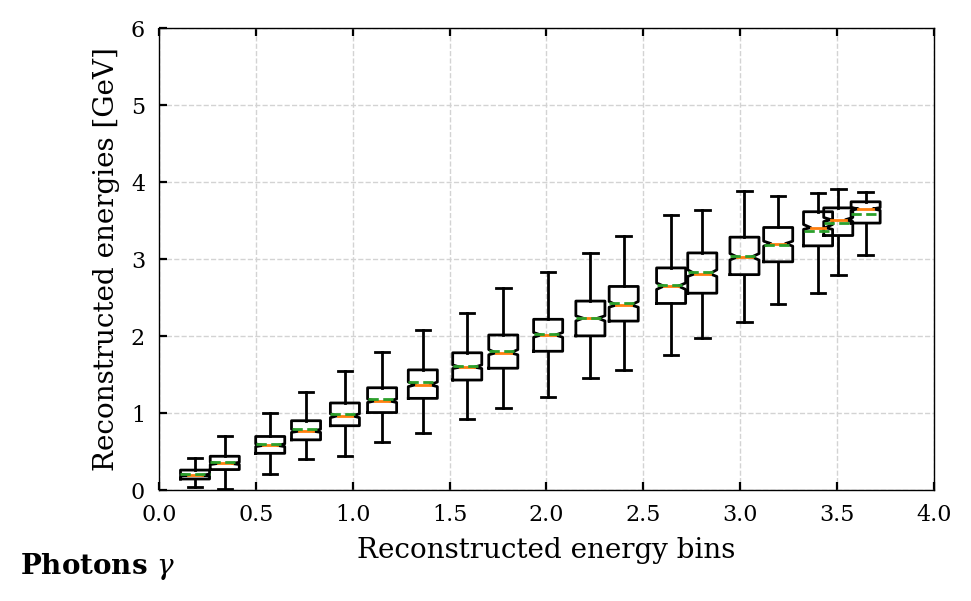

In [87]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
part_particles_list = [photons, photons_hcal]
plot_erg_resolution(fig, ax, part_particles_list[0], color='black', label='ECal+HCal', dict_label='photon')
plot_erg_resolution(fig, ax, part_particles_list[1], color='blue', label='HCal only')
plot_reg_resolution_others(fig, ax, part_particles_list)
plt.show()

### Pions

Testing

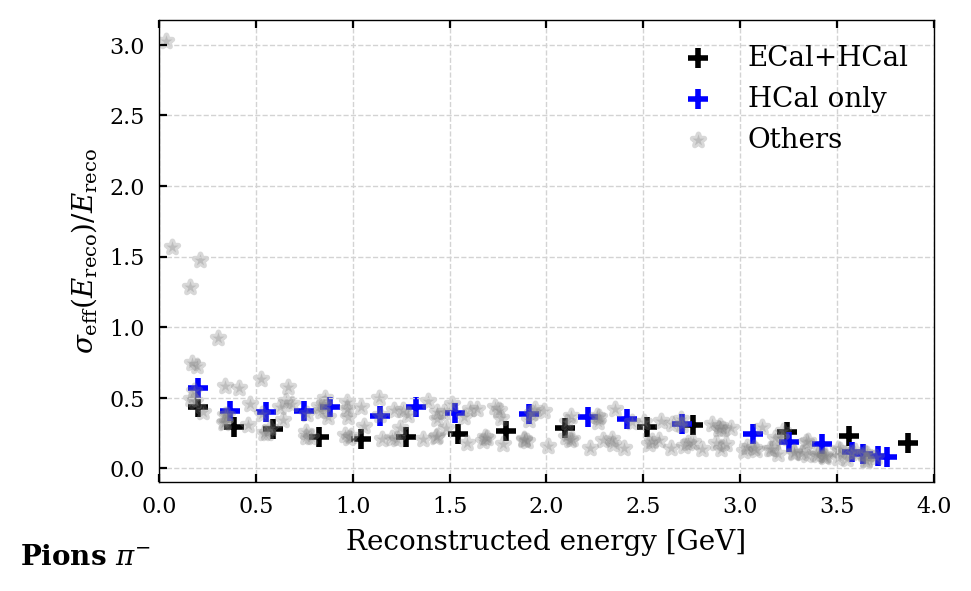

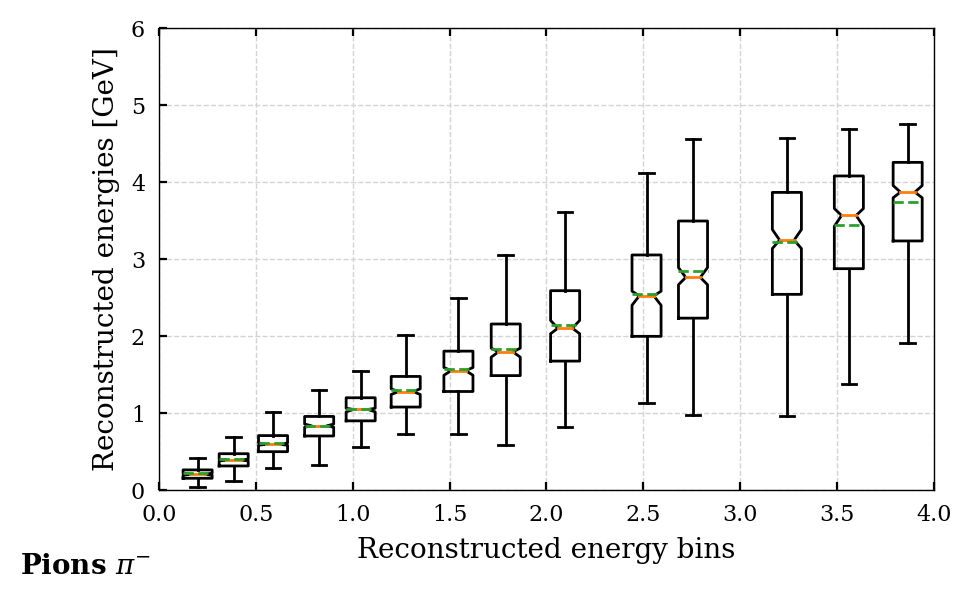

In [88]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
part_particles_list = [pions, pions_hcal]
plot_erg_resolution(fig, ax, part_particles_list[0], color='black', label='ECal+HCal', dict_label='pion')
plot_erg_resolution(fig, ax, part_particles_list[1], color='blue', label='HCal only')
plot_reg_resolution_others(fig, ax, part_particles_list)
plt.show()

### Protons

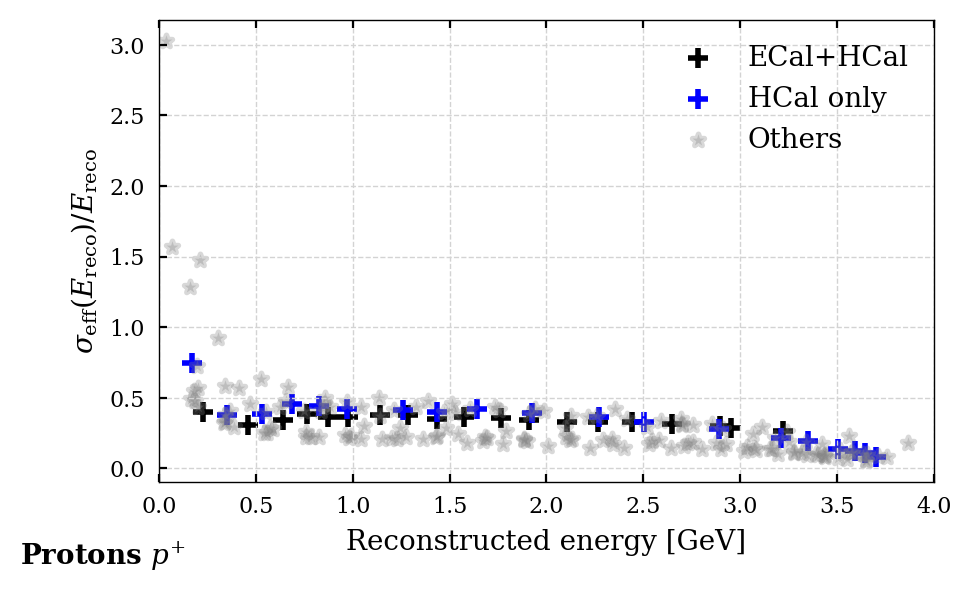

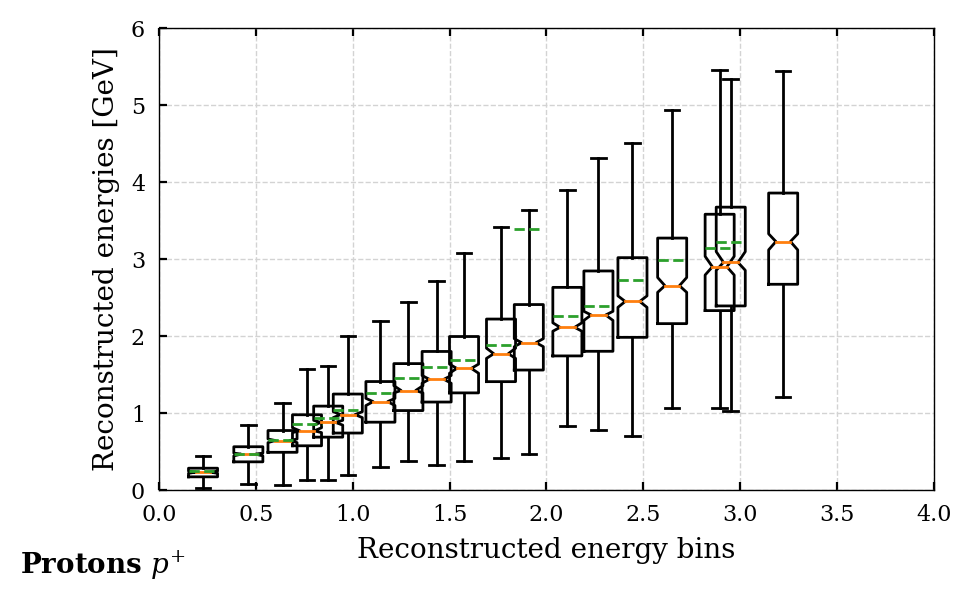

In [89]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
part_particles_list = [protons, protons_hcal]
plot_erg_resolution(fig, ax, part_particles_list[0], color='black', label='ECal+HCal', dict_label='proton')
plot_erg_resolution(fig, ax, part_particles_list[1], color='blue', label='HCal only')
plot_reg_resolution_others(fig, ax, part_particles_list)
plt.show()

## Energy Resolution Comparison

Protons, 3-4 GeV truth energy, energies ecal, hcal, and total

In [90]:
def plot_erg_dist(part, binwidth=0.1, dict_label=None, erg_min=0, erg_max=4, xlim=[0, 5], ylim=[0, 100]):
    import seaborn as sns
    from codes import jason_plotting as plotting
    
    # define the energies
    tot_erg = part.get('PFTruthHcal_energy') + part.get('PFTruthEcal_energy')
    erg_mask = np.logical_and(tot_erg/1e3 > erg_min,
                              tot_erg/1e3 < erg_max)
    ecal = part.get('PFCandidates_ecalEnergy_o1corr')[erg_mask]/1e3
    hcal = part.get('PFCandidates_hcalEnergy_o1corr')[erg_mask]/1e3
    total = part.get('PFCandidates_energy_o1corr')[erg_mask]/1e3
    
    fig, ax = plt.subplots(figsize=(5, 2), dpi=200)
    plotting.hist(fig, ax, data=[ecal, hcal, total],
                  labels=['ECal', 'HCal', 'Total'], xlim=xlim, ylim=ylim, binwidth=binwidth,
                  draw_median=True, draw_quartiles=True,
                  xlabel='Calibrated Energy [GeV]', ylabel='Density')
    ax.set_title(f'Truth energy between {erg_min} and {erg_max} GeV')
    if dict_label is not None:
        ax.annotate(text=labels_dict[dict_label], xy=(-50, -30), xycoords='axes points', fontsize=10, weight='bold')
    ax.legend()
    plt.show()

### Pions

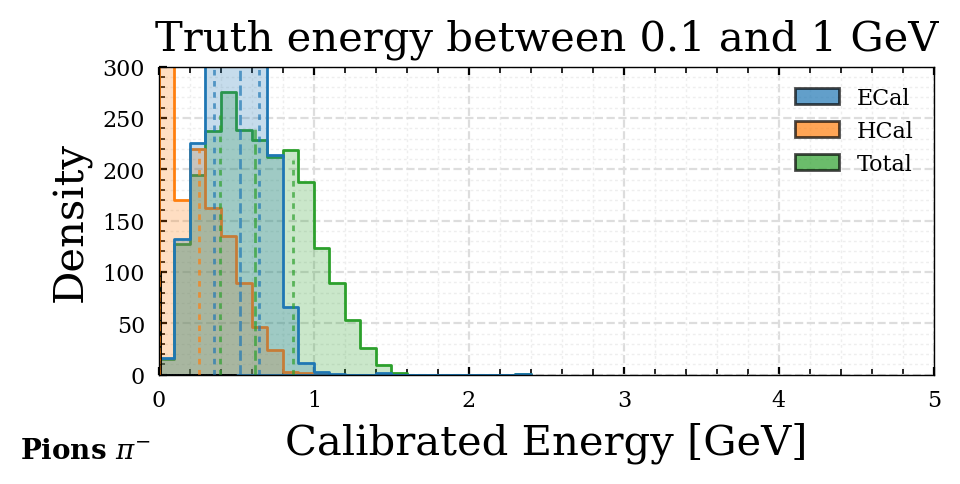

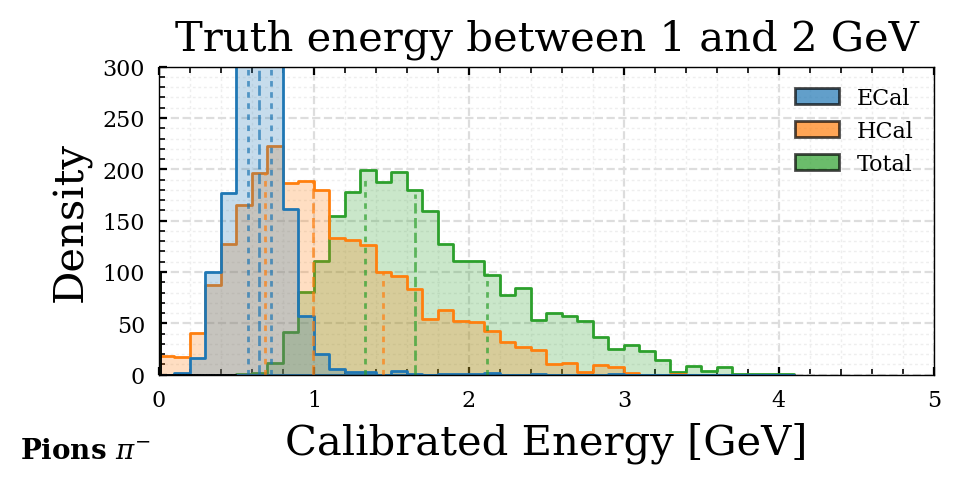

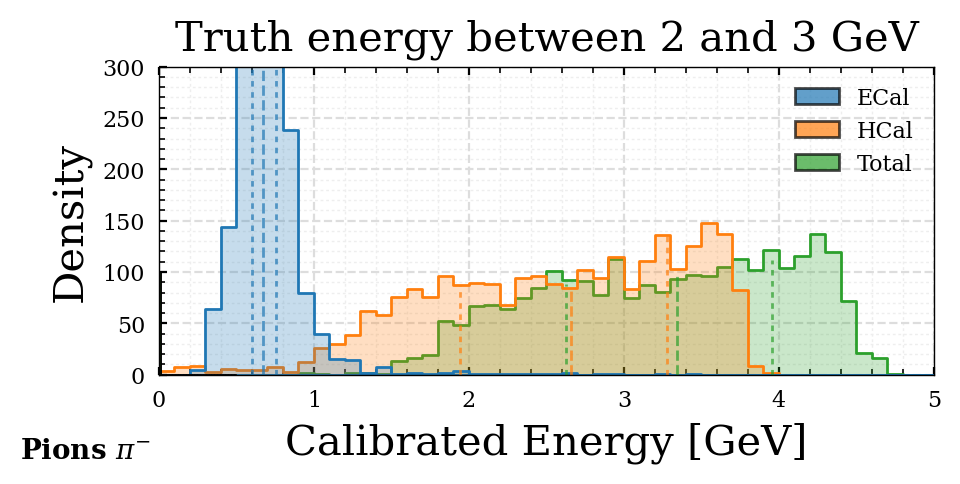

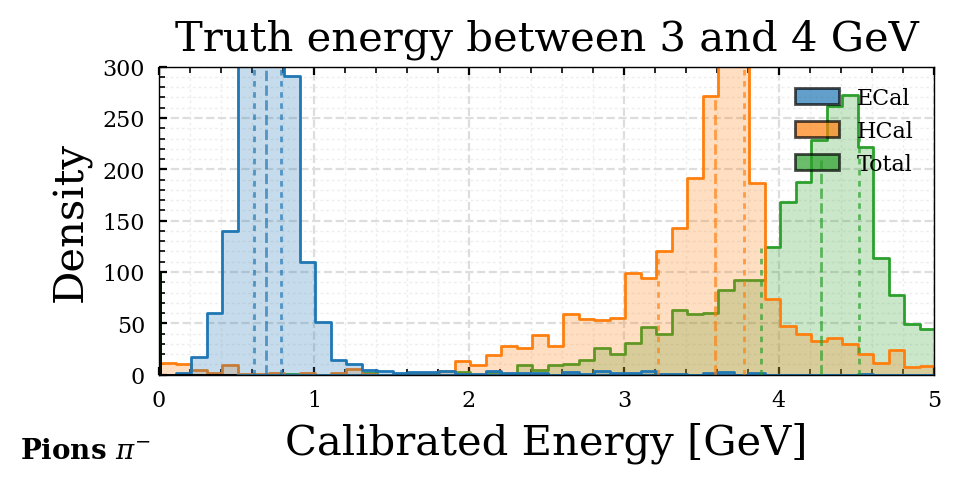

In [91]:
plot_erg_dist(pions, 0.1, 'pion', 0.1, 1, ylim=[0, 300])
plot_erg_dist(pions, 0.1, 'pion', 1, 2, ylim=[0, 300])
plot_erg_dist(pions, 0.1, 'pion', 2, 3, ylim=[0, 300])
plot_erg_dist(pions, 0.1, 'pion', 3, 4, ylim=[0, 300])

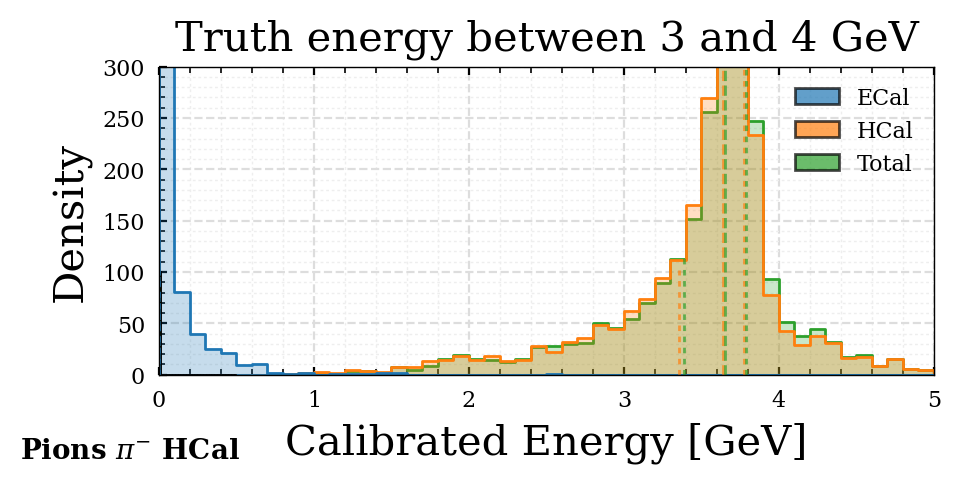

In [92]:
plot_erg_dist(pions_hcal, 0.1, 'pion_hcal', 3, 4, ylim=[0, 300])

### Protons

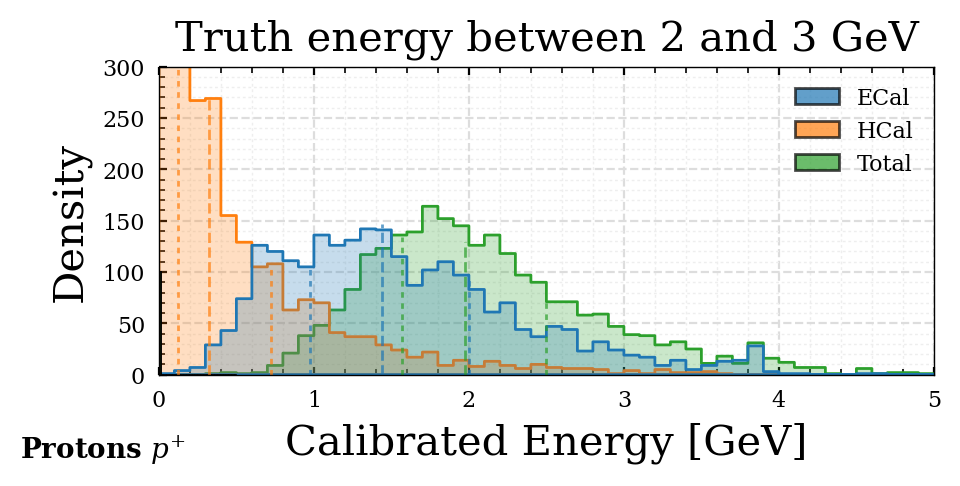

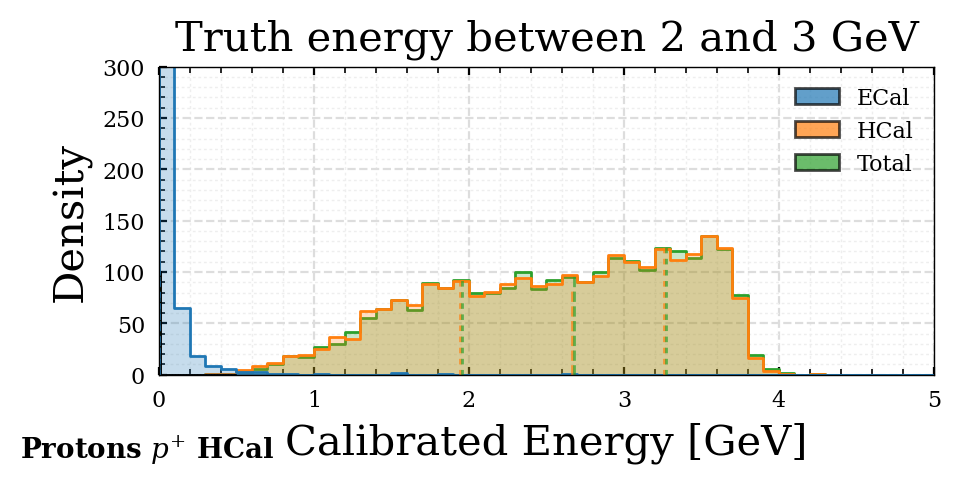

In [93]:
plot_erg_dist(protons, 0.1, 'proton', 2, 3, ylim=[0, 300])
plot_erg_dist(protons_hcal, 0.1, 'proton_hcal', 2, 3, ylim=[0, 300])

### Electrons

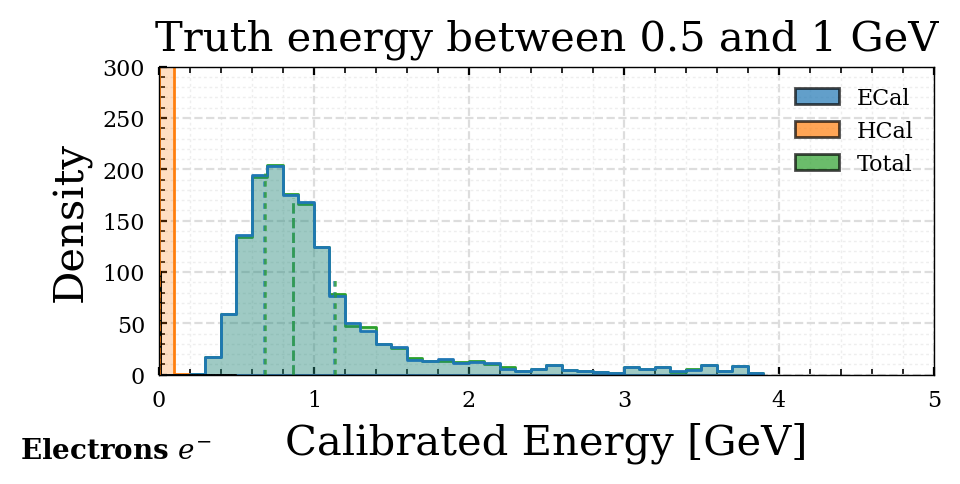

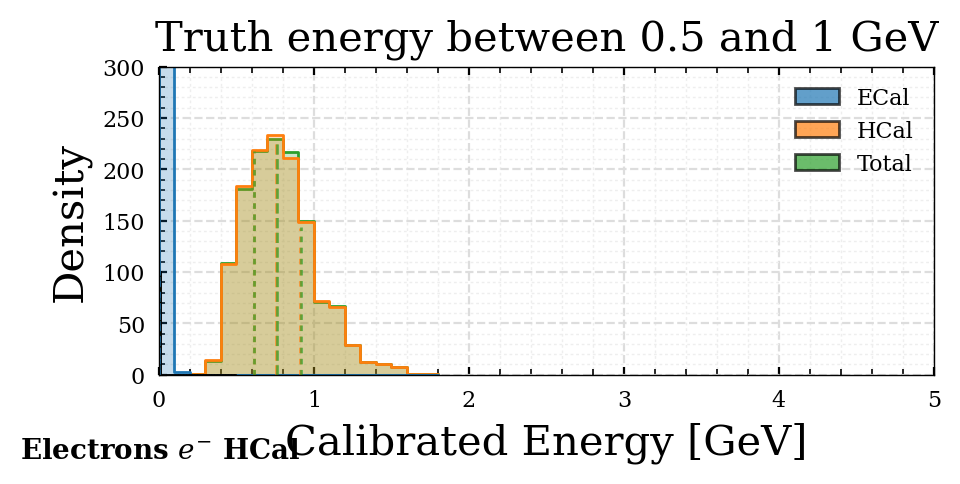

In [94]:
plot_erg_dist(electrons, 0.1, 'electron', 0.5, 1, ylim=[0, 300])
plot_erg_dist(electrons_hcal, 0.1, 'electron_hcal', 0.5, 1, ylim=[0, 300])

### Energy makeups

#### Protons: spread at high ecal

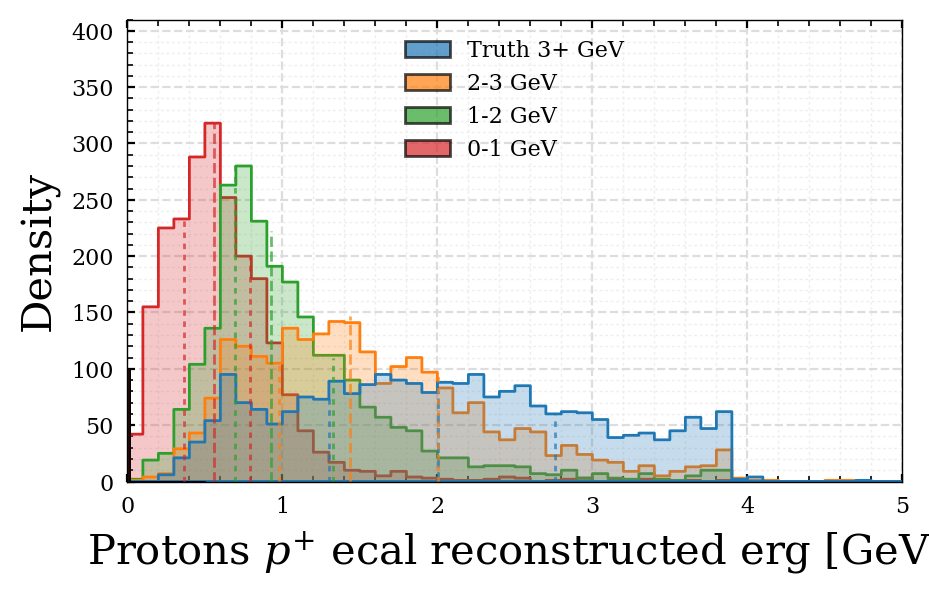

In [95]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
def part_comp(part, erg_low=0, erg_high=4):
    return np.logical_and((part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 > erg_low,
                          (part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 < erg_high)
quant = [
    protons.get('PFCandidates_ecalEnergy_o1corr')[part_comp(protons, 3, 4)]/1e3,
    protons.get('PFCandidates_ecalEnergy_o1corr')[part_comp(protons, 2, 3)]/1e3,
    protons.get('PFCandidates_ecalEnergy_o1corr')[part_comp(protons, 1, 2)]/1e3,
    protons.get('PFCandidates_ecalEnergy_o1corr')[part_comp(protons, 0, 1)]/1e3
]
labels = ['Truth 3+ GeV', '2-3 GeV', '1-2 GeV', '0-1 GeV']
plotting.hist(fig, ax, quant, labels, binwidth=0.1,
              xlim=[0, 5], ylim=[0, 410],
              draw_median=True, draw_quartiles=True,
              xlabel=f'{labels_dict["proton"]} ecal reconstructed erg [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.legend(loc='upper center')
plt.show()

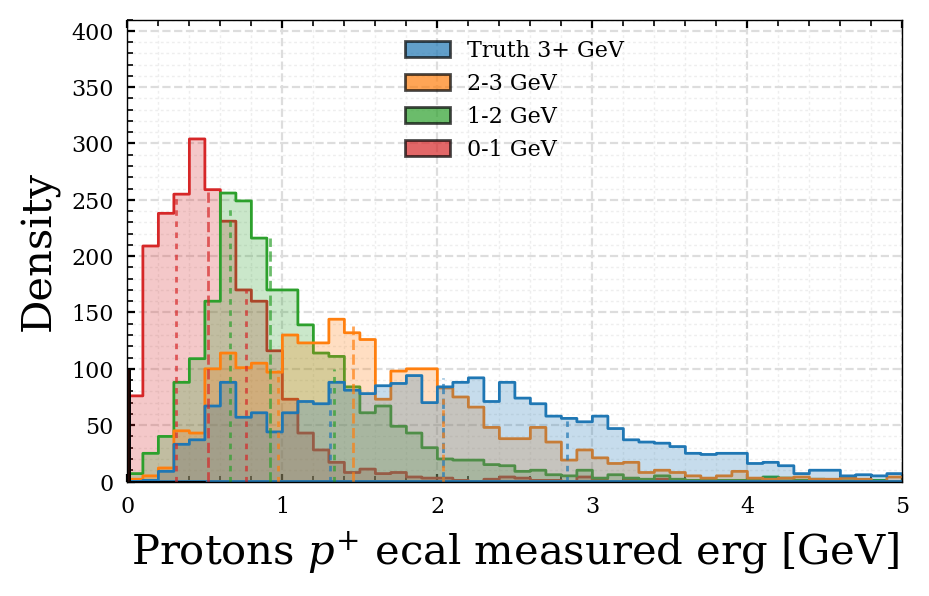

In [96]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
def part_comp(part, erg_low=0, erg_high=4):
    return np.logical_and((part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 > erg_low,
                          (part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 < erg_high)
quant = [
    protons.get('PFCandidates_ecalEnergy')[part_comp(protons, 3, 4)]/1e3,
    protons.get('PFCandidates_ecalEnergy')[part_comp(protons, 2, 3)]/1e3,
    protons.get('PFCandidates_ecalEnergy')[part_comp(protons, 1, 2)]/1e3,
    protons.get('PFCandidates_ecalEnergy')[part_comp(protons, 0, 1)]/1e3
]
labels = ['Truth 3+ GeV', '2-3 GeV', '1-2 GeV', '0-1 GeV']
plotting.hist(fig, ax, quant, labels, binwidth=0.1,
              xlim=[0, 5], ylim=[0, 410],
              draw_median=True, draw_quartiles=True,
              xlabel=f'{labels_dict["proton"]} ecal measured erg [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.legend(loc='upper center')
plt.show()

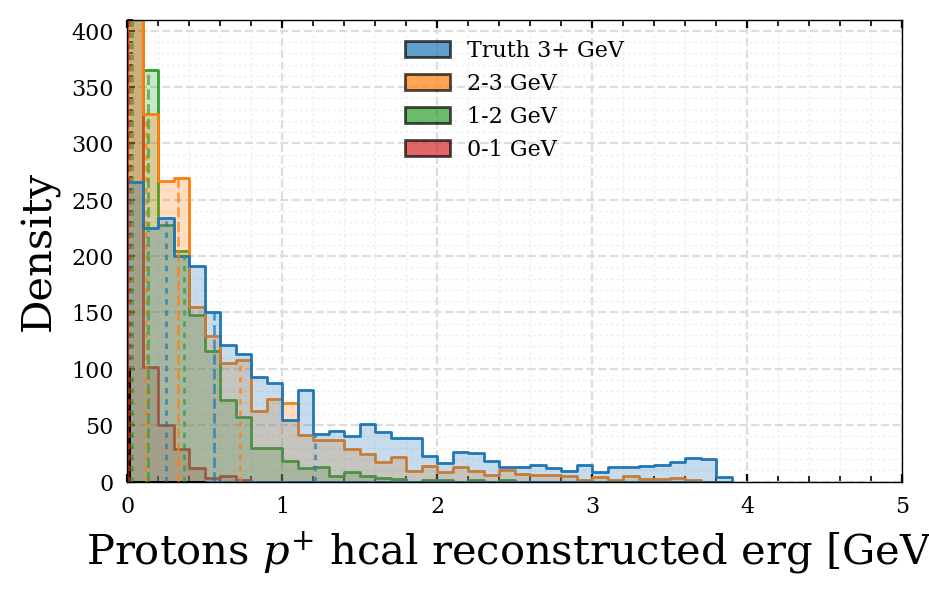

In [97]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
def part_comp(part, erg_low=0, erg_high=4):
    return np.logical_and((part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 > erg_low,
                          (part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 < erg_high)
quant = [
    protons.get('PFCandidates_hcalEnergy_o1corr')[part_comp(protons, 3, 4)]/1e3,
    protons.get('PFCandidates_hcalEnergy_o1corr')[part_comp(protons, 2, 3)]/1e3,
    protons.get('PFCandidates_hcalEnergy_o1corr')[part_comp(protons, 1, 2)]/1e3,
    protons.get('PFCandidates_hcalEnergy_o1corr')[part_comp(protons, 0, 1)]/1e3
]
labels = ['Truth 3+ GeV', '2-3 GeV', '1-2 GeV', '0-1 GeV']
plotting.hist(fig, ax, quant, labels, binwidth=0.1,
              xlim=[0, 5], ylim=[0, 410],
              draw_median=True, draw_quartiles=True,
              xlabel=f'{labels_dict["proton"]} hcal reconstructed erg [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.legend(loc='upper center')
plt.show()

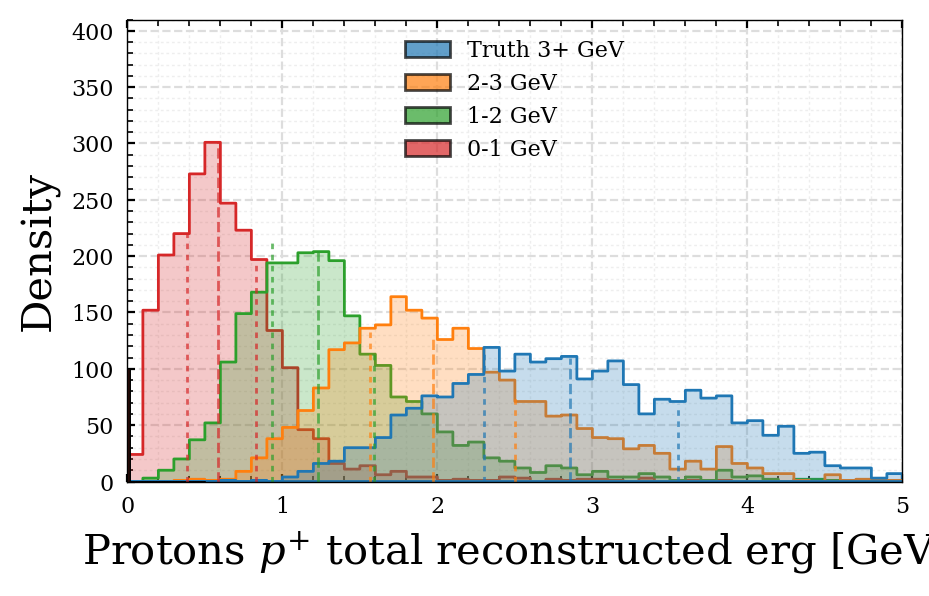

In [98]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
def part_comp(part, erg_low=0, erg_high=4):
    return np.logical_and((part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 > erg_low,
                          (part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 < erg_high)
quant = [
    protons.get('PFCandidates_energy_o1corr')[part_comp(protons, 3, 4)]/1e3,
    protons.get('PFCandidates_energy_o1corr')[part_comp(protons, 2, 3)]/1e3,
    protons.get('PFCandidates_energy_o1corr')[part_comp(protons, 1, 2)]/1e3,
    protons.get('PFCandidates_energy_o1corr')[part_comp(protons, 0, 1)]/1e3
]
labels = ['Truth 3+ GeV', '2-3 GeV', '1-2 GeV', '0-1 GeV']
plotting.hist(fig, ax, quant, labels, binwidth=0.1,
              xlim=[0, 5], ylim=[0, 410],
              draw_median=True, draw_quartiles=True,
              xlabel=f'{labels_dict["proton"]} total reconstructed erg [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.legend(loc='upper center')
plt.show()

#### Electrons: spread at low ecal

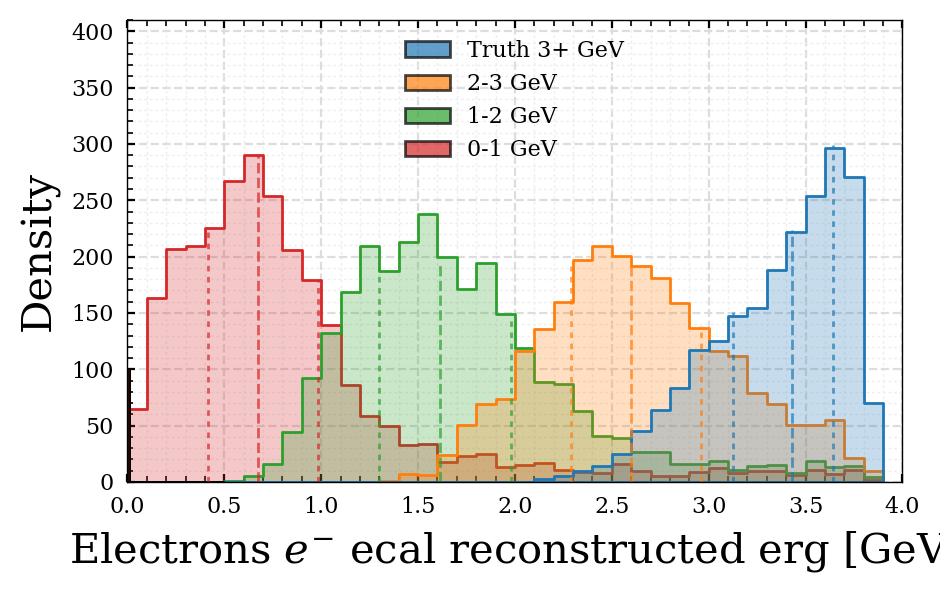

In [99]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
def part_comp(part, erg_low=0, erg_high=4):
    return np.logical_and((part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 > erg_low,
                          (part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 < erg_high)
quant = [
    electrons.get('PFCandidates_ecalEnergy_o1corr')[part_comp(electrons, 3, 4)]/1e3,
    electrons.get('PFCandidates_ecalEnergy_o1corr')[part_comp(electrons, 2, 3)]/1e3,
    electrons.get('PFCandidates_ecalEnergy_o1corr')[part_comp(electrons, 1, 2)]/1e3,
    electrons.get('PFCandidates_ecalEnergy_o1corr')[part_comp(electrons, 0, 1)]/1e3
]
labels = ['Truth 3+ GeV', '2-3 GeV', '1-2 GeV', '0-1 GeV']
plotting.hist(fig, ax, quant, labels, binwidth=0.1,
              xlim=[0, 4], ylim=[0, 410],
              draw_median=True, draw_quartiles=True,
              xlabel=f'{labels_dict["electron"]} ecal reconstructed erg [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.legend(loc='upper center')
plt.show()

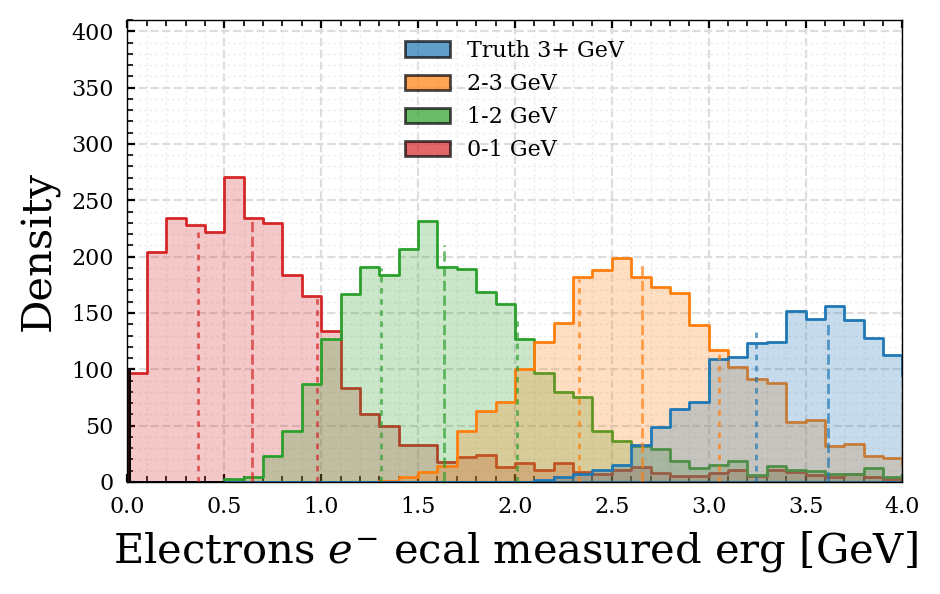

In [100]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
def part_comp(part, erg_low=0, erg_high=4):
    return np.logical_and((part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 > erg_low,
                          (part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 < erg_high)
quant = [
    electrons.get('PFCandidates_ecalEnergy')[part_comp(electrons, 3, 4)]/1e3,
    electrons.get('PFCandidates_ecalEnergy')[part_comp(electrons, 2, 3)]/1e3,
    electrons.get('PFCandidates_ecalEnergy')[part_comp(electrons, 1, 2)]/1e3,
    electrons.get('PFCandidates_ecalEnergy')[part_comp(electrons, 0, 1)]/1e3
]
labels = ['Truth 3+ GeV', '2-3 GeV', '1-2 GeV', '0-1 GeV']
plotting.hist(fig, ax, quant, labels, binwidth=0.1,
              xlim=[0, 4], ylim=[0, 410],
              draw_median=True, draw_quartiles=True,
              xlabel=f'{labels_dict["electron"]} ecal measured erg [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.legend(loc='upper center')
plt.show()

#### Pions: double peak

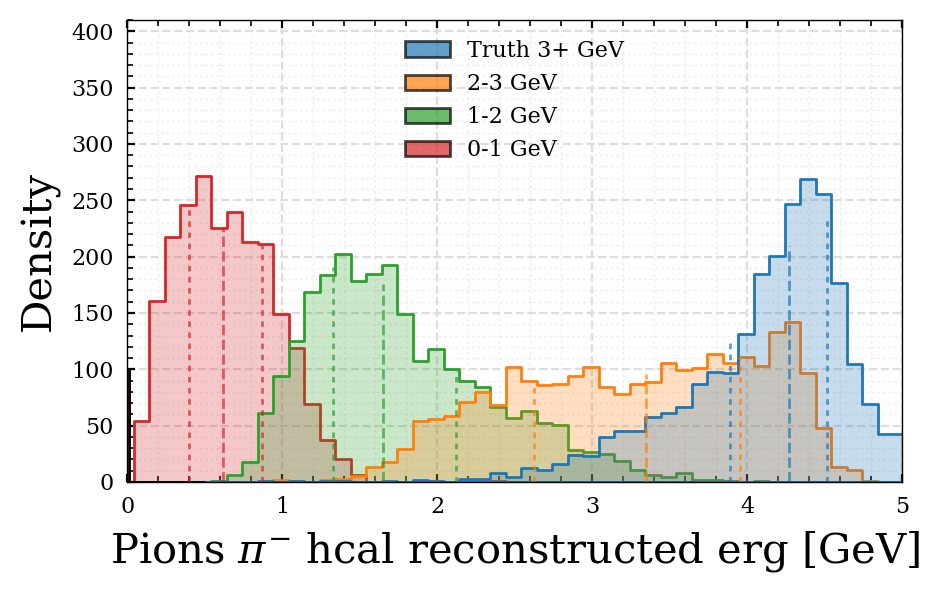

In [110]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
def part_comp(part, erg_low=0, erg_high=4):
    return np.logical_and((part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 > erg_low,
                          (part.get('PFTruthEcal_energy')+part.get('PFTruthHcal_energy'))/1e3 < erg_high)
quant = [
    pions.get('PFCandidates_energy_o1corr')[part_comp(pions, 3, 4)]/1e3,
    pions.get('PFCandidates_energy_o1corr')[part_comp(pions, 2, 3)]/1e3,
    pions.get('PFCandidates_energy_o1corr')[part_comp(pions, 1, 2)]/1e3,
    pions.get('PFCandidates_energy_o1corr')[part_comp(pions, 0, 1)]/1e3
]
labels = ['Truth 3+ GeV', '2-3 GeV', '1-2 GeV', '0-1 GeV']
plotting.hist(fig, ax, quant, labels, binwidth=0.1,
              xlim=[0, 5], ylim=[0, 410],
              draw_median=True, draw_quartiles=True,
              xlabel=f'{labels_dict["pion"]} hcal reconstructed erg [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.legend(loc='upper center')
plt.show()

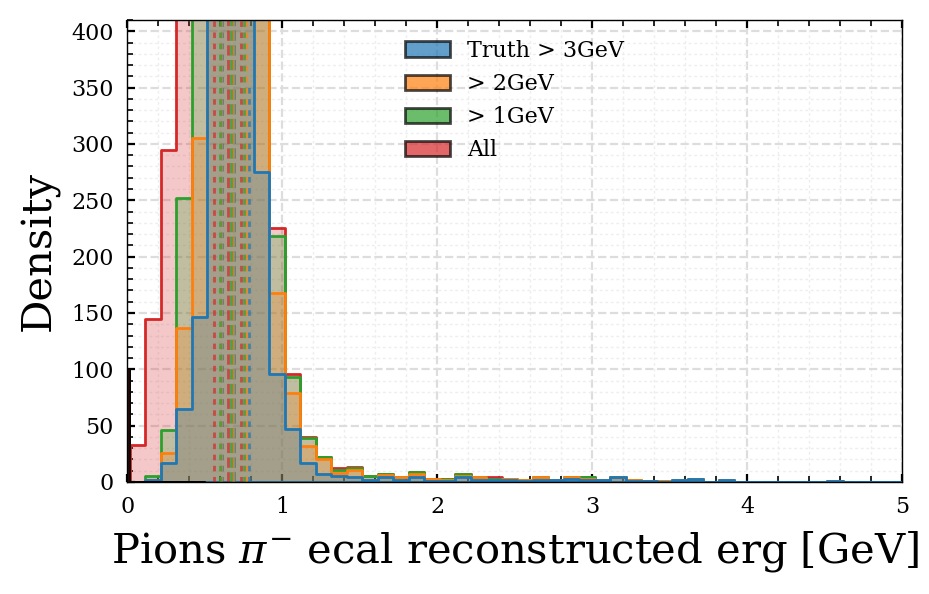

In [102]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
quant = [
    pions.get('PFCandidates_ecalEnergy_o1corr')[pions.get('PFTruthEcal_energy') > 3e3]/1e3,
    pions.get('PFCandidates_ecalEnergy_o1corr')[pions.get('PFTruthEcal_energy') > 2e3]/1e3,
    pions.get('PFCandidates_ecalEnergy_o1corr')[pions.get('PFTruthEcal_energy') > 1e3]/1e3,
    pions.get('PFCandidates_ecalEnergy_o1corr')/1e3
]
labels = ['Truth > 3GeV', '> 2GeV', '> 1GeV', 'All']
plotting.hist(fig, ax, quant, labels, binwidth=0.1,
              xlim=[0, 5], ylim=[0, 410],
              draw_median=True, draw_quartiles=True,
              xlabel=f'{labels_dict["pion"]} ecal reconstructed erg [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.legend(loc='upper center')
plt.show()

### Corrected energy makeups

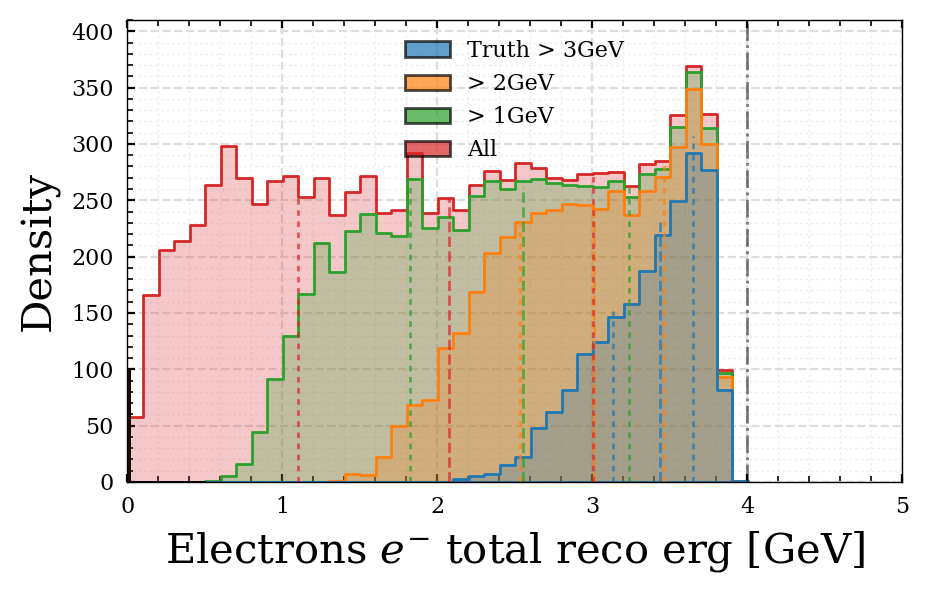

In [103]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
quant = [
    electrons.get('PFCandidates_energy_o1corr')[electrons.get('PFTruthEcal_energy') > 3e3]/1e3,
    electrons.get('PFCandidates_energy_o1corr')[electrons.get('PFTruthEcal_energy') > 2e3]/1e3,
    electrons.get('PFCandidates_energy_o1corr')[electrons.get('PFTruthEcal_energy') > 1e3]/1e3,
    electrons.get('PFCandidates_energy_o1corr')/1e3
]
labels = ['Truth > 3GeV', '> 2GeV', '> 1GeV', 'All']
plotting.hist(fig, ax, quant, labels, binwidth=0.1,
              xlim=[0, 5], ylim=[0, 410],
              draw_median=True, draw_quartiles=True,
              xlabel=f'{labels_dict["electron"]} total reco erg [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.axvline(4, ls='-.', lw=1, color='black', alpha=0.5)
ax.legend(loc='upper center')
plt.show()

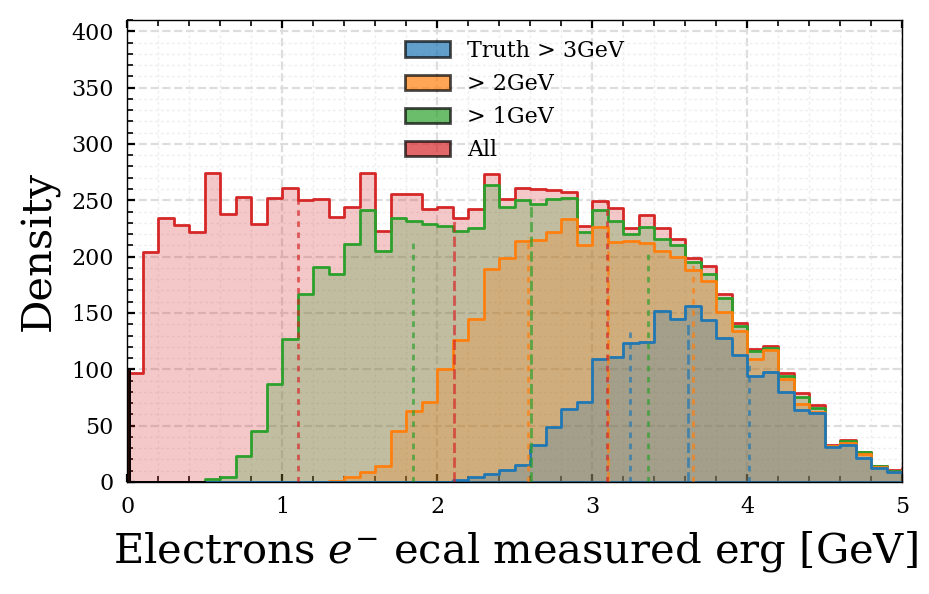

In [104]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
quant = [
    electrons.get('PFCandidates_ecalEnergy')[electrons.get('PFTruthEcal_energy') > 3e3]/1e3,
    electrons.get('PFCandidates_ecalEnergy')[electrons.get('PFTruthEcal_energy') > 2e3]/1e3,
    electrons.get('PFCandidates_ecalEnergy')[electrons.get('PFTruthEcal_energy') > 1e3]/1e3,
    electrons.get('PFCandidates_ecalEnergy')/1e3
]
labels = ['Truth > 3GeV', '> 2GeV', '> 1GeV', 'All']
plotting.hist(fig, ax, quant, labels, binwidth=0.1,
              xlim=[0, 5], ylim=[0, 410],
              draw_median=True, draw_quartiles=True,
              xlabel=f'{labels_dict["electron"]} ecal measured erg [GeV]', ylabel='Density')
# ax.set_yscale('log')
ax.legend(loc='upper center')
plt.show()

# Simple Criteria Classification

## Comparisons of properties

A classification algorithm based on limit cuts. The following attributes are considered:

* `PFCandidates_ecalClusterZ`

    * How far back in the ECal detector
    
* `PFCandidates_hcalClusterZ`
    
    * How far back in the HCal detector
    
* `PFCandidates_ecalEnergy_o1corr` and `PFCandidates_hcalEnergy_o1corr`

    * Individual
    * Proportions

In [105]:
def plot_prop_comparison(prop, part1, part2, labels=['', '']):
    import seaborn as sns
    prop1 = part1.get(prop)
    prop2 = part2.get(prop)
    
    g = sns.displot([prop1, prop2], kind='kde', height=3, aspect=2, legend=0)
    g.set_axis_labels(prop, 'Density')
    plt.plot(0, 0, color='blue', label=labels[0])
    plt.plot(0, 0, color='orange', label=labels[1])
    plt.legend()
    plt.show()

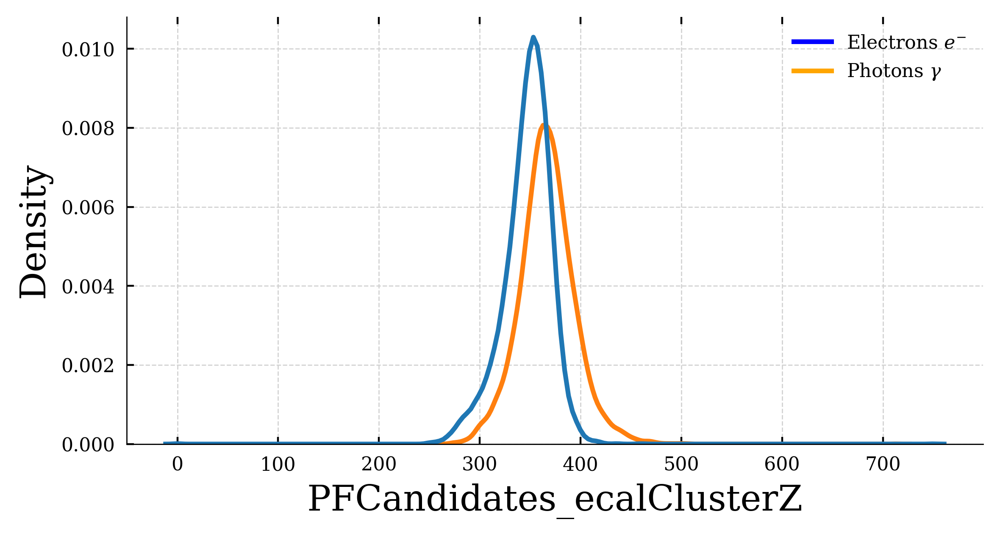

In [106]:
plot_prop_comparison('PFCandidates_ecalClusterZ', electrons, photons,
                     [labels_dict['electron'], labels_dict['photon']])

## Finding optimal separation

## Confusion matrix

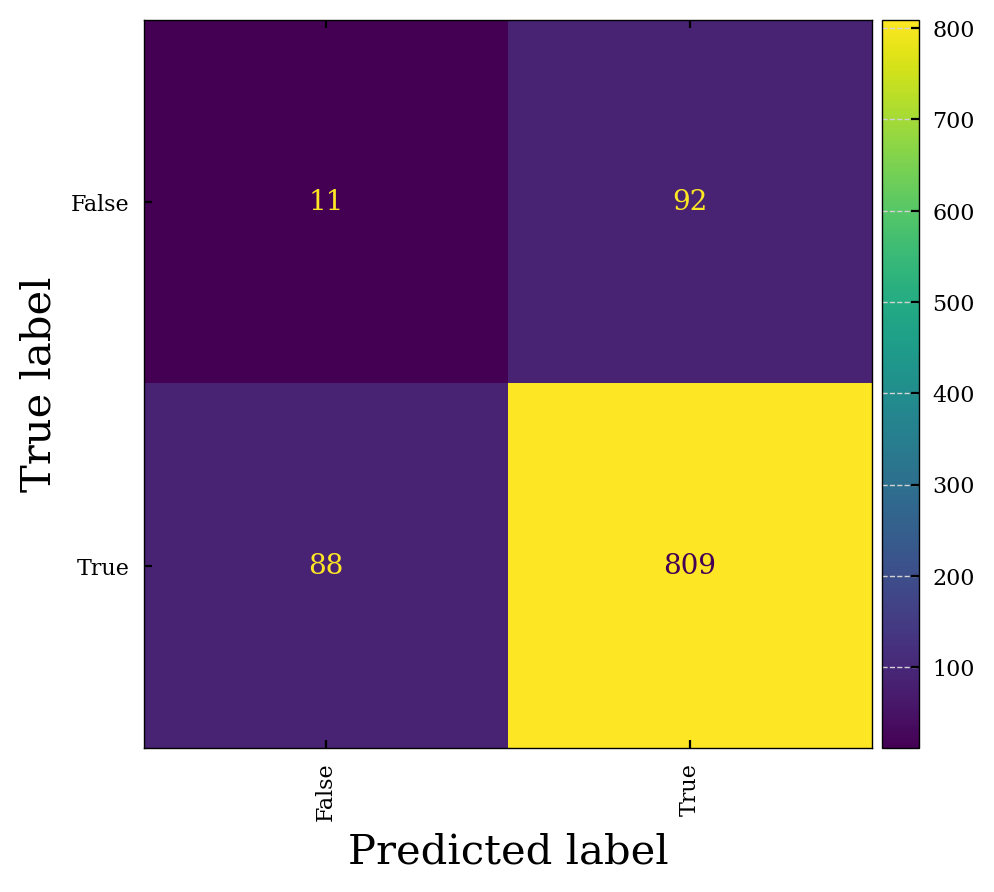

In [107]:
def plot_confusion_matrix(fig, ax, actual, predicted, cmap='viridis'):
    from sklearn import metrics
    confusion_matrix = metrics.confusion_matrix(actual, predicted)

    if (fig is None) or (ax is None):
        fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
    ax.grid(False)
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=confusion_matrix, display_labels=[False, True])
    cm_display.plot(ax=ax, colorbar=False, cmap=cmap, xticks_rotation='vertical')
    plotting.colorbar(cm_display.im_)
    plt.show()
    
actual = np.random.binomial(1, .9, size=1000)
predicted = np.random.binomial(1, .9, size = 1000)
fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
plot_confusion_matrix(fig, ax, actual, predicted)